Running Greedy Heuristic with r-gathering...
Results:
  Total demand served: 825.00
  Open facilities: [69, 21, 51, 71, 70, 38, 14, 33, 37, 40, 22]
  Time: 0.2254s


C:\Users\Prateek\AppData\Local\Temp\ipykernel_20536\710533109.py:137: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab20', len(open_facilities))


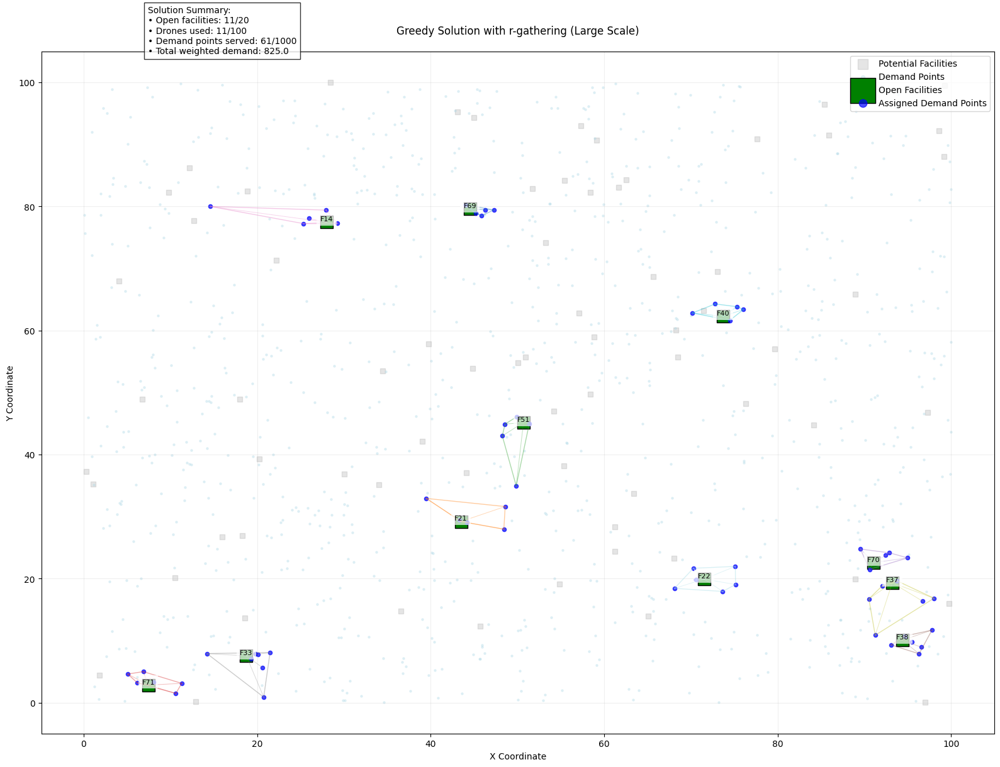

C:\Users\Prateek\AppData\Local\Temp\ipykernel_20536\710533109.py:219: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab20', len(open_facilities))


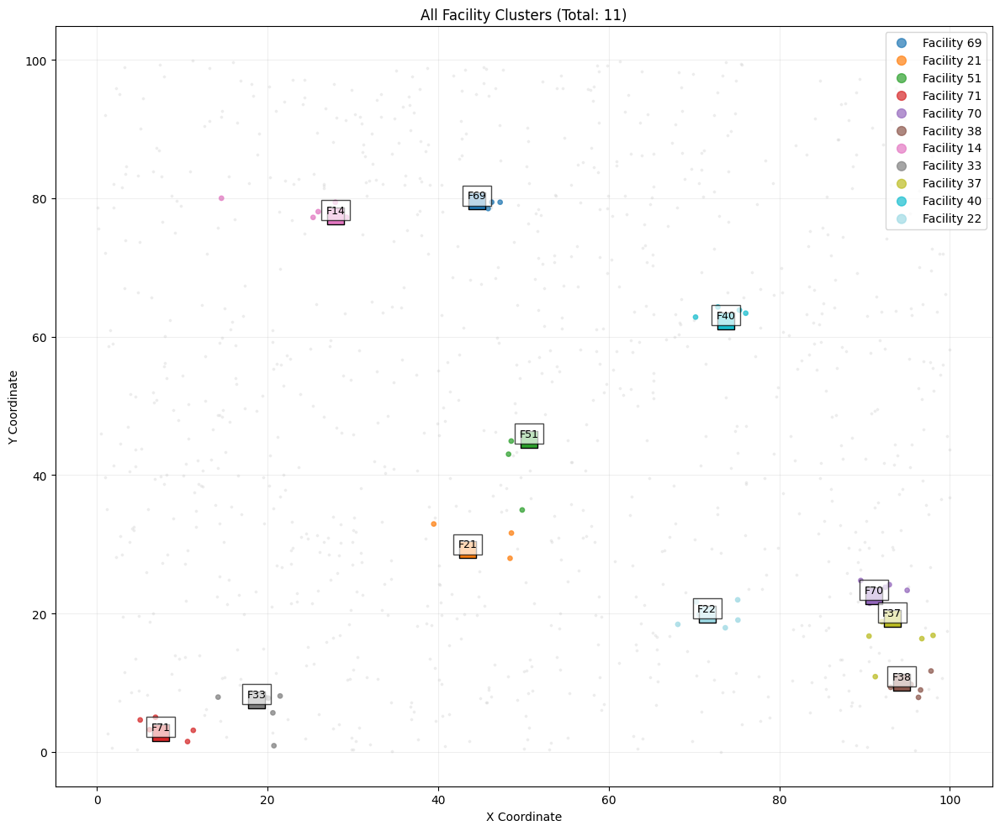

C:\Users\Prateek\AppData\Local\Temp\ipykernel_20536\710533109.py:288: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10', len(assignments.get(j, [])))


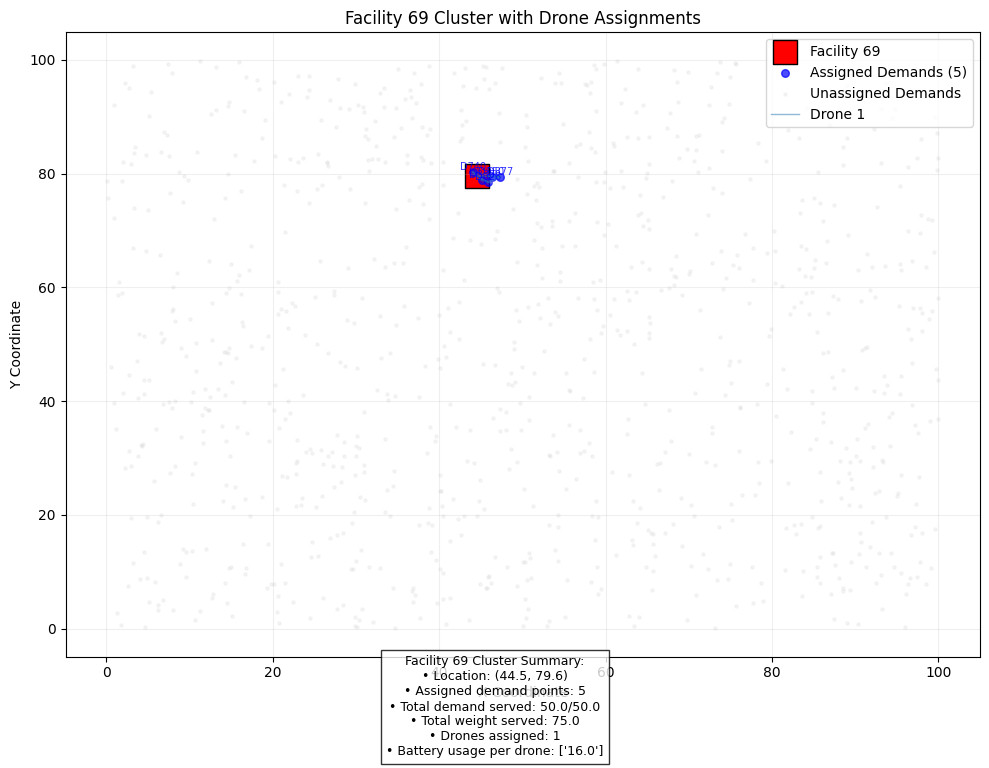

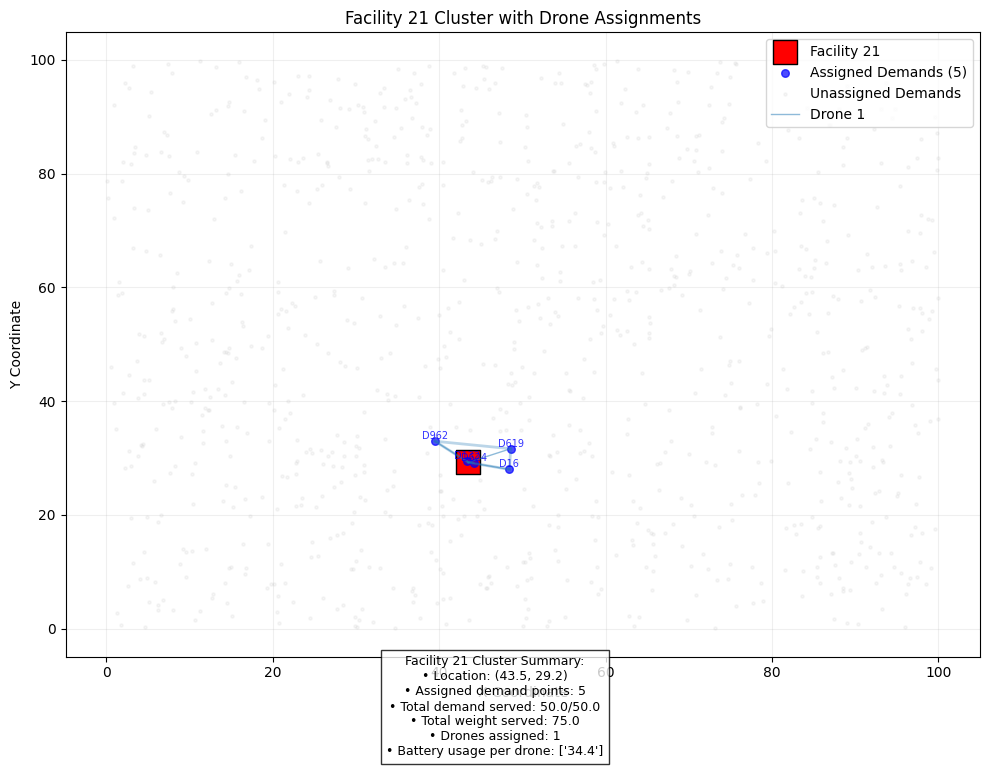

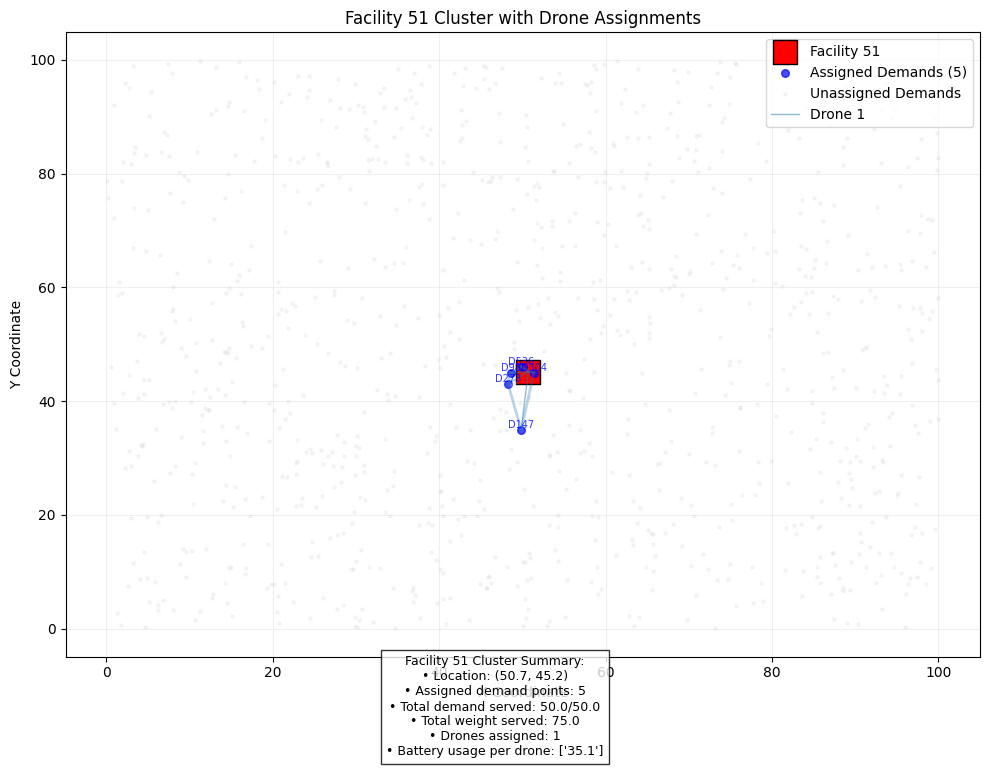

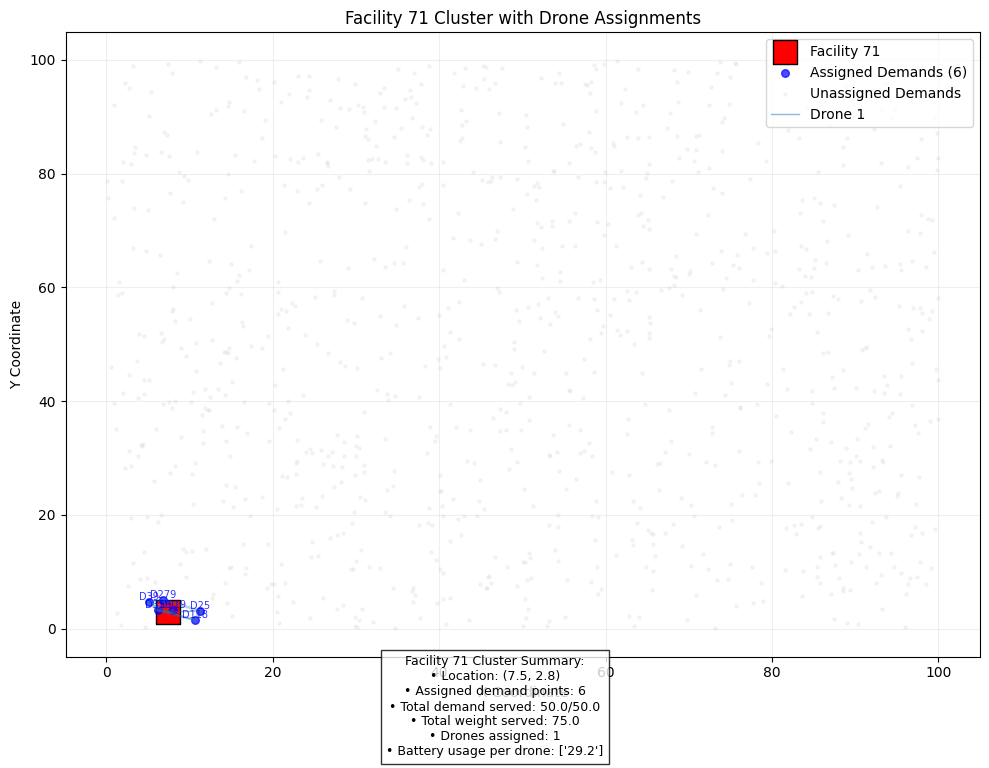

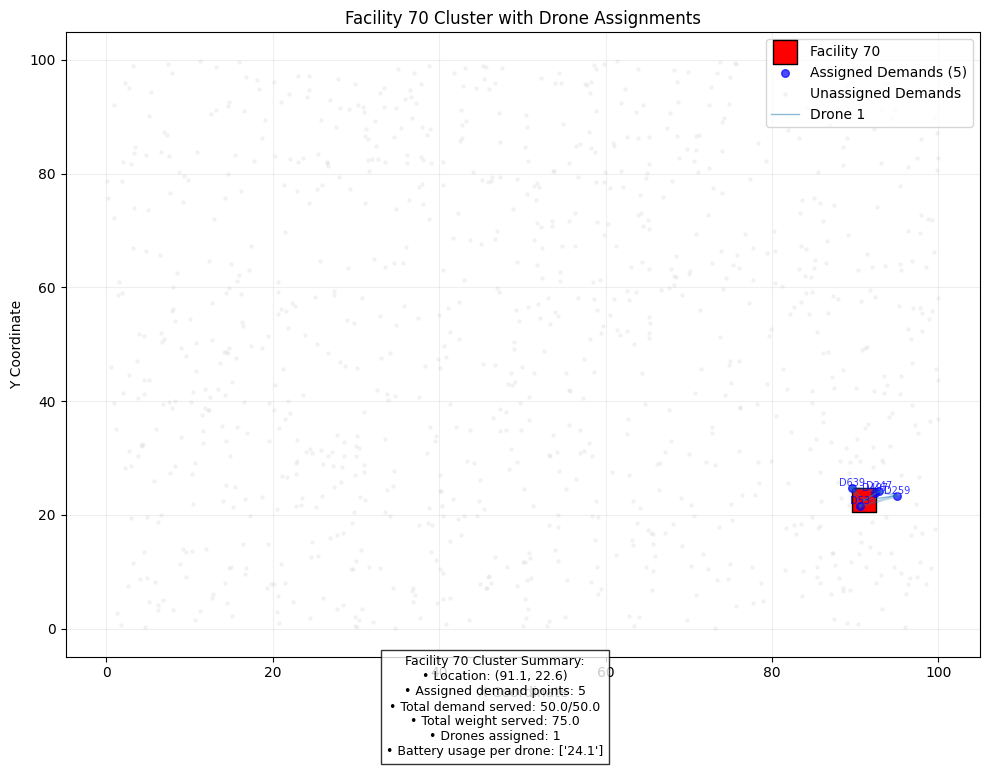

...

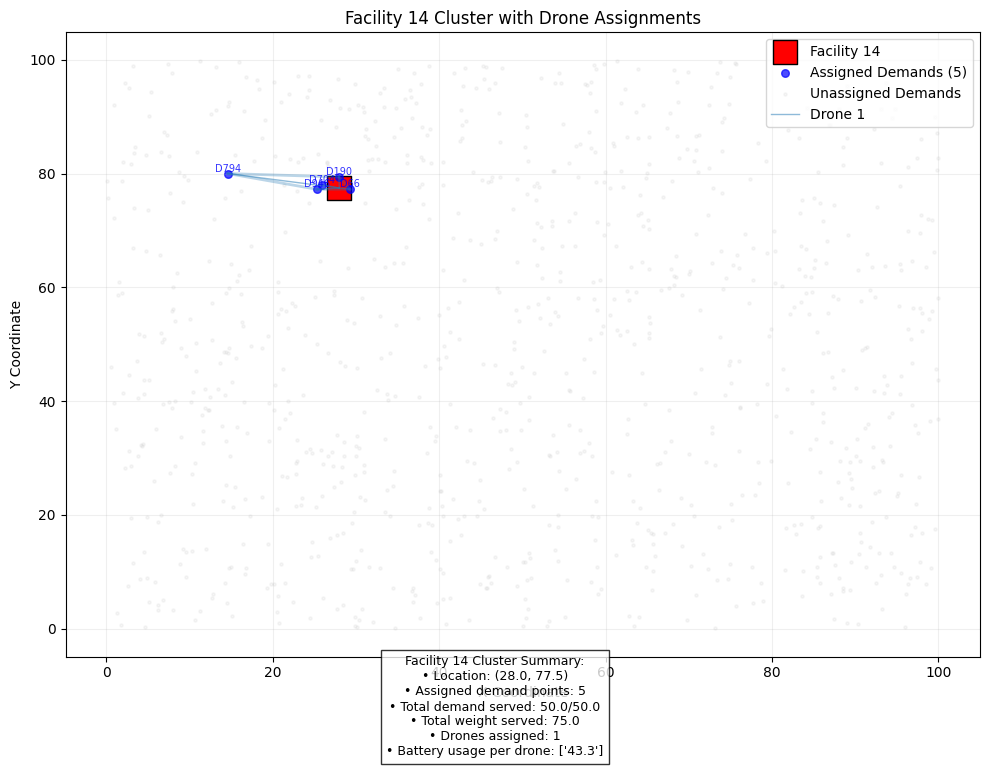

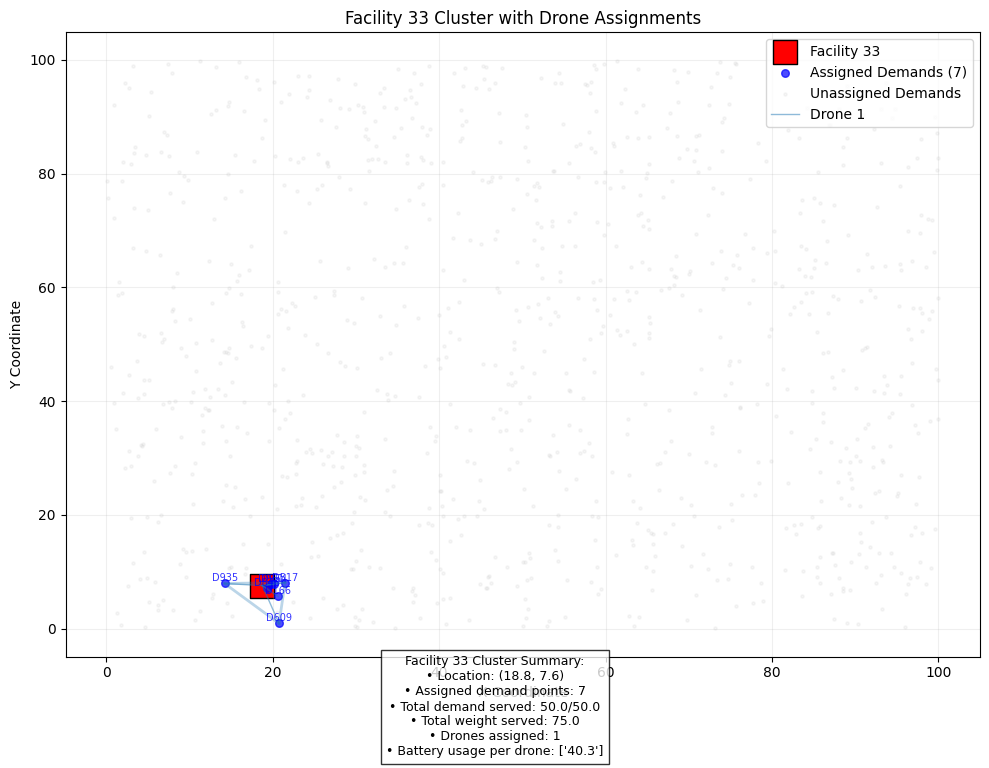

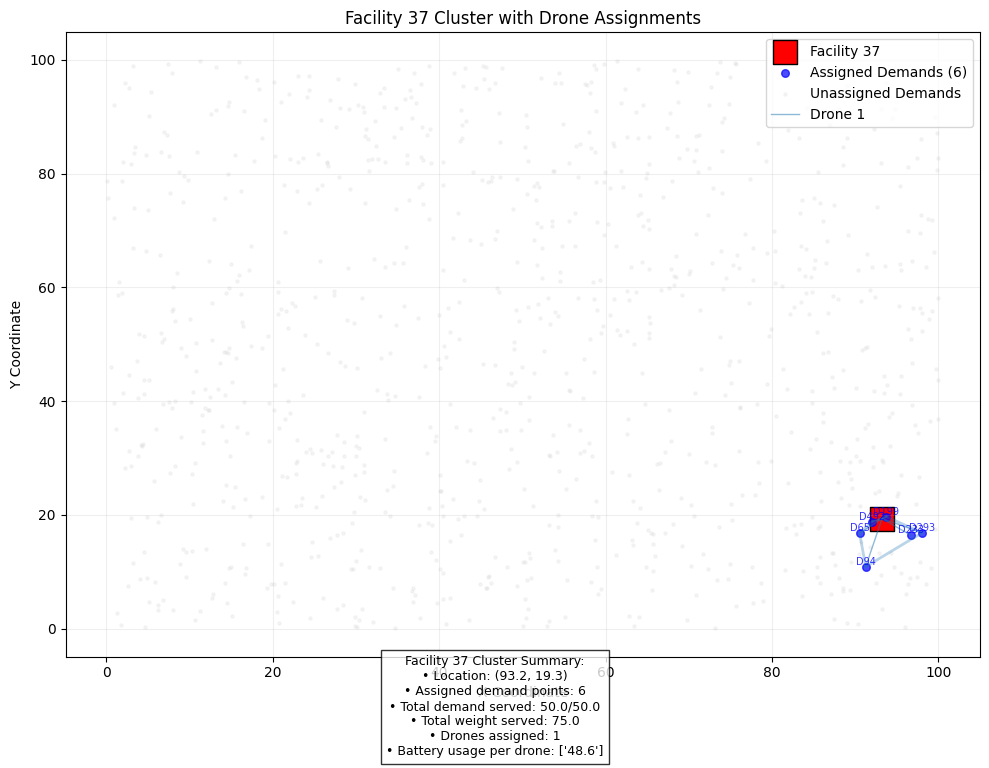

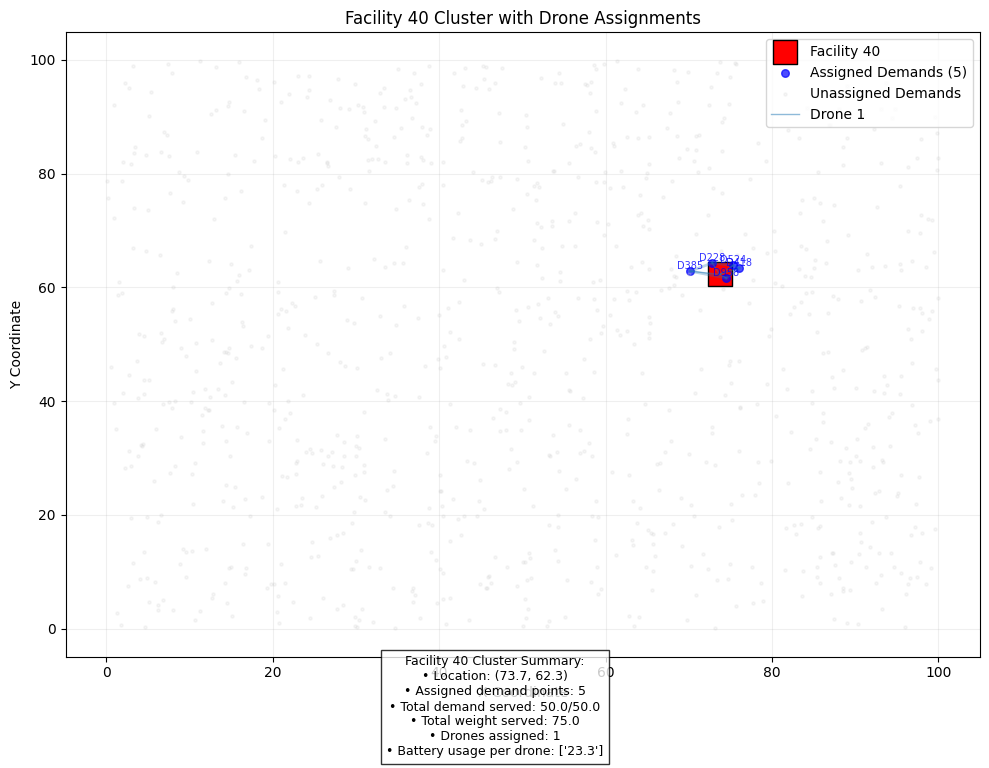

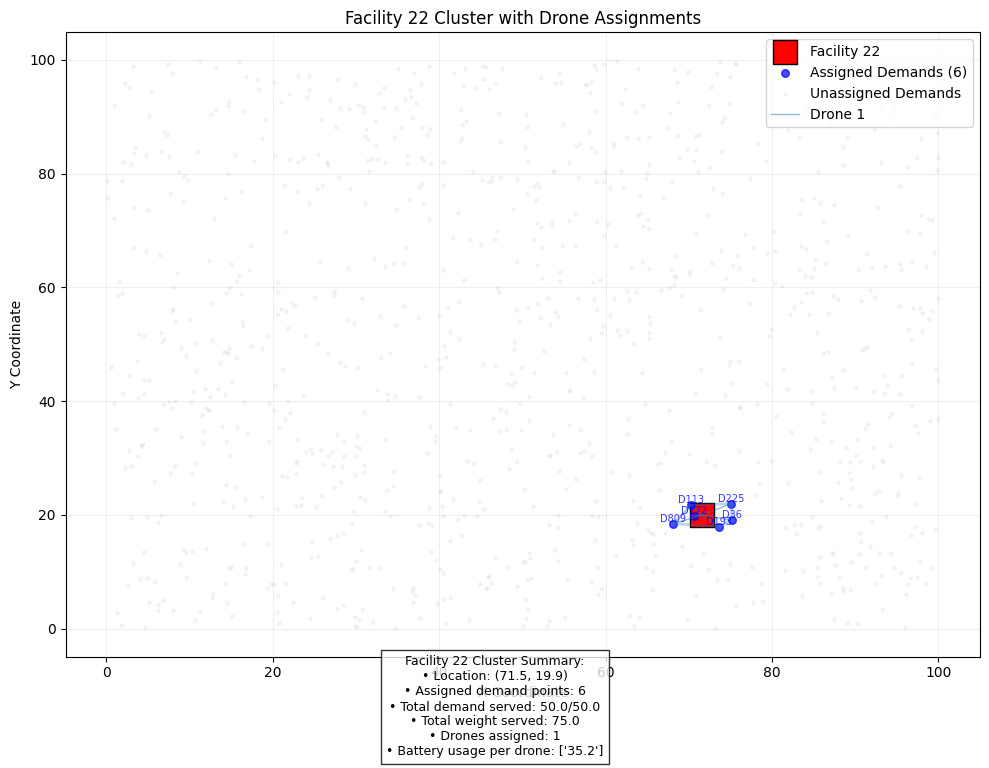


Running Three-Stage Heuristic with r-gathering...
Results:
  Total demand served: 1500.00
  Open facilities: [16, 72, 74, 20, 65, 73, 22, 3, 56, 68, 31, 36, 70, 77, 27, 18, 14, 78, 32, 25]
  Time: 1396.0427s


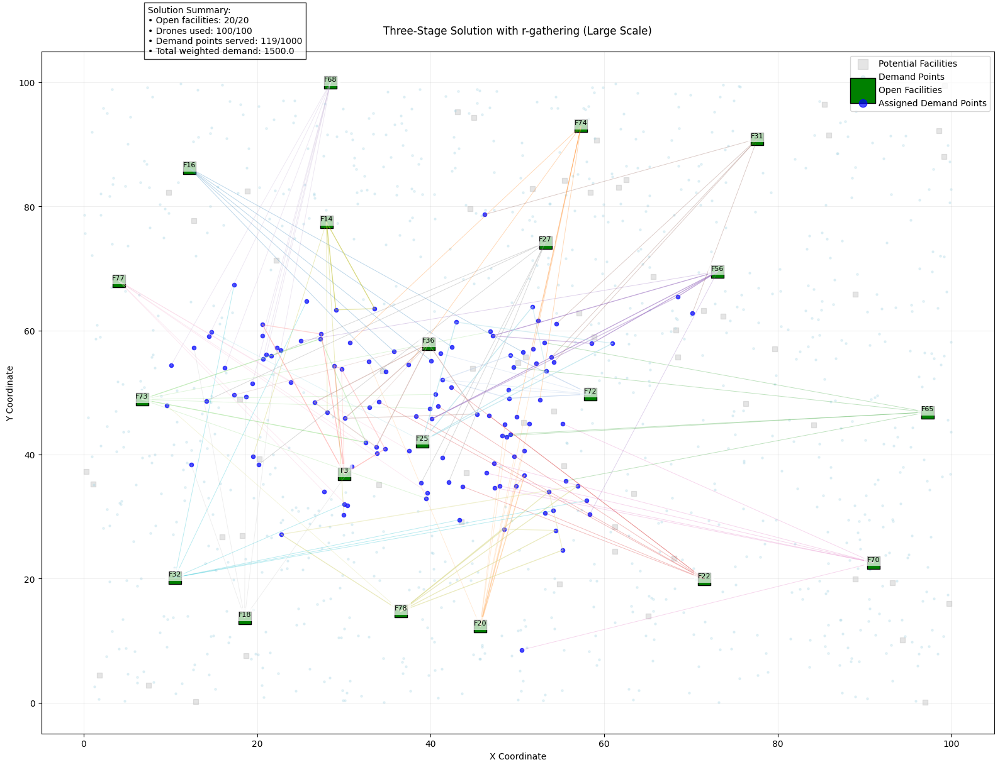

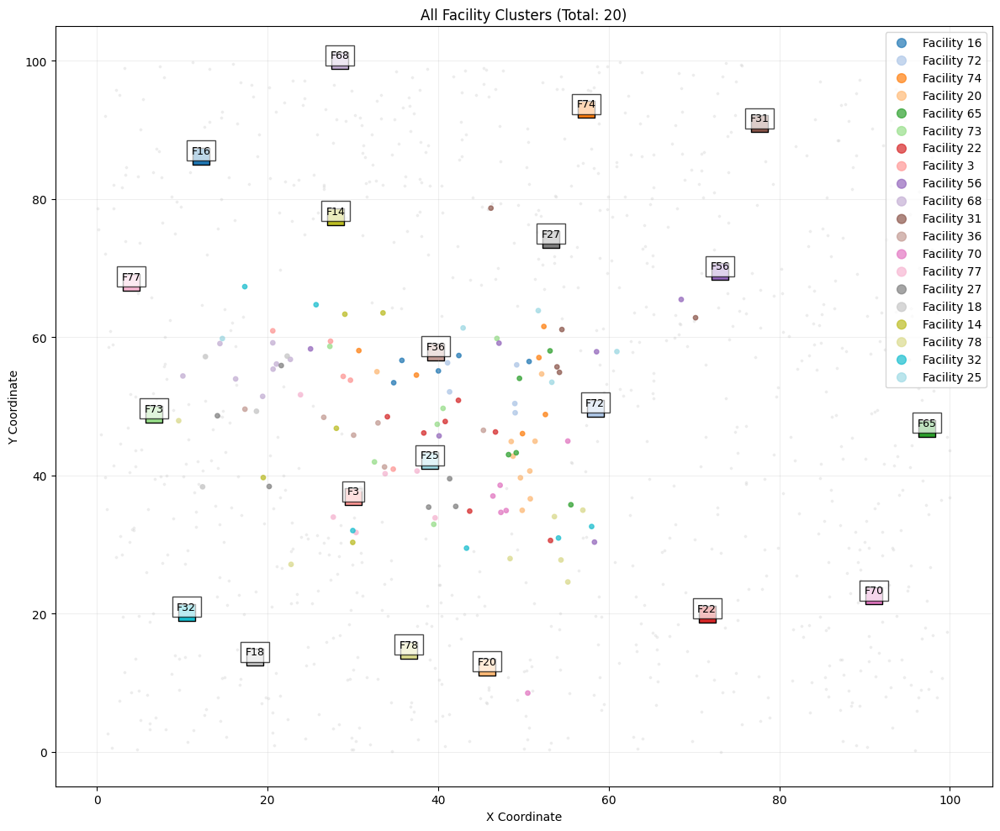

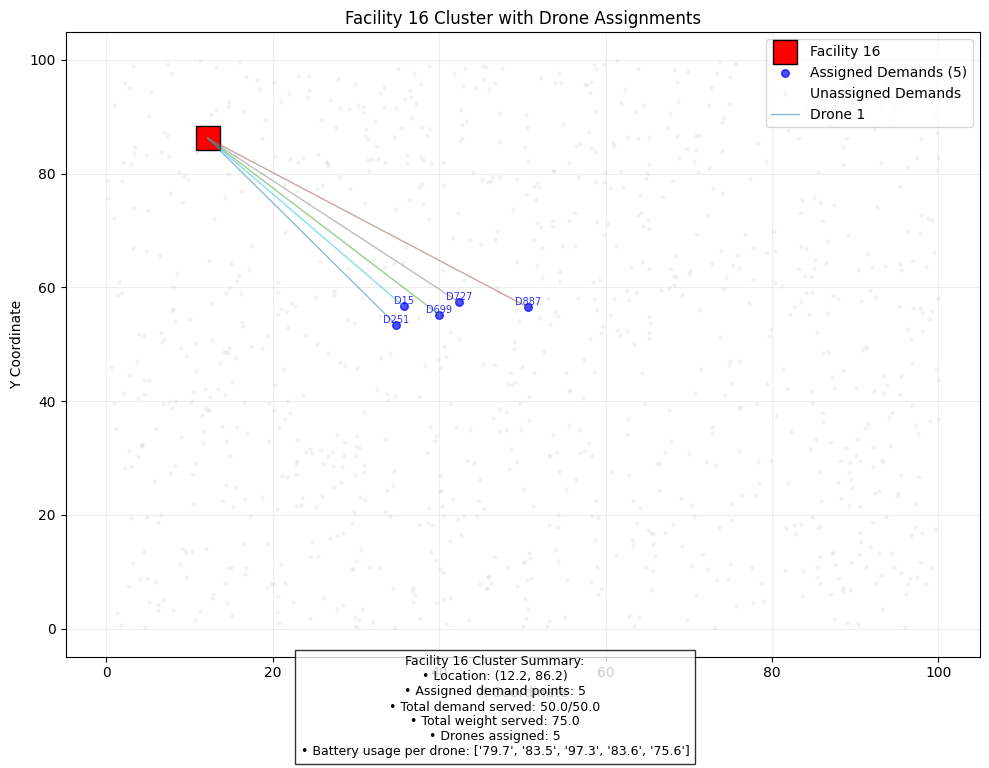

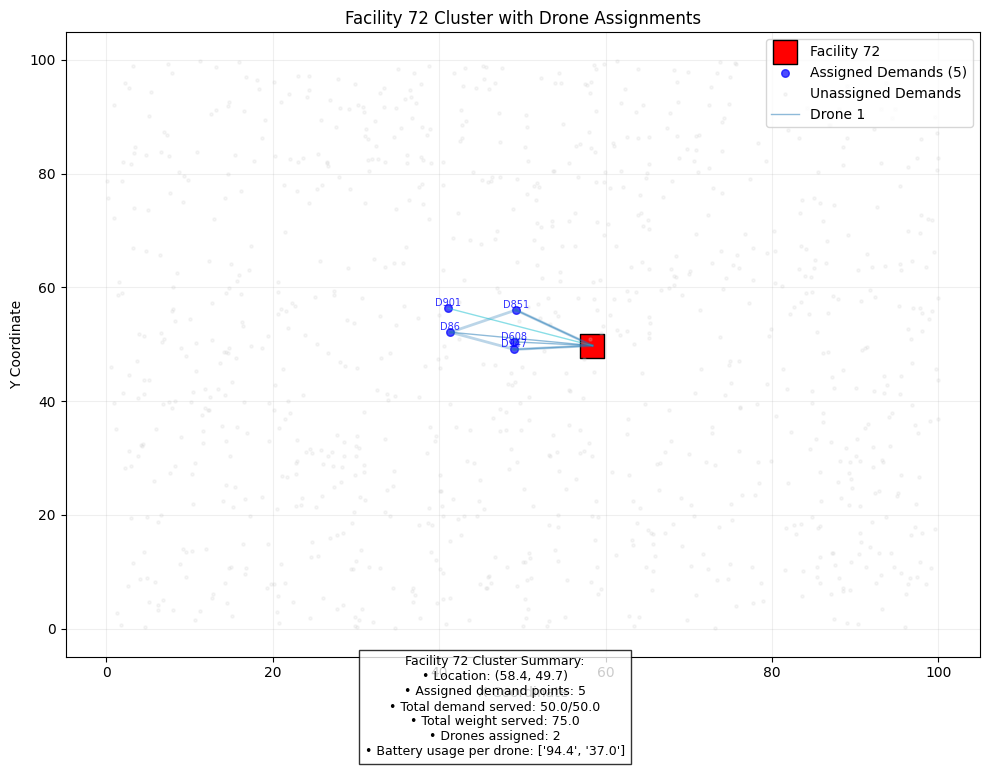

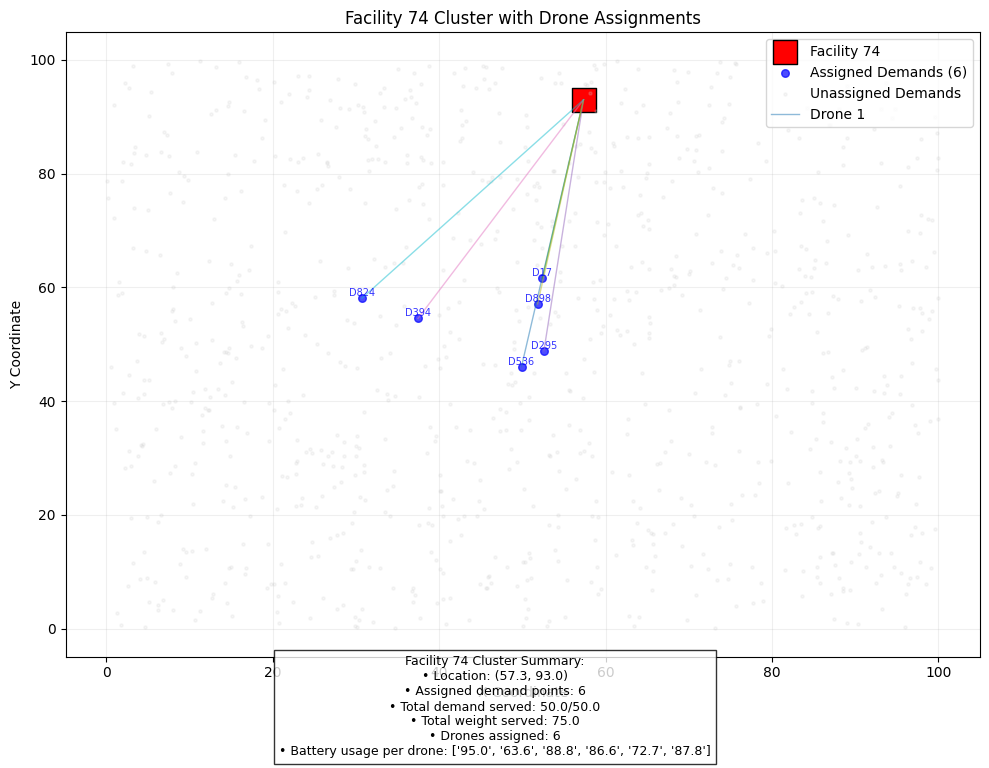

...

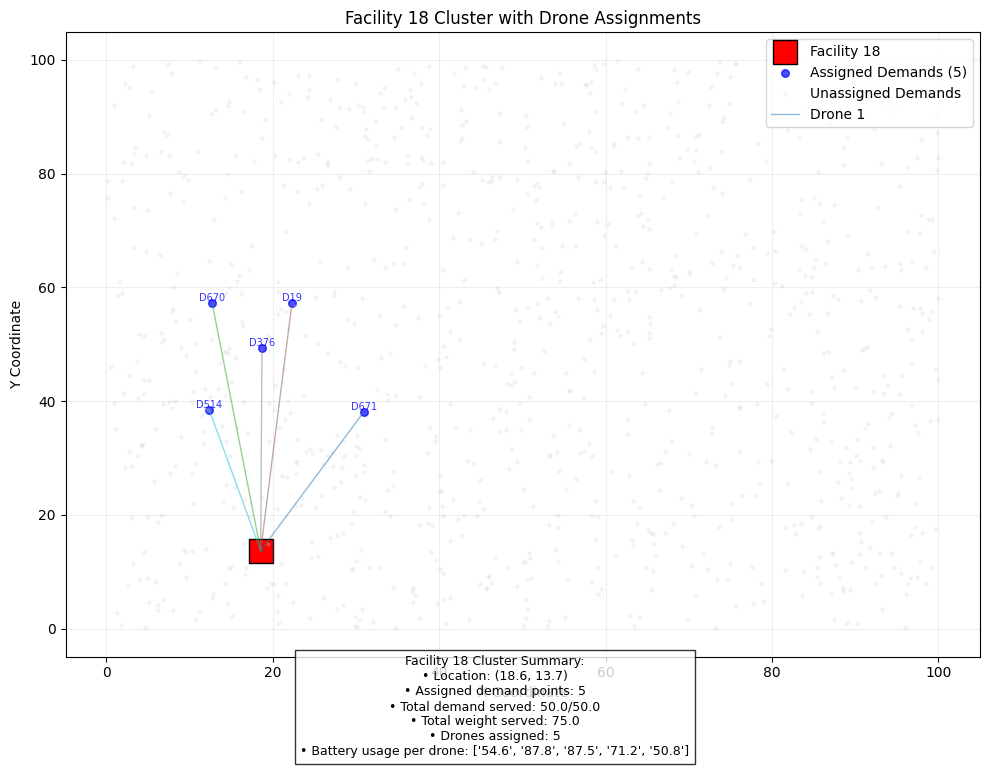

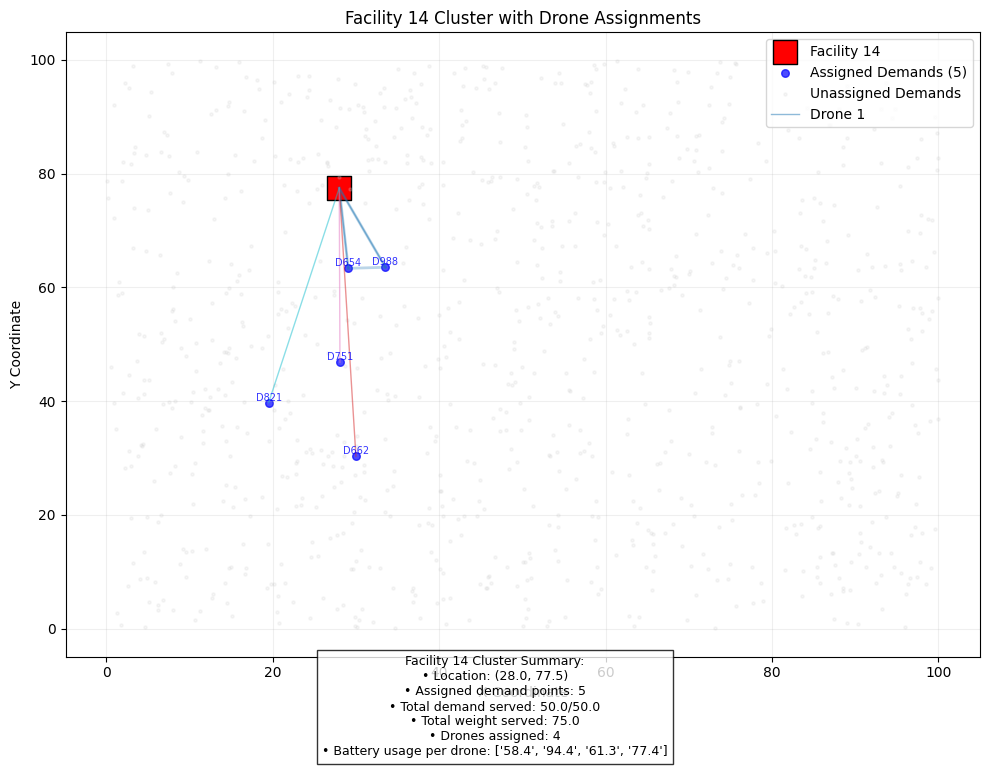

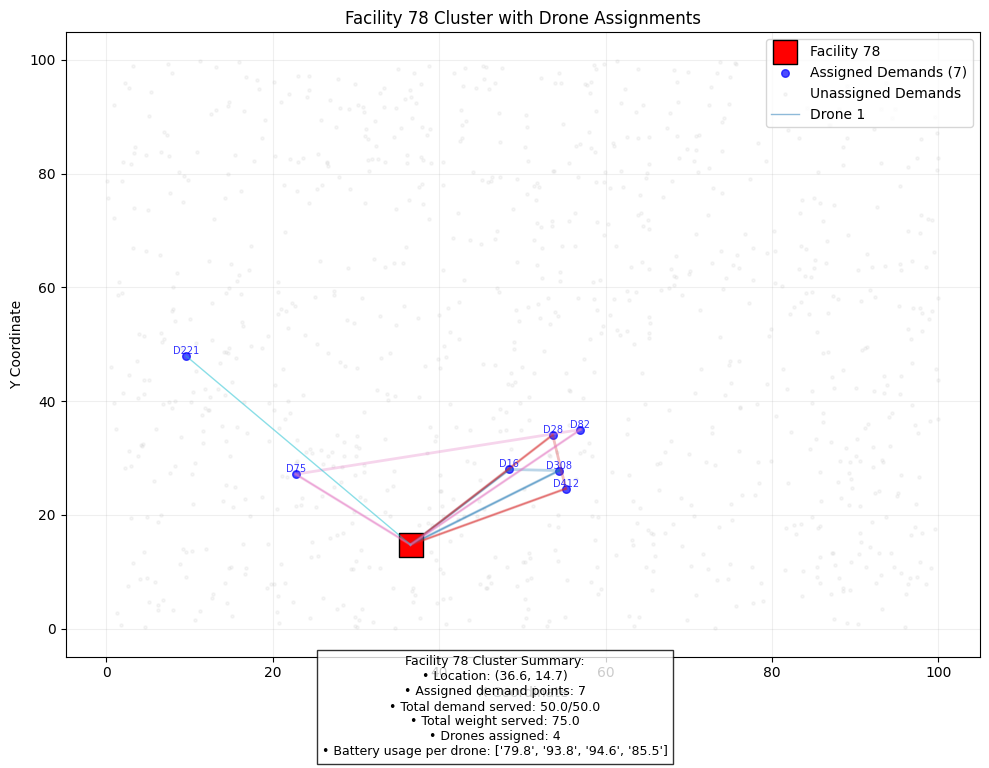

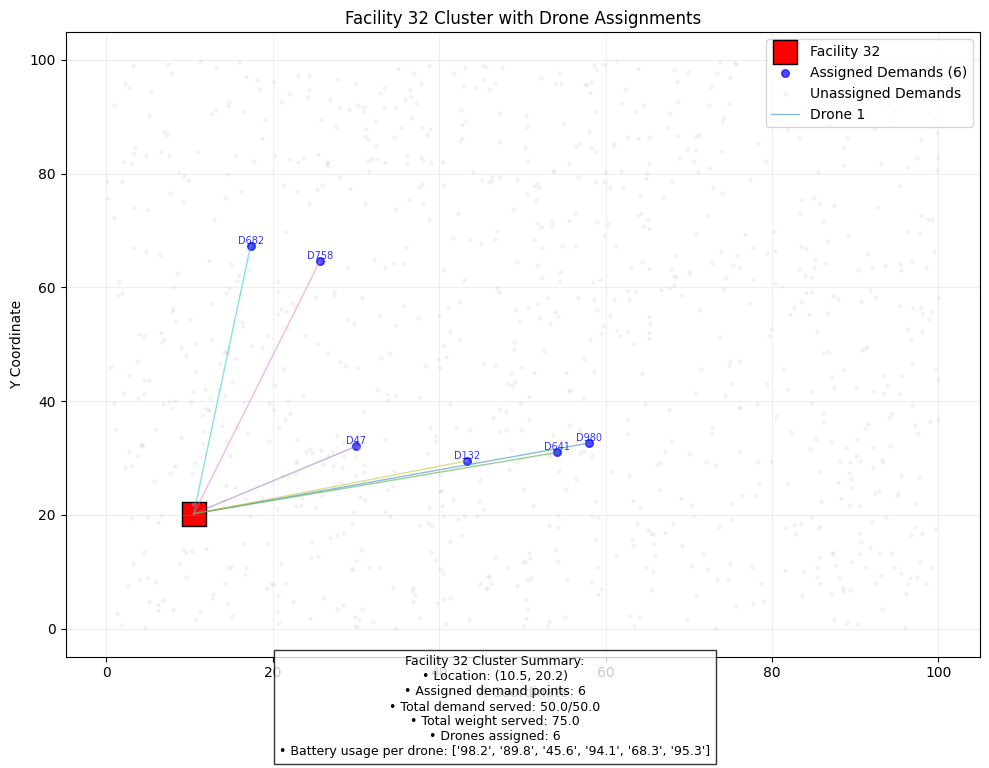

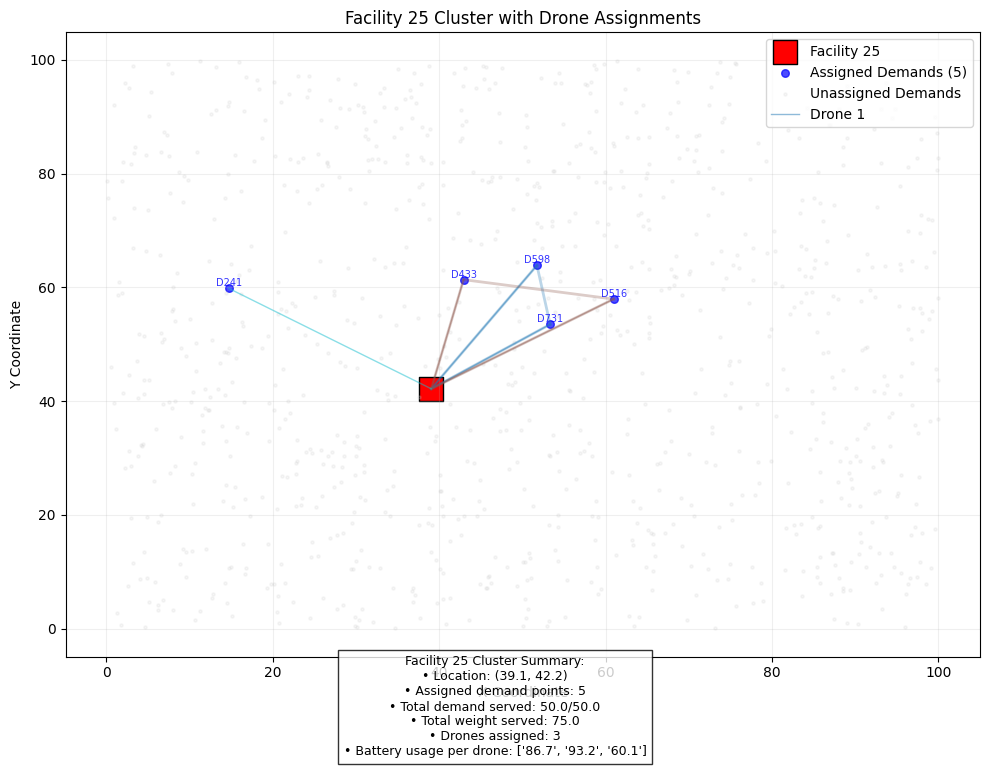

In [ ]:
import numpy as np
import heapq
from ortools.linear_solver import pywraplp
import random
from typing import List, Tuple, Dict, Set, DefaultDict
from collections import defaultdict
import matplotlib.pyplot as plt
import time
import math
from scipy.spatial import ConvexHull

class MCFLPD_Solver:
    """
    A solver class for the Maximum Coverage Capacitated Facility Location Problem
    with Range Constrained Drones (MCFLPD) and r-gathering constraints.
    """

    def __init__(self,
                 p: int,
                 K: int,
                 U: float,
                 B: float,
                 d: List[float],
                 b: List[List[float]],
                 w: List[float],
                 facility_locations: List[Tuple[float, float]] = None,
                 demand_locations: List[Tuple[float, float]] = None):
        """
        Initialize the MCFLPD solver with problem parameters and optional coordinates for visualization.
        """
        self.p = p
        self.K = K
        self.U = U
        self.B = B
        self.d = d
        self.b = b
        self.w = w
        self.num_demand_points = len(d)
        self.num_facility_locations = len(b[0]) if self.num_demand_points > 0 else 0

        # For visualization
        self.facility_locations = facility_locations if facility_locations else self._generate_default_locations(self.num_facility_locations)
        self.demand_locations = demand_locations if demand_locations else self._generate_default_locations(self.num_demand_points)

        # Validate coordinate data
        if len(self.facility_locations) != self.num_facility_locations:
            raise ValueError("Number of facility locations must match number of facility indices in b matrix")
        if len(self.demand_locations) != self.num_demand_points:
            raise ValueError("Number of demand locations must match length of demand list d")

    def _generate_default_locations(self, n: int) -> List[Tuple[float, float]]:
        """Generate random locations if none are provided."""
        return [(random.uniform(0, 100), random.uniform(0, 100)) for _ in range(n)]

    def _euclidean_distance(self, a: Tuple[float, float], b: Tuple[float, float]) -> float:
        """Calculate Euclidean distance between two points"""
        return math.sqrt((a[0]-b[0])**2 + (a[1]-b[1])**2)

    def _p_dispersion_selection(self, points: List[Tuple[float, float]], p: int) -> List[int]:
        """Select p facilities using p-dispersion (maximin) criterion"""
        if p >= len(points):
            return list(range(len(points)))

        # Start with the two farthest points
        max_dist = -1
        selected_indices = []

        # Find the pair with maximum distance
        for i in range(len(points)):
            for j in range(i+1, len(points)):
                dist = self._euclidean_distance(points[i], points[j])
                if dist > max_dist:
                    max_dist = dist
                    idx1, idx2 = i, j

        selected_indices = [idx1, idx2]

        # Greedily add points that maximize the minimum distance
        while len(selected_indices) < p:
            max_min_dist = -1
            best_idx = None

            for candidate_idx in range(len(points)):
                if candidate_idx in selected_indices:
                    continue

                # Calculate minimum distance from candidate to selected points
                min_dist = min(self._euclidean_distance(points[candidate_idx], points[s]) 
                              for s in selected_indices)

                if min_dist > max_min_dist:
                    max_min_dist = min_dist
                    best_idx = candidate_idx

            selected_indices.append(best_idx)

        return selected_indices

    def visualize_solution(self, 
                         open_facilities: List[int], 
                         assignments: Dict[int, List[List[int]]],
                         title: str = "MCFLPD Solution Visualization",
                         max_demand_points_to_label: int = 50) -> None:
        """
        Visualize the solution showing facilities, demand points, and drone routes.
        Optimized for large number of demand points.
        """
        plt.figure(figsize=(16, 12))
        
        # Plot all potential facility locations (gray)
        all_facility_x = [loc[0] for loc in self.facility_locations]
        all_facility_y = [loc[1] for loc in self.facility_locations]
        plt.scatter(all_facility_x, all_facility_y, c='gray', s=30, marker='s', label='Potential Facilities', alpha=0.2)
        
        # Plot all demand points (light blue, small)
        demand_x = [loc[0] for loc in self.demand_locations]
        demand_y = [loc[1] for loc in self.demand_locations]
        plt.scatter(demand_x, demand_y, c='lightblue', s=5, label='Demand Points', alpha=0.3)
        
        # Plot open facilities (green)
        open_facility_x = [self.facility_locations[j][0] for j in open_facilities]
        open_facility_y = [self.facility_locations[j][1] for j in open_facilities]
        plt.scatter(open_facility_x, open_facility_y, c='green', s=200, marker='s', label='Open Facilities', edgecolors='black')
        
        # Collect all assigned demand points for visualization
        assigned_demands = set()
        for j, drone_paths in assignments.items():
            for path in drone_paths:
                assigned_demands.update(path)
        
        # Plot assigned demand points (blue)
        assigned_x = [self.demand_locations[i][0] for i in assigned_demands]
        assigned_y = [self.demand_locations[i][1] for i in assigned_demands]
        plt.scatter(assigned_x, assigned_y, c='blue', s=20, label='Assigned Demand Points', alpha=0.7)
        
        # Plot drone routes (colored arrows)
        colors = plt.cm.get_cmap('tab20', len(open_facilities))
        for idx, j in enumerate(open_facilities):
            facility_loc = self.facility_locations[j]
            for drone_path in assignments.get(j, []):
                if not drone_path:
                    continue
                    
                # Calculate convex hull for this drone's path
                points = [self.demand_locations[i] for i in drone_path]
                points.append(facility_loc)
                
                try:
                    hull = ConvexHull(points)
                    for simplex in hull.simplices:
                        plt.plot([points[simplex[0]][0], points[simplex[1]][0]],
                                [points[simplex[0]][1], points[simplex[1]][1]], 
                                color=colors(idx), alpha=0.4, linewidth=1)
                except:
                    # Fallback if convex hull fails (collinear points)
                    pass
                
                # Draw lines to facility
                for i in drone_path:
                    demand_loc = self.demand_locations[i]
                    plt.plot([facility_loc[0], demand_loc[0]],
                            [facility_loc[1], demand_loc[1]],
                            color=colors(idx), alpha=0.3, linewidth=0.7)
        
        # Add labels for open facilities
        for j in open_facilities:
            plt.text(self.facility_locations[j][0], self.facility_locations[j][1], 
                    f'F{j}', ha='center', va='bottom', color='black', fontsize=8,
                    bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
        
        # Add labels for a subset of assigned demand points (to avoid clutter)
        if len(assigned_demands) <= max_demand_points_to_label:
            for i in assigned_demands:
                plt.text(self.demand_locations[i][0], self.demand_locations[i][1], 
                        f'D{i}', ha='center', va='bottom', 
                        color='blue', fontsize=6, alpha=0.7)
        
        # Add statistics to the plot
        total_assigned = len(assigned_demands)
        total_demand = sum(self.w[i] for i in assigned_demands)
        drones_used = sum(len(paths) for paths in assignments.values())
        
        stats_text = (f"Solution Summary:\n"
                     f"• Open facilities: {len(open_facilities)}/{self.p}\n"
                     f"• Drones used: {drones_used}/{self.K}\n"
                     f"• Demand points served: {total_assigned}/{self.num_demand_points}\n"
                     f"• Total weighted demand: {total_demand:.1f}")
        
        plt.gcf().text(0.15, 0.95, stats_text, ha='left', fontsize=10, 
                      bbox=dict(facecolor='white', alpha=0.8))
        
        # Set plot properties
        plt.title(title, pad=20)
        plt.xlabel("X Coordinate")
        plt.ylabel("Y Coordinate")
        plt.legend(loc='upper right', markerscale=2)
        plt.grid(True, alpha=0.2)
        
        plt.tight_layout()
        plt.show()

    def visualize_facility_clusters(self, 
                                  open_facilities: List[int], 
                                  assignments: Dict[int, List[List[int]]],
                                  max_demand_points_to_label: int = 30) -> None:
        """
        Generate separate cluster diagrams for each open facility showing its assigned demand points
        and drone routes. Optimized for large number of demand points.
        """
        # First create a summary plot showing all clusters
        plt.figure(figsize=(12, 10))
        
        # Plot all demand points (light gray)
        demand_x = [loc[0] for loc in self.demand_locations]
        demand_y = [loc[1] for loc in self.demand_locations]
        plt.scatter(demand_x, demand_y, c='lightgray', s=3, alpha=0.3)
        
        # Create a color map for facilities
        colors = plt.cm.get_cmap('tab20', len(open_facilities))
        
        # Plot each facility's cluster
        for idx, j in enumerate(open_facilities):
            facility_loc = self.facility_locations[j]
            
            # Get all demand points assigned to this facility
            all_assigned = []
            for path in assignments.get(j, []):
                all_assigned.extend(path)
            
            if not all_assigned:
                continue
                
            # Plot assigned demand points
            assigned_x = [self.demand_locations[i][0] for i in all_assigned]
            assigned_y = [self.demand_locations[i][1] for i in all_assigned]
            plt.scatter(assigned_x, assigned_y, c=[colors(idx)]*len(all_assigned), 
                       s=15, alpha=0.7, label=f'Facility {j}')
            
            # Plot facility
            plt.scatter(facility_loc[0], facility_loc[1], c=[colors(idx)], 
                       s=200, marker='s', edgecolor='black')
            
            # Add facility label
            plt.text(facility_loc[0], facility_loc[1], f'F{j}', 
                    ha='center', va='bottom', fontsize=9,
                    bbox=dict(facecolor='white', alpha=0.7))
        
        plt.title(f"All Facility Clusters (Total: {len(open_facilities)})")
        plt.xlabel("X Coordinate")
        plt.ylabel("Y Coordinate")
        plt.legend(loc='upper right', markerscale=2)
        plt.grid(True, alpha=0.2)
        plt.tight_layout()
        plt.show()
        
        # Now create individual plots for each facility
        for idx, j in enumerate(open_facilities):
            plt.figure(figsize=(10, 8))
            facility_loc = self.facility_locations[j]
            
            # Get all demand points assigned to this facility
            all_assigned = []
            for path in assignments.get(j, []):
                all_assigned.extend(path)
            
            if not all_assigned:
                continue
                
            # Plot the facility
            plt.scatter(facility_loc[0], facility_loc[1], c='red', 
                       s=300, marker='s', edgecolor='black', label=f'Facility {j}')
            
            # Plot assigned demand points
            assigned_x = [self.demand_locations[i][0] for i in all_assigned]
            assigned_y = [self.demand_locations[i][1] for i in all_assigned]
            plt.scatter(assigned_x, assigned_y, c='blue', 
                       s=30, alpha=0.7, label=f'Assigned Demands ({len(all_assigned)})')
            
            # Plot unassigned demand points (light gray)
            all_demands = set(range(self.num_demand_points))
            unassigned = all_demands - set(all_assigned)
            unassigned_x = [self.demand_locations[i][0] for i in unassigned]
            unassigned_y = [self.demand_locations[i][1] for i in unassigned]
            plt.scatter(unassigned_x, unassigned_y, c='lightgray', 
                       s=5, alpha=0.2, label='Unassigned Demands')
            
            # Plot drone paths
            colors = plt.cm.get_cmap('tab10', len(assignments.get(j, [])))
            for drone_idx, path in enumerate(assignments.get(j, [])):
                if not path:
                    continue
                    
                # Draw lines to each demand point in path
                for i in path:
                    demand_loc = self.demand_locations[i]
                    plt.plot([facility_loc[0], demand_loc[0]],
                            [facility_loc[1], demand_loc[1]],
                            color=colors(drone_idx), alpha=0.5, linewidth=1,
                            label=f'Drone {drone_idx+1}' if drone_idx == 0 else None)
                
                # Draw convex hull around this drone's points
                points = [self.demand_locations[i] for i in path]
                points.append(facility_loc)
                
                try:
                    hull = ConvexHull(points)
                    for simplex in hull.simplices:
                        plt.plot([points[simplex[0]][0], points[simplex[1]][0]],
                                [points[simplex[0]][1], points[simplex[1]][1]], 
                                color=colors(drone_idx), alpha=0.3, linewidth=2)
                except:
                    pass
            
            # Add labels for a subset of demand points
            if len(all_assigned) <= max_demand_points_to_label:
                for i in all_assigned:
                    plt.text(self.demand_locations[i][0], self.demand_locations[i][1], 
                            f'D{i}', ha='center', va='bottom', 
                            color='blue', fontsize=7, alpha=0.8)
            
            # Calculate statistics
            total_demand = sum(self.d[i] for i in all_assigned)
            total_weight = sum(self.w[i] for i in all_assigned)
            drones_used = len(assignments.get(j, []))
            battery_usage = [sum(self.b[i][j] for i in path) for path in assignments.get(j, [])]
            
            stats_text = (f"Facility {j} Cluster Summary:\n"
                         f"• Location: ({facility_loc[0]:.1f}, {facility_loc[1]:.1f})\n"
                         f"• Assigned demand points: {len(all_assigned)}\n"
                         f"• Total demand served: {total_demand:.1f}/{self.U:.1f}\n"
                         f"• Total weight served: {total_weight:.1f}\n"
                         f"• Drones assigned: {drones_used}\n"
                         f"• Battery usage per drone: {[f'{x:.1f}' for x in battery_usage]}")
            
            plt.gcf().text(0.5, 0.05, stats_text, ha='center', fontsize=9, 
                          bbox=dict(facecolor='white', alpha=0.8))
            
            # Set plot properties
            plt.title(f"Facility {j} Cluster with Drone Assignments")
            plt.xlabel("X Coordinate")
            plt.ylabel("Y Coordinate")
            
            # Simplify legend
            handles, labels = plt.gca().get_legend_handles_labels()
            unique_labels = []
            unique_handles = []
            for h, l in zip(handles, labels):
                if l not in unique_labels:
                    unique_labels.append(l)
                    unique_handles.append(h)
            
            plt.legend(unique_handles, unique_labels, loc='upper right')
            plt.grid(True, alpha=0.2)
            plt.tight_layout(rect=[0, 0.1, 1, 1])
            plt.show()

    def greedy_heuristic(self, r: int = 1) -> Tuple[float, List[int], Dict[int, List[List[int]]], float]:
        """
        Greedy heuristic with r-gathering constraint.
        Each open facility must serve at least r demand points.
        """
        start_time = time.time()
        
        # Initialize data structures
        open_facilities = []
        assignments = defaultdict(list)
        facility_demands = defaultdict(list)
        total_demand_served = 0.0

        # Priority queue: (weight_ratio, demand_idx, facility_idx)
        weight_matrix = []
        for i in range(self.num_demand_points):
            for j in range(self.num_facility_locations):
                if self.b[i][j] <= self.B:
                    weight_ratio = self.w[i] / self.b[i][j] if self.b[i][j] > 0 else float('inf')
                    weight_matrix.append((-weight_ratio, i, j))  # Min-heap simulation

        heapq.heapify(weight_matrix)

        # Track remaining capacity and assignments
        facility_remaining_cap = {}
        demand_assigned = [False] * self.num_demand_points

        while weight_matrix:
            neg_ratio, i, j = heapq.heappop(weight_matrix)
            ratio = -neg_ratio

            if demand_assigned[i]:
                continue

            # If facility not open, check if we can open it
            if j not in open_facilities:
                if len(open_facilities) < self.p and self.d[i] <= self.U:
                    open_facilities.append(j)
                    facility_remaining_cap[j] = self.U - self.d[i]
                    facility_demands[j].append(i)
                    demand_assigned[i] = True
                    total_demand_served += self.w[i]
                continue

            # Facility is open - check capacity
            if facility_remaining_cap[j] >= self.d[i]:
                facility_demands[j].append(i)
                facility_remaining_cap[j] -= self.d[i]
                demand_assigned[i] = True
                total_demand_served += self.w[i]

        # Enforce r-gathering: Close facilities with < r demands
        valid_facilities = []
        for j in open_facilities:
            if len(facility_demands[j]) >= r:
                valid_facilities.append(j)
            else:
                # Reassign demands from invalid facilities
                for i in facility_demands[j]:
                    demand_assigned[i] = False
                    total_demand_served -= self.w[i]

        open_facilities = valid_facilities

        # Drone allocation (same as before)
        drones_per_facility = defaultdict(int)
        remaining_drones = self.K

        # Estimate drones needed per facility
        for j in open_facilities:
            total_battery = sum(self.b[i][j] for i in facility_demands[j])
            drones_per_facility[j] = min(int(np.ceil(total_battery / self.B)), remaining_drones)
            remaining_drones -= drones_per_facility[j]
            if remaining_drones <= 0:
                break

        # Assign demands to drones
        for j in open_facilities:
            demands = facility_demands[j]
            demands.sort(key=lambda i: self.b[i][j])  # Sort by battery consumption
            
            drones = [[] for _ in range(drones_per_facility[j])]
            drone_loads = [0.0] * drones_per_facility[j]
            
            for i in demands:
                assigned = False
                # Try to assign to drone with most remaining capacity
                for d_idx in np.argsort(drone_loads):
                    if drone_loads[d_idx] + self.b[i][j] <= self.B:
                        drones[d_idx].append(i)
                        drone_loads[d_idx] += self.b[i][j]
                        assigned = True
                        break
                
                if not assigned and drones_per_facility[j] < remaining_drones:
                    # Open new drone if possible
                    drones.append([i])
                    drone_loads.append(self.b[i][j])
                    drones_per_facility[j] += 1
                    remaining_drones -= 1
            
            assignments[j] = drones

        execution_time = time.time() - start_time
        return total_demand_served, open_facilities, assignments, execution_time

    def three_stage_heuristic(self, r: int = 1, max_iter: int = 100) -> Tuple[float, List[int], Dict[int, List[List[int]]], float]:
        """
        Three-Stage Heuristic with p-dispersion and r-gathering constraints.
        Each open facility must serve at least r demand points.
        """
        start_time = time.time()
        
        best_solution = (-1.0, [], {})

        # Stage 1: Facility selection using p-dispersion
        if self.num_facility_locations < self.p:
            initial_facilities = list(range(self.num_facility_locations))
        else:
            initial_facilities = self._p_dispersion_selection(self.facility_locations, self.p)

        current_facilities = initial_facilities.copy()

        for _ in range(max_iter):
            # Stage 2: Solve allocation with r-gathering
            assignment, total_demand = self._solve_allocation_problem(current_facilities, r)
            
            if not assignment:  # No feasible solution
                break
                
            # Stage 3: Drone assignment
            assignments, drone_demand = self._drone_assignment_knapsack(current_facilities, assignment)
            
            if drone_demand > best_solution[0]:
                best_solution = (drone_demand, current_facilities.copy(), assignments)

            # Facility improvement: Replace worst facility
            facility_scores = {j: sum(self.w[i] for i in assignment if assignment[i] == j) 
                             for j in current_facilities}
            worst_facility = min(facility_scores.keys(), key=lambda j: facility_scores[j])
            
            # Find a replacement that can serve at least r demands
            remaining_locations = [j for j in range(self.num_facility_locations) 
                                 if j not in current_facilities]
            if not remaining_locations:
                break
                
            # Try up to 10 random replacements
            improved = False
            for _ in range(10):
                new_facility = random.choice(remaining_locations)
                new_facilities = [j for j in current_facilities if j != worst_facility] + [new_facility]
                
                # Check if new configuration is feasible
                test_assignment, test_demand = self._solve_allocation_problem(new_facilities, r)
                if test_assignment:
                    current_facilities = new_facilities
                    improved = True
                    break
            
            if not improved:
                break

        execution_time = time.time() - start_time
        return (*best_solution, execution_time)

    def _solve_allocation_problem(self, open_facilities: List[int], r: int) -> Tuple[Dict[int, int], float]:
        """
        Solve the allocation problem with r-gathering constraint.
        Returns (assignment, total_demand) or (None, 0) if infeasible.
        """
        solver = pywraplp.Solver.CreateSolver('SCIP')
        if not solver:
            return None, 0.0

        # Variables: x_ij = 1 if demand i assigned to facility j
        x = {}
        for i in range(self.num_demand_points):
            for j in open_facilities:
                if self.b[i][j] <= self.B:
                    x[i, j] = solver.IntVar(0, 1, f'x_{i}_{j}')

        # Objective: Maximize weighted demand
        objective = solver.Objective()
        for (i, j), var in x.items():
            objective.SetCoefficient(var, self.w[i])
        objective.SetMaximization()

        # Constraints:
        # 1. Each demand assigned to at most one facility
        for i in range(self.num_demand_points):
            constraint = solver.Constraint(0, 1, f'demand_{i}')
            for j in open_facilities:
                if (i, j) in x:
                    constraint.SetCoefficient(x[i, j], 1)

        # 2. Facility capacity
        for j in open_facilities:
            constraint = solver.Constraint(0, self.U, f'capacity_{j}')
            for i in range(self.num_demand_points):
                if (i, j) in x:
                    constraint.SetCoefficient(x[i, j], self.d[i])

        # 3. r-gathering: Each open facility must serve >= r demands
        for j in open_facilities:
            constraint = solver.Constraint(r, solver.infinity(), f'r_gathering_{j}')
            for i in range(self.num_demand_points):
                if (i, j) in x:
                    constraint.SetCoefficient(x[i, j], 1)

        status = solver.Solve()

        if status not in [solver.OPTIMAL, solver.FEASIBLE]:
            return None, 0.0

        assignment = {}
        total_demand = 0.0
        for i in range(self.num_demand_points):
            for j in open_facilities:
                if (i, j) in x and x[i, j].solution_value() > 0.5:
                    assignment[i] = j
                    total_demand += self.w[i]
                    break

        return assignment, total_demand

    def _drone_assignment_knapsack(self,
                                 open_facilities: List[int],
                                 demand_assignment: Dict[int, int]) -> Tuple[Dict[int, List[List[int]]], float]:
        """
        Assign drones to serve demands while respecting battery constraints.
        """
        assignments = defaultdict(list)
        total_served = 0.0
        remaining_drones = self.K

        # Group demands by facility
        facility_demands = defaultdict(list)
        for i, j in demand_assignment.items():
            facility_demands[j].append((i, self.b[i][j], self.w[i]))

        while remaining_drones > 0:
            best_facility = None
            best_drone_load = []
            best_value = 0

            # Find the facility with the most valuable remaining drone load
            for j in open_facilities:
                if not facility_demands[j]:
                    continue

                # Solve knapsack for this facility's remaining demands
                items = facility_demands[j]
                selected, value = self._solve_knapsack(items)

                if value > best_value:
                    best_value = value
                    best_facility = j
                    best_drone_load = [i for i, _, _ in selected]

            if best_facility is None:
                break

            # Assign this drone
            assignments[best_facility].append(best_drone_load)
            total_served += best_value
            remaining_drones -= 1

            # Remove assigned demands
            assigned_ids = set(best_drone_load)
            facility_demands[best_facility] = [
                item for item in facility_demands[best_facility]
                if item[0] not in assigned_ids
            ]

        return assignments, total_served

    def _solve_knapsack(self, items: List[Tuple[int, float, float]]) -> Tuple[List[Tuple[int, float, float]], float]:
        """Solve a knapsack problem for drone assignment."""
        solver = pywraplp.Solver.CreateSolver('SCIP')
        if not solver:
            return [], 0.0

        x = {}
        for idx, (i, bij, wi) in enumerate(items):
            x[idx] = solver.IntVar(0, 1, f'x_{i}')

        # Battery constraint
        constraint = solver.Constraint(0, self.B, 'battery')
        for idx, (i, bij, wi) in enumerate(items):
            constraint.SetCoefficient(x[idx], bij)

        # Maximize weighted demand
        objective = solver.Objective()
        for idx, (i, bij, wi) in enumerate(items):
            objective.SetCoefficient(x[idx], wi)
        objective.SetMaximization()

        status = solver.Solve()

        selected = []
        total_value = 0.0
        if status in [solver.OPTIMAL, solver.FEASIBLE]:
            for idx, item in enumerate(items):
                if x[idx].solution_value() > 0.5:
                    selected.append(item)
                    total_value += item[2]

        return selected, total_value


if __name__ == "__main__":
    # Example problem parameters
    p = 20  # Maximum number of facilities to open
    K = 100  # Total number of drones available
    U = 50.0  # Facility capacity
    B = 100  # Drone battery capacity
    r = 5 # r-gathering parameter (minimum demands per facility)

    # Example data - larger scale
    num_demand_points = 1000
    num_facility_locations = 80

    # Random data generation
    np.random.seed(42)
    
    # Generate coordinates
    facility_locations = [(random.uniform(0, 100), random.uniform(0, 100)) 
                         for _ in range(num_facility_locations)]
    demand_locations = [(random.uniform(0, 100), random.uniform(0, 100)) 
                       for _ in range(num_demand_points)]
    
    # Calculate battery consumption (round-trip distance)
    b = []
    for i in range(num_demand_points):
        b_row = []
        for j in range(num_facility_locations):
            dx = demand_locations[i][0] - facility_locations[j][0]
            dy = demand_locations[i][1] - facility_locations[j][1]
            distance = math.sqrt(dx**2 + dy**2)
            b_row.append(distance * 2)  # Round trip
        b.append(b_row)
    
    # Demands and weights
    d = np.random.randint(1, 20, size=num_demand_points).tolist()
    w = [float(val) * 1.5 for val in d]

    # Create solver
    solver = MCFLPD_Solver(p, K, U, B, d, b, w, facility_locations, demand_locations)

    print("Running Greedy Heuristic with r-gathering...")
    greedy_demand, greedy_facilities, greedy_assignments, greedy_time = solver.greedy_heuristic(r=r)
    print(f"Results:")
    print(f"  Total demand served: {greedy_demand:.2f}")
    print(f"  Open facilities: {greedy_facilities}")
    print(f"  Time: {greedy_time:.4f}s")
    
    # Visualize with new methods
    solver.visualize_solution(greedy_facilities, greedy_assignments, 
                            "Greedy Solution with r-gathering (Large Scale)")
    solver.visualize_facility_clusters(greedy_facilities, greedy_assignments)

    print("\nRunning Three-Stage Heuristic with r-gathering...")
    tsh_demand, tsh_facilities, tsh_assignments, tsh_time = solver.three_stage_heuristic(r=r)
    print(f"Results:")
    print(f"  Total demand served: {tsh_demand:.2f}")
    print(f"  Open facilities: {tsh_facilities}")
    print(f"  Time: {tsh_time:.4f}s")
    
    solver.visualize_solution(tsh_facilities, tsh_assignments, 
                            "Three-Stage Solution with r-gathering (Large Scale)")
    solver.visualize_facility_clusters(tsh_facilities, tsh_assignments)
    #this is the complete code

In [ ]:
import numpy as np
import heapq
from ortools.linear_solver import pywraplp
import random
from typing import List, Tuple, Dict, Set, DefaultDict
from collections import defaultdict
import matplotlib.pyplot as plt
import time
import math
from scipy.spatial import ConvexHull

class MCFLPD_Solver:
    """
    A solver class for the Maximum Coverage Capacitated Facility Location Problem
    with Range Constrained Drones (MCFLPD) and r-gathering constraints.
    """

    def __init__(self,
                 p: int,
                 K: int,
                 U: float,
                 B: float,
                 d: List[float],
                 b: List[List[float]],
                 w: List[float],
                 facility_locations: List[Tuple[float, float]] = None,
                 demand_locations: List[Tuple[float, float]] = None):
        """
        Initialize the MCFLPD solver with problem parameters and optional coordinates for visualization.
        """
        self.p = p
        self.K = K
        self.U = U
        self.B = B
        self.d = d
        self.b = b
        self.w = w
        self.num_demand_points = len(d)
        self.num_facility_locations = len(b[0]) if self.num_demand_points > 0 else 0

        # For visualization
        self.facility_locations = facility_locations if facility_locations else self._generate_default_locations(self.num_facility_locations)
        self.demand_locations = demand_locations if demand_locations else self._generate_default_locations(self.num_demand_points)

        # Validate coordinate data
        if len(self.facility_locations) != self.num_facility_locations:
            raise ValueError("Number of facility locations must match number of facility indices in b matrix")
        if len(self.demand_locations) != self.num_demand_points:
            raise ValueError("Number of demand locations must match length of demand list d")

    def _generate_default_locations(self, n: int) -> List[Tuple[float, float]]:
        """Generate random locations if none are provided."""
        return [(random.uniform(0, 100), random.uniform(0, 100)) for _ in range(n)]

    def _euclidean_distance(self, a: Tuple[float, float], b: Tuple[float, float]) -> float:
        """Calculate Euclidean distance between two points"""
        return math.sqrt((a[0]-b[0])**2 + (a[1]-b[1])**2)

    def _p_dispersion_selection(self, points: List[Tuple[float, float]], p: int) -> List[int]:
        """Select p facilities using p-dispersion (maximin) criterion"""
        if p >= len(points):
            return list(range(len(points)))

        # Start with the two farthest points
        max_dist = -1
        selected_indices = []

        # Find the pair with maximum distance
        for i in range(len(points)):
            for j in range(i+1, len(points)):
                dist = self._euclidean_distance(points[i], points[j])
                if dist > max_dist:
                    max_dist = dist
                    idx1, idx2 = i, j

        selected_indices = [idx1, idx2]

        # Greedily add points that maximize the minimum distance
        while len(selected_indices) < p:
            max_min_dist = -1
            best_idx = None

            for candidate_idx in range(len(points)):
                if candidate_idx in selected_indices:
                    continue

                # Calculate minimum distance from candidate to selected points
                min_dist = min(self._euclidean_distance(points[candidate_idx], points[s]) 
                              for s in selected_indices)

                if min_dist > max_min_dist:
                    max_min_dist = min_dist
                    best_idx = candidate_idx

            selected_indices.append(best_idx)

        return selected_indices

    def visualize_solution(self, 
                         open_facilities: List[int], 
                         assignments: Dict[int, List[List[int]]],
                         title: str = "MCFLPD Solution Visualization",
                         max_demand_points_to_label: int = 50) -> None:
        """
        Visualize the solution showing facilities, demand points, and drone routes.
        Optimized for large number of demand points.
        """
        plt.figure(figsize=(16, 12))
        
        # Plot all potential facility locations (gray)
        all_facility_x = [loc[0] for loc in self.facility_locations]
        all_facility_y = [loc[1] for loc in self.facility_locations]
        plt.scatter(all_facility_x, all_facility_y, c='gray', s=30, marker='s', label='Potential Facilities', alpha=0.2)
        
        # Plot all demand points (light blue, small)
        demand_x = [loc[0] for loc in self.demand_locations]
        demand_y = [loc[1] for loc in self.demand_locations]
        plt.scatter(demand_x, demand_y, c='lightblue', s=5, label='Demand Points', alpha=0.3)
        
        # Plot open facilities (green)
        open_facility_x = [self.facility_locations[j][0] for j in open_facilities]
        open_facility_y = [self.facility_locations[j][1] for j in open_facilities]
        plt.scatter(open_facility_x, open_facility_y, c='green', s=200, marker='s', label='Open Facilities', edgecolors='black')
        
        # Collect all assigned demand points for visualization
        assigned_demands = set()
        for j, drone_paths in assignments.items():
            for path in drone_paths:
                assigned_demands.update(path)
        
        # Plot assigned demand points (blue)
        assigned_x = [self.demand_locations[i][0] for i in assigned_demands]
        assigned_y = [self.demand_locations[i][1] for i in assigned_demands]
        plt.scatter(assigned_x, assigned_y, c='blue', s=20, label='Assigned Demand Points', alpha=0.7)
        
        # Plot drone routes (colored arrows)
        colors = plt.cm.get_cmap('tab20', len(open_facilities))
        for idx, j in enumerate(open_facilities):
            facility_loc = self.facility_locations[j]
            for drone_path in assignments.get(j, []):
                if not drone_path:
                    continue
                    
                # Calculate convex hull for this drone's path
                points = [self.demand_locations[i] for i in drone_path]
                points.append(facility_loc)
                
                try:
                    hull = ConvexHull(points)
                    for simplex in hull.simplices:
                        plt.plot([points[simplex[0]][0], points[simplex[1]][0]],
                                [points[simplex[0]][1], points[simplex[1]][1]], 
                                color=colors(idx), alpha=0.4, linewidth=1)
                except:
                    # Fallback if convex hull fails (collinear points)
                    pass
                
                # Draw lines to facility
                for i in drone_path:
                    demand_loc = self.demand_locations[i]
                    plt.plot([facility_loc[0], demand_loc[0]],
                            [facility_loc[1], demand_loc[1]],
                            color=colors(idx), alpha=0.3, linewidth=0.7)
        
        # Add labels for open facilities
        for j in open_facilities:
            plt.text(self.facility_locations[j][0], self.facility_locations[j][1], 
                    f'F{j}', ha='center', va='bottom', color='black', fontsize=8,
                    bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
        
        # Add labels for a subset of assigned demand points (to avoid clutter)
        if len(assigned_demands) <= max_demand_points_to_label:
            for i in assigned_demands:
                plt.text(self.demand_locations[i][0], self.demand_locations[i][1], 
                        f'D{i}', ha='center', va='bottom', 
                        color='blue', fontsize=6, alpha=0.7)
        
        # Add statistics to the plot
        total_assigned = len(assigned_demands)
        total_demand = sum(self.w[i] for i in assigned_demands)
        drones_used = sum(len(paths) for paths in assignments.values())
        
        stats_text = (f"Solution Summary:\n"
                     f"• Open facilities: {len(open_facilities)}/{self.p}\n"
                     f"• Drones used: {drones_used}/{self.K}\n"
                     f"• Demand points served: {total_assigned}/{self.num_demand_points}\n"
                     f"• Total weighted demand: {total_demand:.1f}")
        
        plt.gcf().text(0.15, 0.95, stats_text, ha='left', fontsize=10, 
                      bbox=dict(facecolor='white', alpha=0.8))
        
        # Set plot properties
        plt.title(title, pad=20)
        plt.xlabel("X Coordinate")
        plt.ylabel("Y Coordinate")
        plt.legend(loc='upper right', markerscale=2)
        plt.grid(True, alpha=0.2)
        
        plt.tight_layout()
        plt.show()

    def visualize_facility_clusters(self, 
                                  open_facilities: List[int], 
                                  assignments: Dict[int, List[List[int]]],
                                  max_demand_points_to_label: int = 30) -> None:
        """
        Generate separate cluster diagrams for each open facility showing its assigned demand points
        and drone routes. Optimized for large number of demand points.
        """
        # First create a summary plot showing all clusters
        plt.figure(figsize=(12, 10))
        
        # Plot all demand points (light gray)
        demand_x = [loc[0] for loc in self.demand_locations]
        demand_y = [loc[1] for loc in self.demand_locations]
        plt.scatter(demand_x, demand_y, c='lightgray', s=3, alpha=0.3)
        
        # Create a color map for facilities
        colors = plt.cm.get_cmap('tab20', len(open_facilities))
        
        # Plot each facility's cluster
        for idx, j in enumerate(open_facilities):
            facility_loc = self.facility_locations[j]
            
            # Get all demand points assigned to this facility
            all_assigned = []
            for path in assignments.get(j, []):
                all_assigned.extend(path)
            
            if not all_assigned:
                continue
                
            # Plot assigned demand points
            assigned_x = [self.demand_locations[i][0] for i in all_assigned]
            assigned_y = [self.demand_locations[i][1] for i in all_assigned]
            plt.scatter(assigned_x, assigned_y, c=[colors(idx)]*len(all_assigned), 
                       s=15, alpha=0.7, label=f'Facility {j}')
            
            # Plot facility
            plt.scatter(facility_loc[0], facility_loc[1], c=[colors(idx)], 
                       s=200, marker='s', edgecolor='black')
            
            # Add facility label
            plt.text(facility_loc[0], facility_loc[1], f'F{j}', 
                    ha='center', va='bottom', fontsize=9,
                    bbox=dict(facecolor='white', alpha=0.7))
        
        plt.title(f"All Facility Clusters (Total: {len(open_facilities)})")
        plt.xlabel("X Coordinate")
        plt.ylabel("Y Coordinate")
        plt.legend(loc='upper right', markerscale=2)
        plt.grid(True, alpha=0.2)
        plt.tight_layout()
        plt.show()
        
        # Now create individual plots for each facility
        for idx, j in enumerate(open_facilities):
            plt.figure(figsize=(10, 8))
            facility_loc = self.facility_locations[j]
            
            # Get all demand points assigned to this facility
            all_assigned = []
            for path in assignments.get(j, []):
                all_assigned.extend(path)
            
            if not all_assigned:
                continue
                
            # Plot the facility
            plt.scatter(facility_loc[0], facility_loc[1], c='red', 
                       s=300, marker='s', edgecolor='black', label=f'Facility {j}')
            
            # Plot assigned demand points
            assigned_x = [self.demand_locations[i][0] for i in all_assigned]
            assigned_y = [self.demand_locations[i][1] for i in all_assigned]
            plt.scatter(assigned_x, assigned_y, c='blue', 
                       s=30, alpha=0.7, label=f'Assigned Demands ({len(all_assigned)})')
            
            # Plot unassigned demand points (light gray)
            all_demands = set(range(self.num_demand_points))
            unassigned = all_demands - set(all_assigned)
            unassigned_x = [self.demand_locations[i][0] for i in unassigned]
            unassigned_y = [self.demand_locations[i][1] for i in unassigned]
            plt.scatter(unassigned_x, unassigned_y, c='lightgray', 
                       s=5, alpha=0.2, label='Unassigned Demands')
            
            # Plot drone paths
            colors = plt.cm.get_cmap('tab10', len(assignments.get(j, [])))
            for drone_idx, path in enumerate(assignments.get(j, [])):
                if not path:
                    continue
                    
                # Draw lines to each demand point in path
                for i in path:
                    demand_loc = self.demand_locations[i]
                    plt.plot([facility_loc[0], demand_loc[0]],
                            [facility_loc[1], demand_loc[1]],
                            color=colors(drone_idx), alpha=0.5, linewidth=1,
                            label=f'Drone {drone_idx+1}' if drone_idx == 0 else None)
                
                # Draw convex hull around this drone's points
                points = [self.demand_locations[i] for i in path]
                points.append(facility_loc)
                
                try:
                    hull = ConvexHull(points)
                    for simplex in hull.simplices:
                        plt.plot([points[simplex[0]][0], points[simplex[1]][0]],
                                [points[simplex[0]][1], points[simplex[1]][1]], 
                                color=colors(drone_idx), alpha=0.3, linewidth=2)
                except:
                    pass
            
            # Add labels for a subset of demand points
            if len(all_assigned) <= max_demand_points_to_label:
                for i in all_assigned:
                    plt.text(self.demand_locations[i][0], self.demand_locations[i][1], 
                            f'D{i}', ha='center', va='bottom', 
                            color='blue', fontsize=7, alpha=0.8)
            
            # Calculate statistics
            total_demand = sum(self.d[i] for i in all_assigned)
            total_weight = sum(self.w[i] for i in all_assigned)
            drones_used = len(assignments.get(j, []))
            battery_usage = [sum(self.b[i][j] for i in path) for path in assignments.get(j, [])]
            
            stats_text = (f"Facility {j} Cluster Summary:\n"
                         f"• Location: ({facility_loc[0]:.1f}, {facility_loc[1]:.1f})\n"
                         f"• Assigned demand points: {len(all_assigned)}\n"
                         f"• Total demand served: {total_demand:.1f}/{self.U:.1f}\n"
                         f"• Total weight served: {total_weight:.1f}\n"
                         f"• Drones assigned: {drones_used}\n"
                         f"• Battery usage per drone: {[f'{x:.1f}' for x in battery_usage]}")
            
            plt.gcf().text(0.5, 0.05, stats_text, ha='center', fontsize=9, 
                          bbox=dict(facecolor='white', alpha=0.8))
            
            # Set plot properties
            plt.title(f"Facility {j} Cluster with Drone Assignments")
            plt.xlabel("X Coordinate")
            plt.ylabel("Y Coordinate")
            
            # Simplify legend
            handles, labels = plt.gca().get_legend_handles_labels()
            unique_labels = []
            unique_handles = []
            for h, l in zip(handles, labels):
                if l not in unique_labels:
                    unique_labels.append(l)
                    unique_handles.append(h)
            
            plt.legend(unique_handles, unique_labels, loc='upper right')
            plt.grid(True, alpha=0.2)
            plt.tight_layout(rect=[0, 0.1, 1, 1])
            plt.show()

    def greedy_heuristic(self, r: int = 1) -> Tuple[float, List[int], Dict[int, List[List[int]]], float]:
        """
        Greedy heuristic with r-gathering constraint.
        Each open facility must serve at least r demand points.
        """
        start_time = time.time()
        
        # Initialize data structures
        open_facilities = []
        assignments = defaultdict(list)
        facility_demands = defaultdict(list)
        total_demand_served = 0.0

        # Priority queue: (weight_ratio, demand_idx, facility_idx)
        weight_matrix = []
        for i in range(self.num_demand_points):
            for j in range(self.num_facility_locations):
                if self.b[i][j] <= self.B:
                    weight_ratio = self.w[i] / self.b[i][j] if self.b[i][j] > 0 else float('inf')
                    weight_matrix.append((-weight_ratio, i, j))  # Min-heap simulation

        heapq.heapify(weight_matrix)

        # Track remaining capacity and assignments
        facility_remaining_cap = {}
        demand_assigned = [False] * self.num_demand_points

        while weight_matrix:
            neg_ratio, i, j = heapq.heappop(weight_matrix)
            ratio = -neg_ratio

            if demand_assigned[i]:
                continue

            # If facility not open, check if we can open it
            if j not in open_facilities:
                if len(open_facilities) < self.p and self.d[i] <= self.U:
                    open_facilities.append(j)
                    facility_remaining_cap[j] = self.U - self.d[i]
                    facility_demands[j].append(i)
                    demand_assigned[i] = True
                    total_demand_served += self.w[i]
                continue

            # Facility is open - check capacity
            if facility_remaining_cap[j] >= self.d[i]:
                facility_demands[j].append(i)
                facility_remaining_cap[j] -= self.d[i]
                demand_assigned[i] = True
                total_demand_served += self.w[i]

        # Enforce r-gathering: Close facilities with < r demands
        valid_facilities = []
        for j in open_facilities:
            if len(facility_demands[j]) >= r:
                valid_facilities.append(j)
            else:
                # Reassign demands from invalid facilities
                for i in facility_demands[j]:
                    demand_assigned[i] = False
                    total_demand_served -= self.w[i]

        open_facilities = valid_facilities

        # Drone allocation (same as before)
        drones_per_facility = defaultdict(int)
        remaining_drones = self.K

        # Estimate drones needed per facility
        for j in open_facilities:
            total_battery = sum(self.b[i][j] for i in facility_demands[j])
            drones_per_facility[j] = min(int(np.ceil(total_battery / self.B)), remaining_drones)
            remaining_drones -= drones_per_facility[j]
            if remaining_drones <= 0:
                break

        # Assign demands to drones
        for j in open_facilities:
            demands = facility_demands[j]
            demands.sort(key=lambda i: self.b[i][j])  # Sort by battery consumption
            
            drones = [[] for _ in range(drones_per_facility[j])]
            drone_loads = [0.0] * drones_per_facility[j]
            
            for i in demands:
                assigned = False
                # Try to assign to drone with most remaining capacity
                for d_idx in np.argsort(drone_loads):
                    if drone_loads[d_idx] + self.b[i][j] <= self.B:
                        drones[d_idx].append(i)
                        drone_loads[d_idx] += self.b[i][j]
                        assigned = True
                        break
                
                if not assigned and drones_per_facility[j] < remaining_drones:
                    # Open new drone if possible
                    drones.append([i])
                    drone_loads.append(self.b[i][j])
                    drones_per_facility[j] += 1
                    remaining_drones -= 1
            
            assignments[j] = drones

        execution_time = time.time() - start_time
        return total_demand_served, open_facilities, assignments, execution_time

    def three_stage_heuristic(self, r: int = 1, max_iter: int = 100) -> Tuple[float, List[int], Dict[int, List[List[int]]], float]:
        """
        Three-Stage Heuristic with p-dispersion and r-gathering constraints.
        Each open facility must serve at least r demand points.
        """
        start_time = time.time()
        
        best_solution = (-1.0, [], {})

        # Stage 1: Facility selection using p-dispersion
        if self.num_facility_locations < self.p:
            initial_facilities = list(range(self.num_facility_locations))
        else:
            initial_facilities = self._p_dispersion_selection(self.facility_locations, self.p)

        current_facilities = initial_facilities.copy()

        for _ in range(max_iter):
            # Stage 2: Solve allocation with r-gathering
            assignment, total_demand = self._solve_allocation_problem(current_facilities, r)
            
            if not assignment:  # No feasible solution
                break
                
            # Stage 3: Drone assignment
            assignments, drone_demand = self._drone_assignment_knapsack(current_facilities, assignment)
            
            if drone_demand > best_solution[0]:
                best_solution = (drone_demand, current_facilities.copy(), assignments)

            # Facility improvement: Replace worst facility
            facility_scores = {j: sum(self.w[i] for i in assignment if assignment[i] == j) 
                             for j in current_facilities}
            worst_facility = min(facility_scores.keys(), key=lambda j: facility_scores[j])
            
            # Find a replacement that can serve at least r demands
            remaining_locations = [j for j in range(self.num_facility_locations) 
                                 if j not in current_facilities]
            if not remaining_locations:
                break
                
            # Try up to 10 random replacements
            improved = False
            for _ in range(10):
                new_facility = random.choice(remaining_locations)
                new_facilities = [j for j in current_facilities if j != worst_facility] + [new_facility]
                
                # Check if new configuration is feasible
                test_assignment, test_demand = self._solve_allocation_problem(new_facilities, r)
                if test_assignment:
                    current_facilities = new_facilities
                    improved = True
                    break
            
            if not improved:
                break

        execution_time = time.time() - start_time
        return (*best_solution, execution_time)

    def _solve_allocation_problem(self, open_facilities: List[int], r: int) -> Tuple[Dict[int, int], float]:
        """
        Solve the allocation problem with r-gathering constraint.
        Returns (assignment, total_demand) or (None, 0) if infeasible.
        """
        solver = pywraplp.Solver.CreateSolver('SCIP')
        if not solver:
            return None, 0.0

        # Variables: x_ij = 1 if demand i assigned to facility j
        x = {}
        for i in range(self.num_demand_points):
            for j in open_facilities:
                if self.b[i][j] <= self.B:
                    x[i, j] = solver.IntVar(0, 1, f'x_{i}_{j}')

        # Objective: Maximize weighted demand
        objective = solver.Objective()
        for (i, j), var in x.items():
            objective.SetCoefficient(var, self.w[i])
        objective.SetMaximization()

        # Constraints:
        # 1. Each demand assigned to at most one facility
        for i in range(self.num_demand_points):
            constraint = solver.Constraint(0, 1, f'demand_{i}')
            for j in open_facilities:
                if (i, j) in x:
                    constraint.SetCoefficient(x[i, j], 1)

        # 2. Facility capacity
        for j in open_facilities:
            constraint = solver.Constraint(0, self.U, f'capacity_{j}')
            for i in range(self.num_demand_points):
                if (i, j) in x:
                    constraint.SetCoefficient(x[i, j], self.d[i])

        # 3. r-gathering: Each open facility must serve >= r demands
        for j in open_facilities:
            constraint = solver.Constraint(r, solver.infinity(), f'r_gathering_{j}')
            for i in range(self.num_demand_points):
                if (i, j) in x:
                    constraint.SetCoefficient(x[i, j], 1)

        status = solver.Solve()

        if status not in [solver.OPTIMAL, solver.FEASIBLE]:
            return None, 0.0

        assignment = {}
        total_demand = 0.0
        for i in range(self.num_demand_points):
            for j in open_facilities:
                if (i, j) in x and x[i, j].solution_value() > 0.5:
                    assignment[i] = j
                    total_demand += self.w[i]
                    break

        return assignment, total_demand

    def _drone_assignment_knapsack(self,
                                 open_facilities: List[int],
                                 demand_assignment: Dict[int, int]) -> Tuple[Dict[int, List[List[int]]], float]:
        """
        Assign drones to serve demands while respecting battery constraints.
        """
        assignments = defaultdict(list)
        total_served = 0.0
        remaining_drones = self.K

        # Group demands by facility
        facility_demands = defaultdict(list)
        for i, j in demand_assignment.items():
            facility_demands[j].append((i, self.b[i][j], self.w[i]))

        while remaining_drones > 0:
            best_facility = None
            best_drone_load = []
            best_value = 0

            # Find the facility with the most valuable remaining drone load
            for j in open_facilities:
                if not facility_demands[j]:
                    continue

                # Solve knapsack for this facility's remaining demands
                items = facility_demands[j]
                selected, value = self._solve_knapsack(items)

                if value > best_value:
                    best_value = value
                    best_facility = j
                    best_drone_load = [i for i, _, _ in selected]

            if best_facility is None:
                break

            # Assign this drone
            assignments[best_facility].append(best_drone_load)
            total_served += best_value
            remaining_drones -= 1

            # Remove assigned demands
            assigned_ids = set(best_drone_load)
            facility_demands[best_facility] = [
                item for item in facility_demands[best_facility]
                if item[0] not in assigned_ids
            ]

        return assignments, total_served

    def _solve_knapsack(self, items: List[Tuple[int, float, float]]) -> Tuple[List[Tuple[int, float, float]], float]:
        """Solve a knapsack problem for drone assignment."""
        solver = pywraplp.Solver.CreateSolver('SCIP')
        if not solver:
            return [], 0.0

        x = {}
        for idx, (i, bij, wi) in enumerate(items):
            x[idx] = solver.IntVar(0, 1, f'x_{i}')

        # Battery constraint
        constraint = solver.Constraint(0, self.B, 'battery')
        for idx, (i, bij, wi) in enumerate(items):
            constraint.SetCoefficient(x[idx], bij)

        # Maximize weighted demand
        objective = solver.Objective()
        for idx, (i, bij, wi) in enumerate(items):
            objective.SetCoefficient(x[idx], wi)
        objective.SetMaximization()

        status = solver.Solve()

        selected = []
        total_value = 0.0
        if status in [solver.OPTIMAL, solver.FEASIBLE]:
            for idx, item in enumerate(items):
                if x[idx].solution_value() > 0.5:
                    selected.append(item)
                    total_value += item[2]

        return selected, total_value


if __name__ == "__main__":
    # Example problem parameters
    p = 30  # Maximum number of facilities to open
    K = 100  # Total number of drones available
    U = 500.0  # Facility capacity
    B = 100  # Drone battery capacity
    r = 20 # r-gathering parameter (minimum demands per facility)

    # Example data - larger scale
    num_demand_points = 1000
    num_facility_locations = 90

    # Random data generation
    np.random.seed(42)
    
    # Generate coordinates
    facility_locations = [(random.uniform(0, 100), random.uniform(0, 100)) 
                         for _ in range(num_facility_locations)]
    demand_locations = [(random.uniform(0, 100), random.uniform(0, 100)) 
                       for _ in range(num_demand_points)]
    
    # Calculate battery consumption (round-trip distance)
    b = []
    for i in range(num_demand_points):
        b_row = []
        for j in range(num_facility_locations):
            dx = demand_locations[i][0] - facility_locations[j][0]
            dy = demand_locations[i][1] - facility_locations[j][1]
            distance = math.sqrt(dx**2 + dy**2)
            b_row.append(distance * 2)  # Round trip
        b.append(b_row)
    
    # Demands and weights
    d = np.random.randint(1, 20, size=num_demand_points).tolist()
    w = [float(val) * 1.5 for val in d]

    # Create solver
    solver = MCFLPD_Solver(p, K, U, B, d, b, w, facility_locations, demand_locations)

    print("Running Greedy Heuristic with r-gathering...")
    greedy_demand, greedy_facilities, greedy_assignments, greedy_time = solver.greedy_heuristic(r=r)
    print(f"Results:")
    print(f"  Total demand served: {greedy_demand:.2f}")
    print(f"  Open facilities: {greedy_facilities}")
    print(f"  Time: {greedy_time:.4f}s")
    
    # Visualize with new methods
    solver.visualize_solution(greedy_facilities, greedy_assignments, 
                            "Greedy Solution with r-gathering (Large Scale)")
    solver.visualize_facility_clusters(greedy_facilities, greedy_assignments)

    print("\nRunning Three-Stage Heuristic with r-gathering...")
    tsh_demand, tsh_facilities, tsh_assignments, tsh_time = solver.three_stage_heuristic(r=r)
    print(f"Results:")
    print(f"  Total demand served: {tsh_demand:.2f}")
    print(f"  Open facilities: {tsh_facilities}")
    print(f"  Time: {tsh_time:.4f}s")
    
    solver.visualize_solution(tsh_facilities, tsh_assignments, 
                            "Three-Stage Solution with r-gathering (Large Scale)")
    solver.visualize_facility_clusters(tsh_facilities, tsh_assignments)

load e:\coding\mcflpd\mcflpd\lib\site-packages\ortools\.libs\zlib1.dll...
load e:\coding\mcflpd\mcflpd\lib\site-packages\ortools\.libs\abseil_dll.dll...
load e:\coding\mcflpd\mcflpd\lib\site-packages\ortools\.libs\utf8_validity.dll...
load e:\coding\mcflpd\mcflpd\lib\site-packages\ortools\.libs\re2.dll...
load e:\coding\mcflpd\mcflpd\lib\site-packages\ortools\.libs\libprotobuf.dll...
load e:\coding\mcflpd\mcflpd\lib\site-packages\ortools\.libs\highs.dll...
load e:\coding\mcflpd\mcflpd\lib\site-packages\ortools\.libs\ortools.dll...
Running Greedy Heuristic with r-gathering...
Results:
  Total demand served: 13110.00
  Open facilities: [43, 81, 88, 6, 31, 11, 93, 47, 32, 54, 91, 25, 38, 92, 89, 5, 73, 96, 77, 45, 97, 52, 27]
  Time: 0.0608s


C:\Users\Prateek\AppData\Local\Temp\ipykernel_19924\2046529552.py:137: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab20', len(open_facilities))


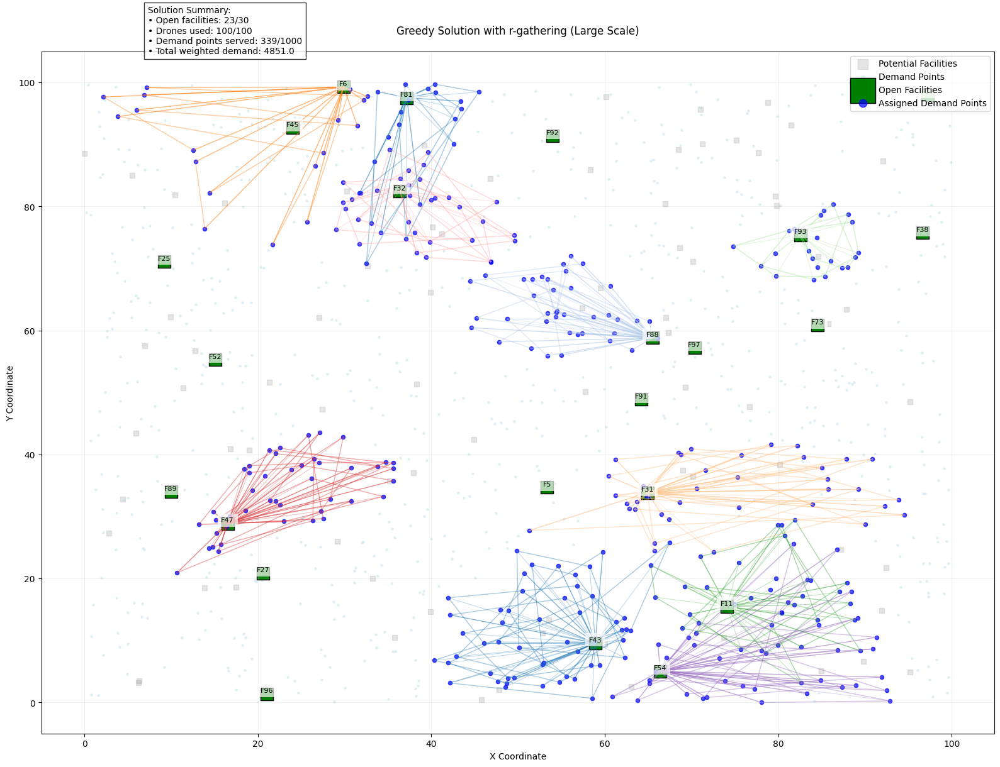

C:\Users\Prateek\AppData\Local\Temp\ipykernel_19924\2046529552.py:219: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab20', len(open_facilities))


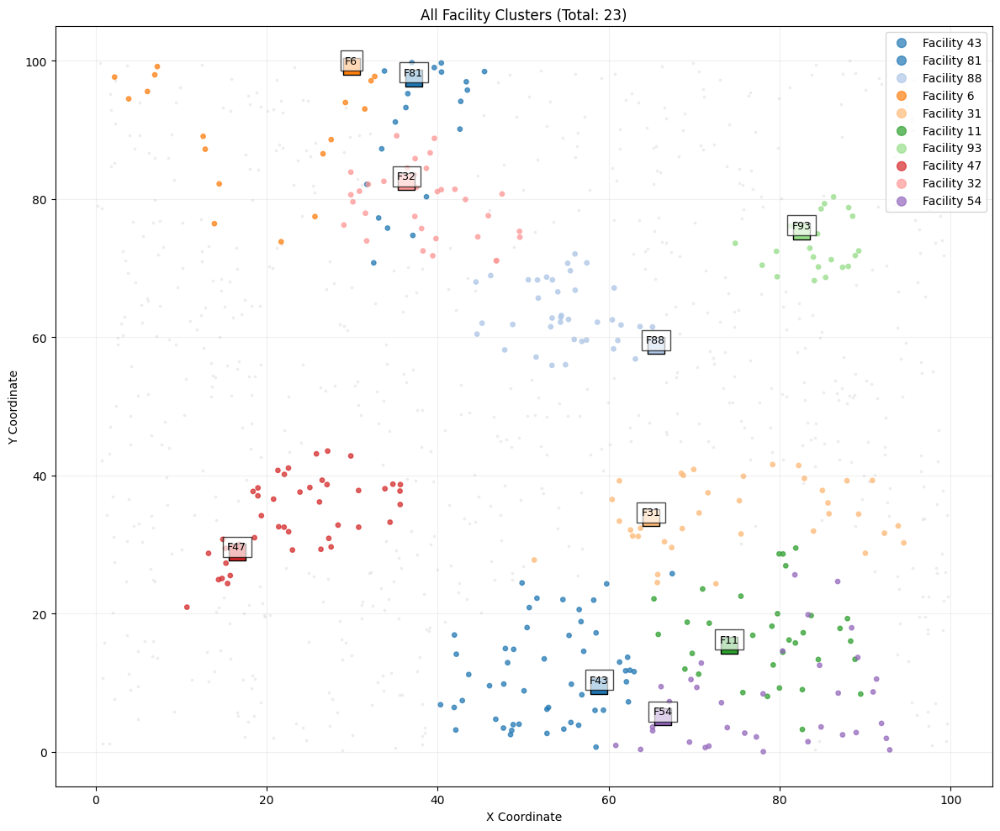

C:\Users\Prateek\AppData\Local\Temp\ipykernel_19924\2046529552.py:288: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10', len(assignments.get(j, [])))


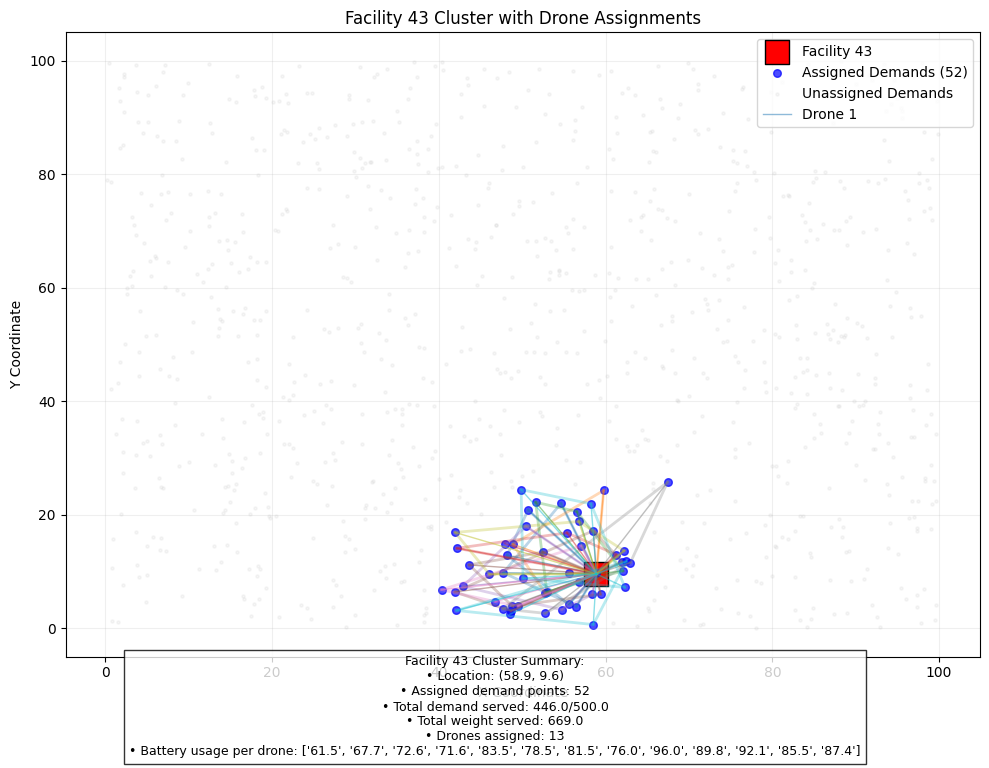

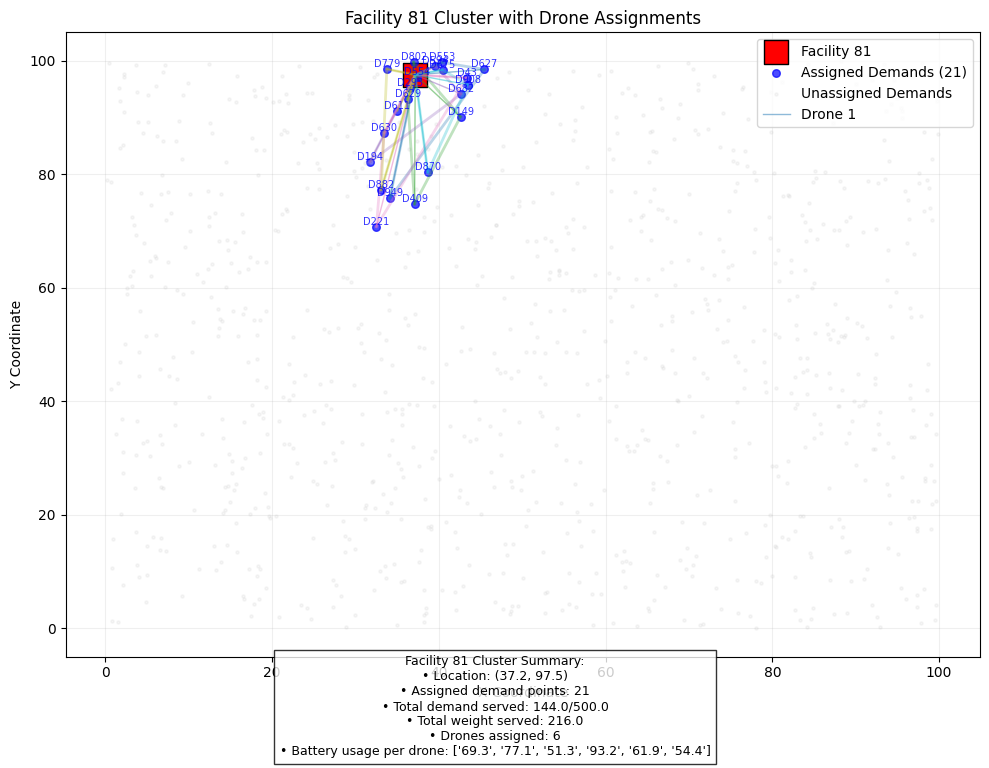

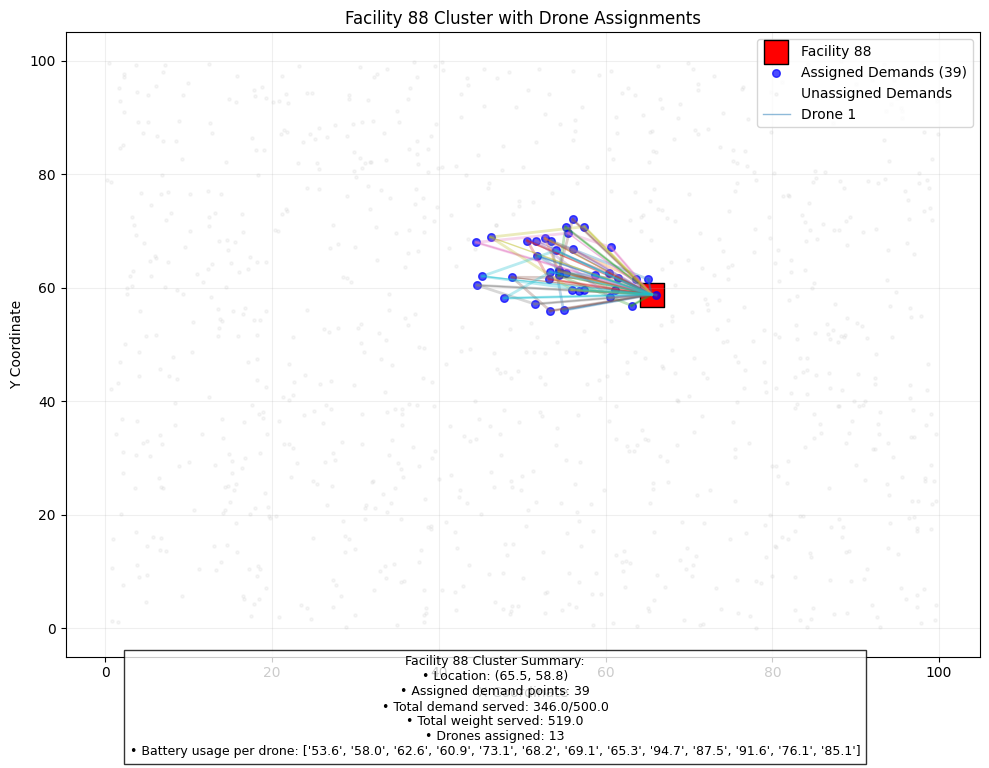

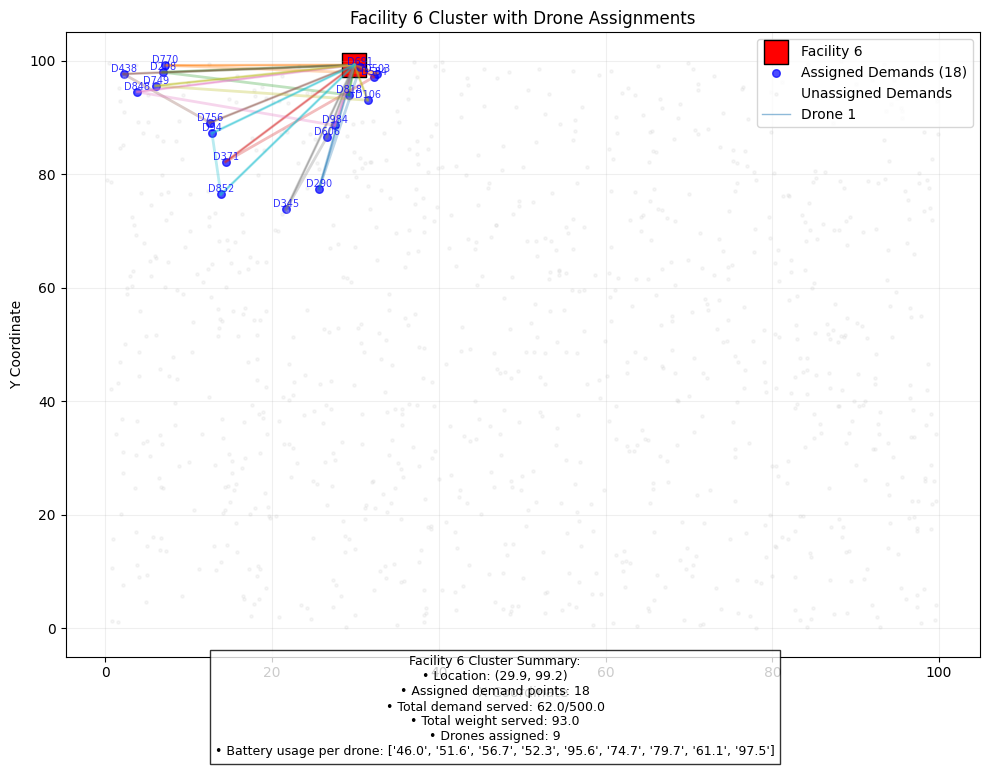

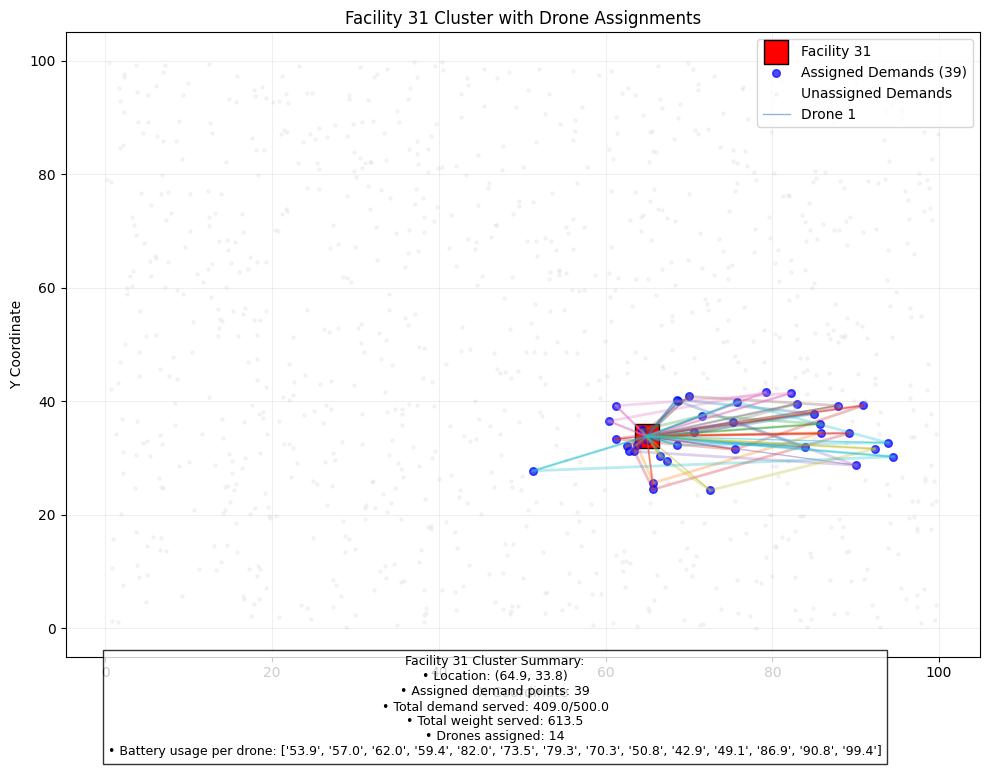

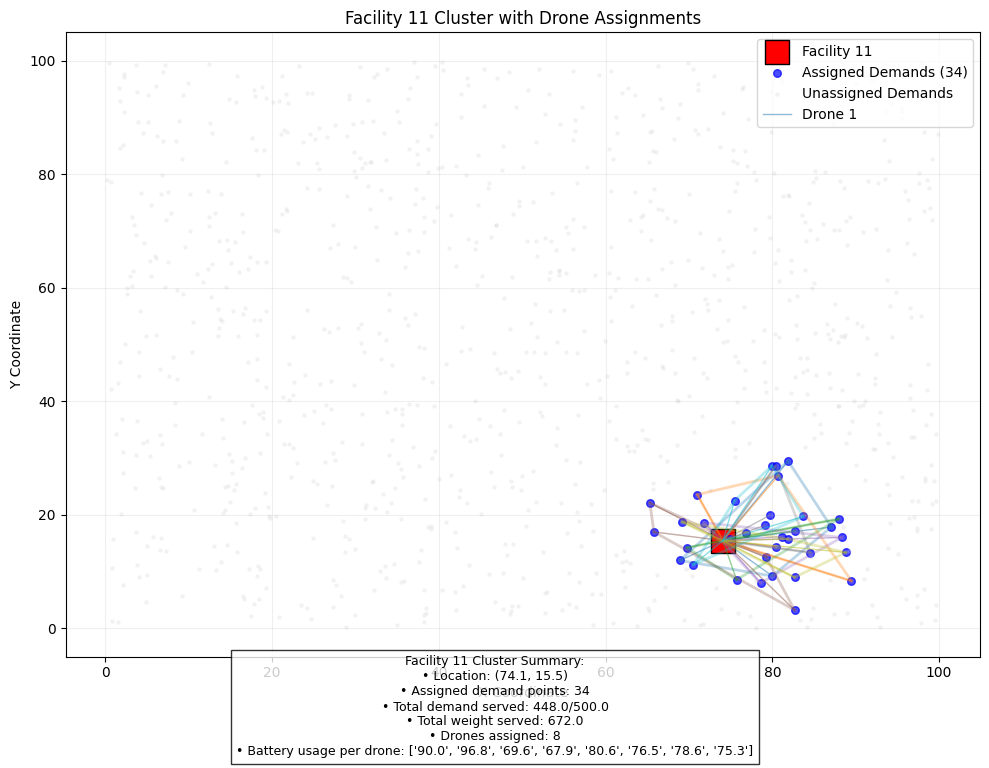

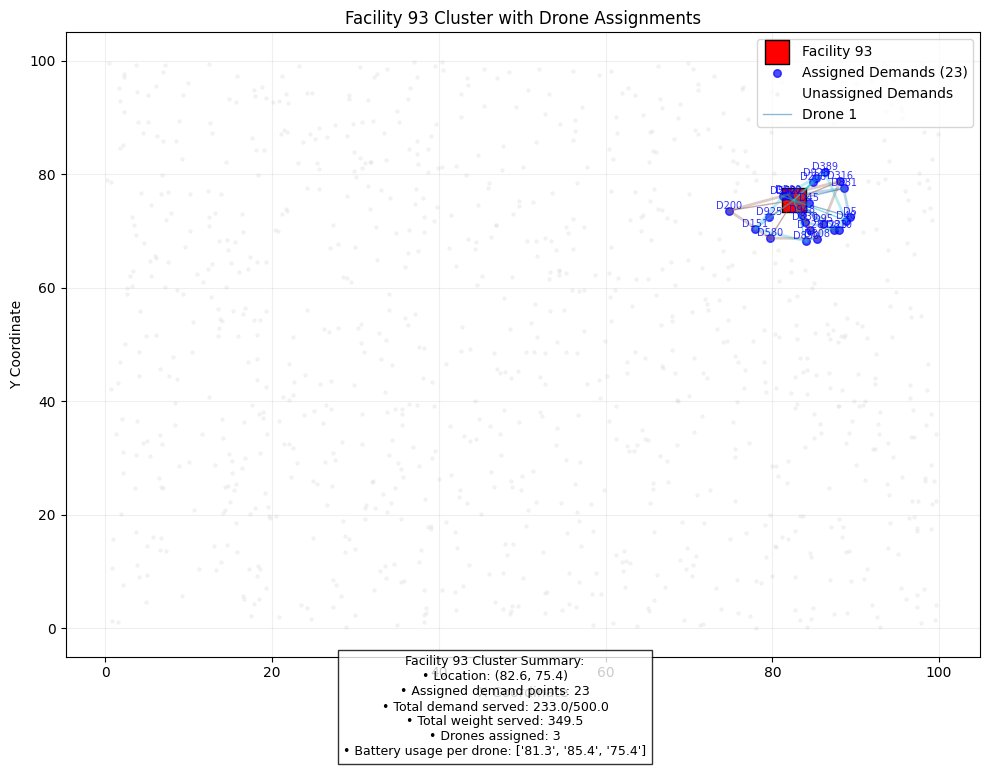

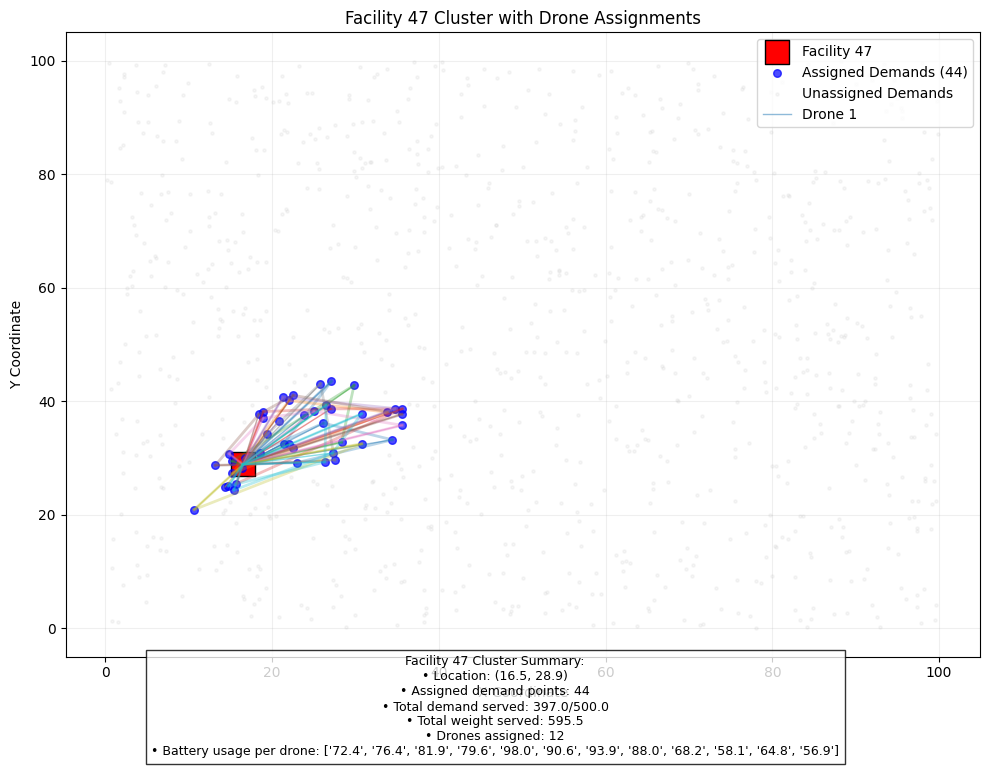

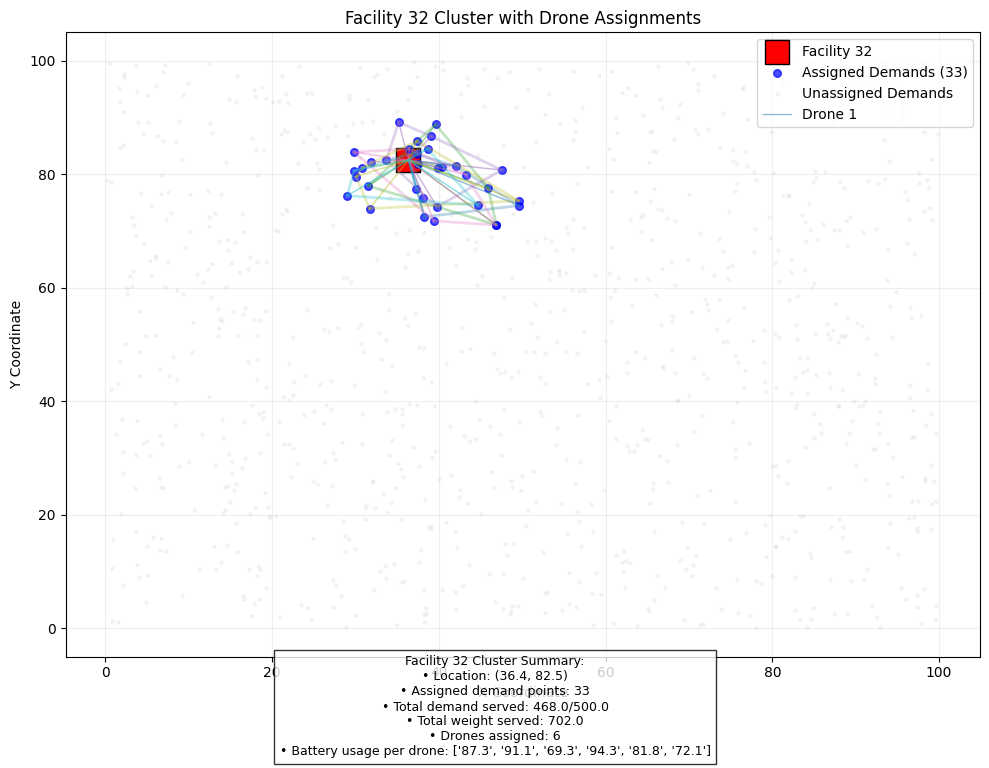

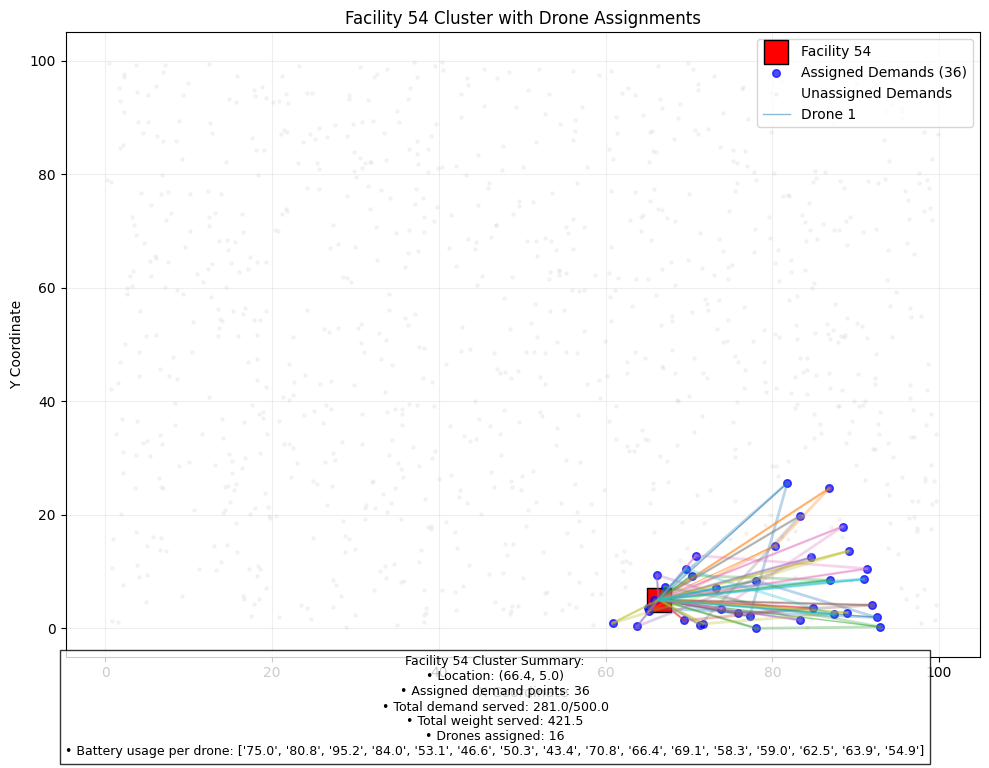


Running Three-Stage Heuristic with r-gathering...
Results:
  Total demand served: 5668.50
  Open facilities: [53, 27, 91, 20, 89, 1, 80, 18, 77, 51, 3, 36, 81, 44, 4, 35, 74, 11, 55, 79, 88, 5, 10, 97, 66, 25, 82, 15, 19, 76]
  Time: 3774.3950s


<Figure size 1000x800 with 0 Axes>

<Figure size 1000x800 with 0 Axes>

<Figure size 1000x800 with 0 Axes>

<Figure size 1000x800 with 0 Axes>

<Figure size 1000x800 with 0 Axes>

<Figure size 1000x800 with 0 Axes>

<Figure size 1000x800 with 0 Axes>

<Figure size 1000x800 with 0 Axes>

<Figure size 1000x800 with 0 Axes>

<Figure size 1000x800 with 0 Axes>

<Figure size 1000x800 with 0 Axes>

<Figure size 1000x800 with 0 Axes>

<Figure size 1000x800 with 0 Axes>

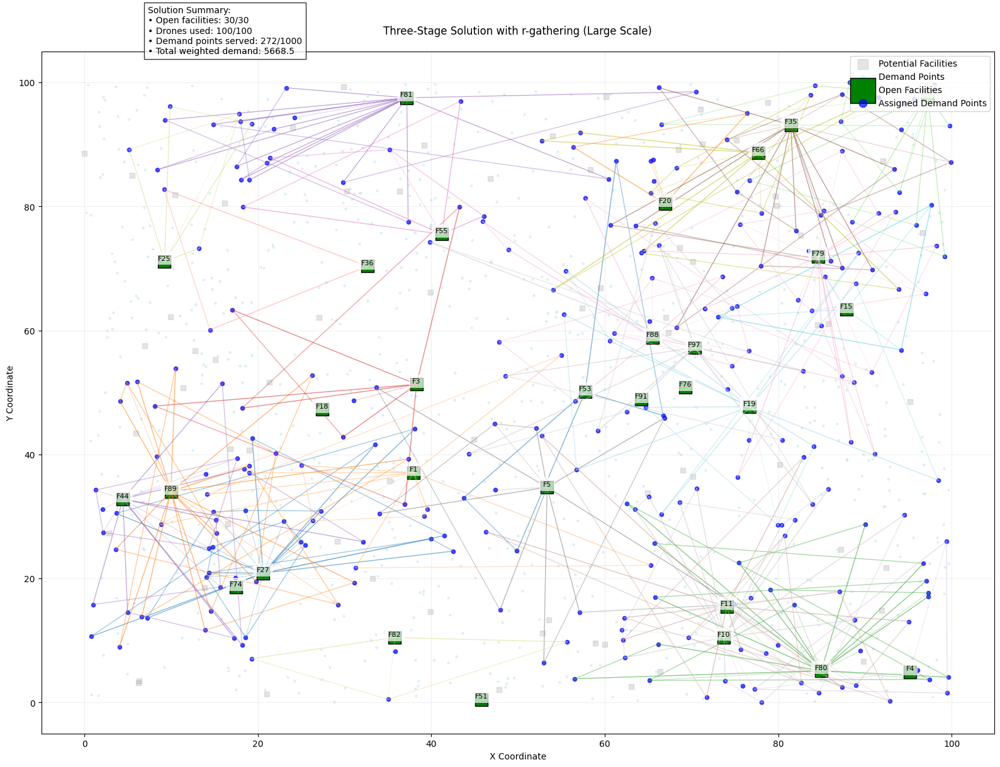

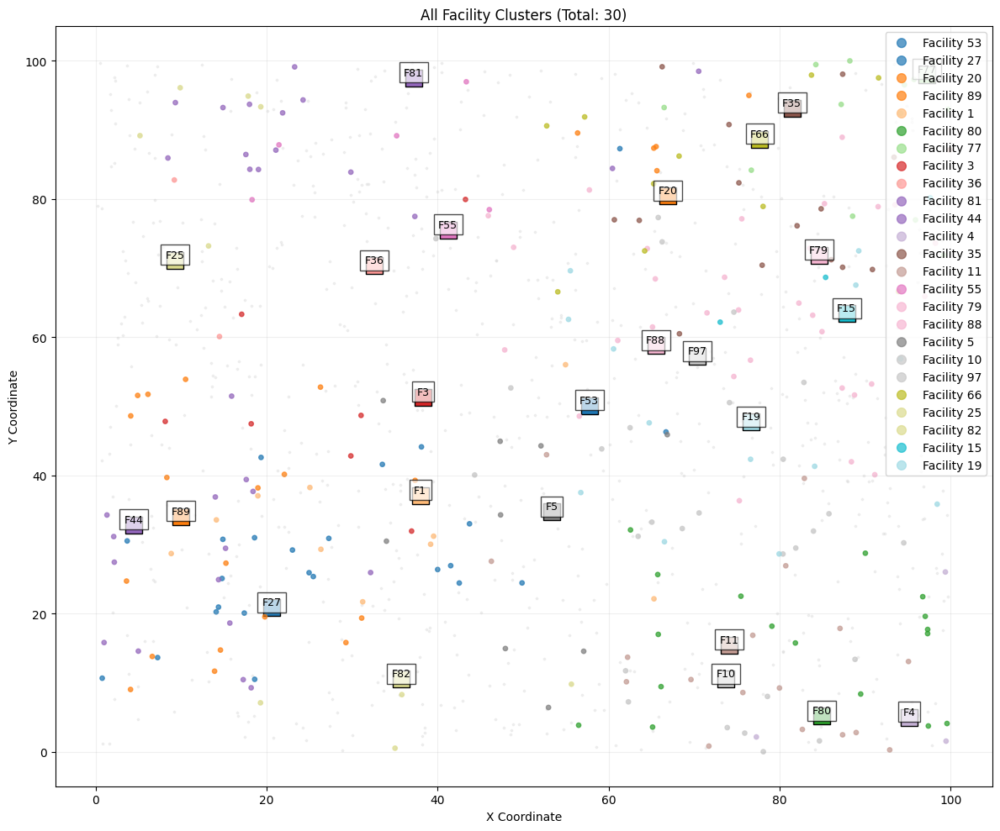

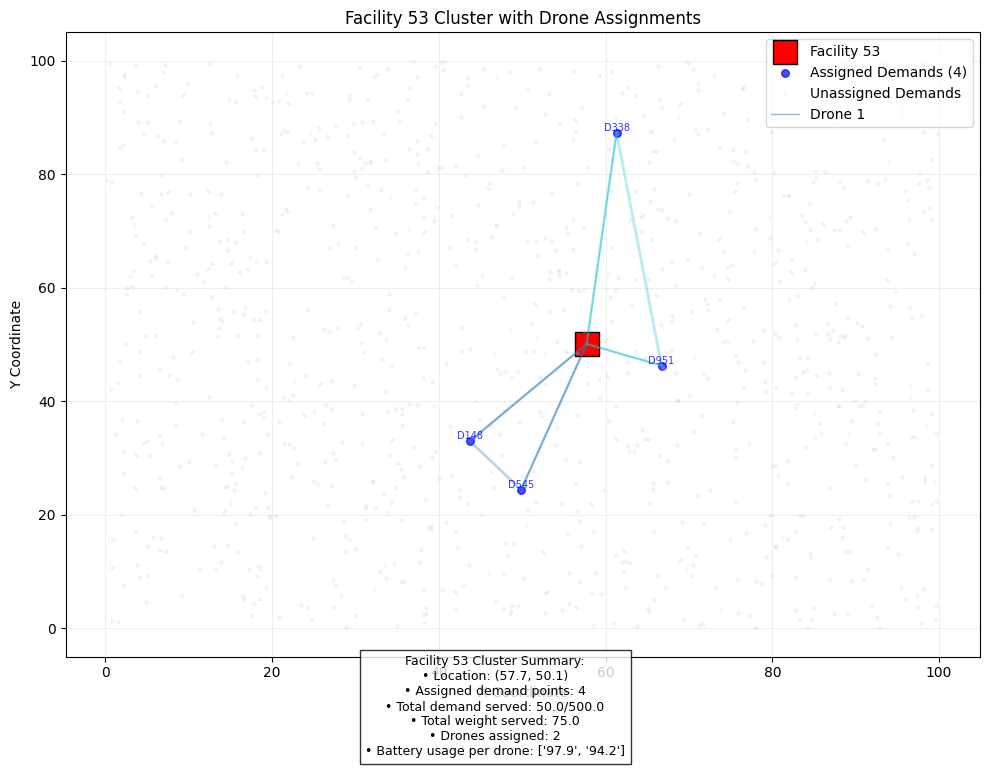

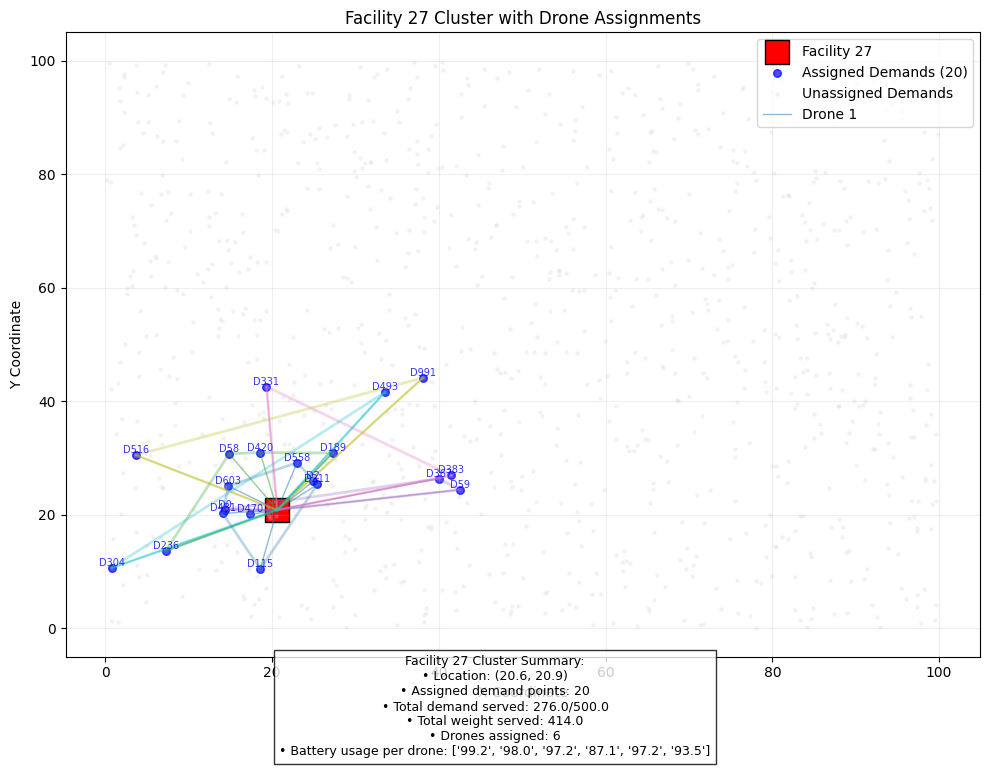

<Figure size 1000x800 with 0 Axes>

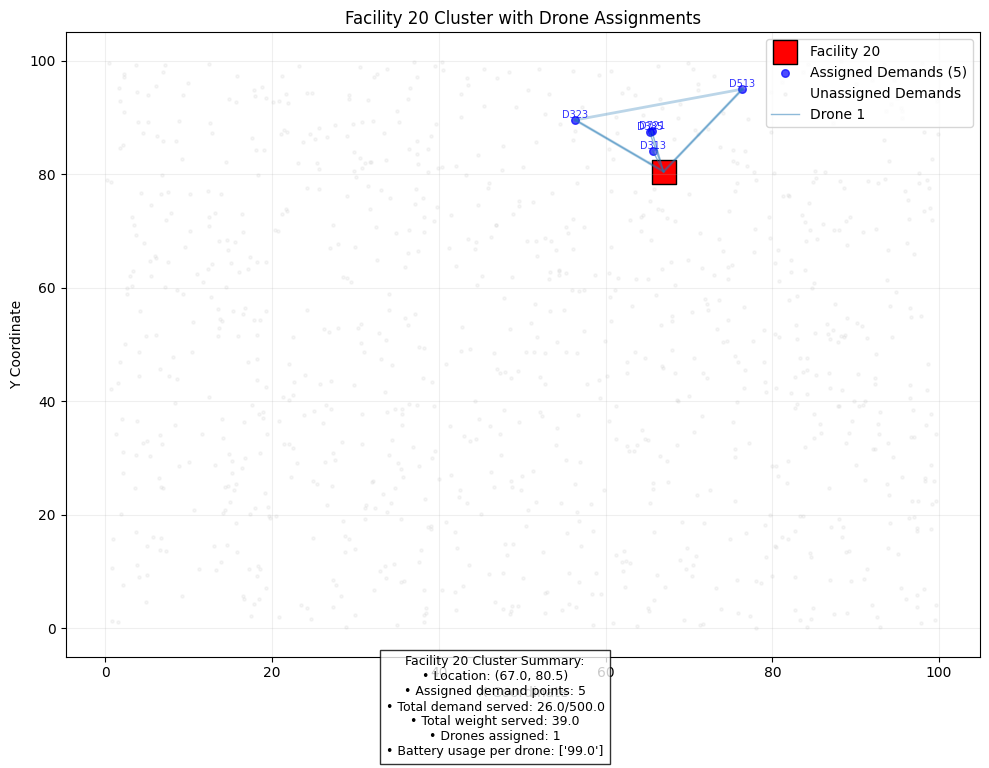

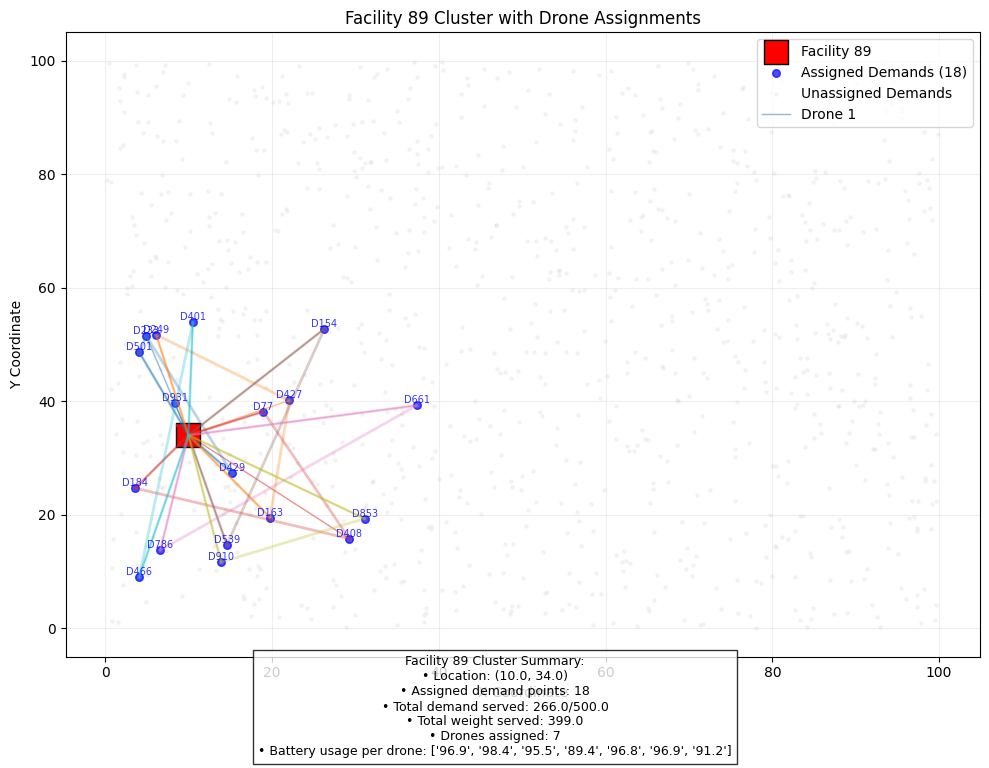

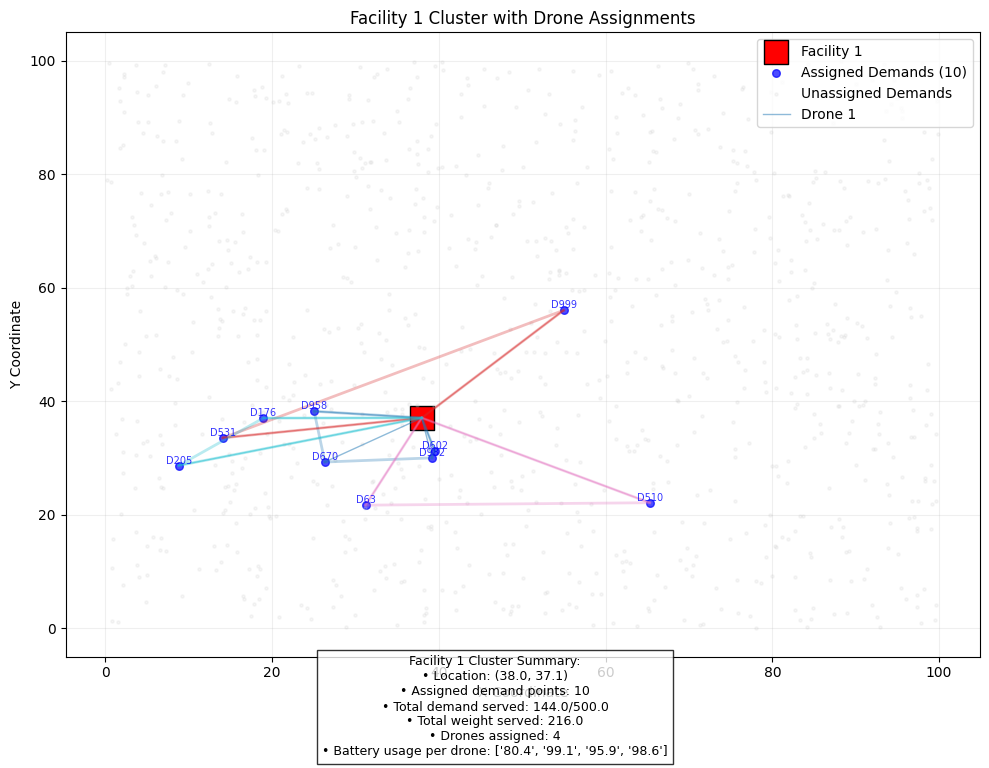

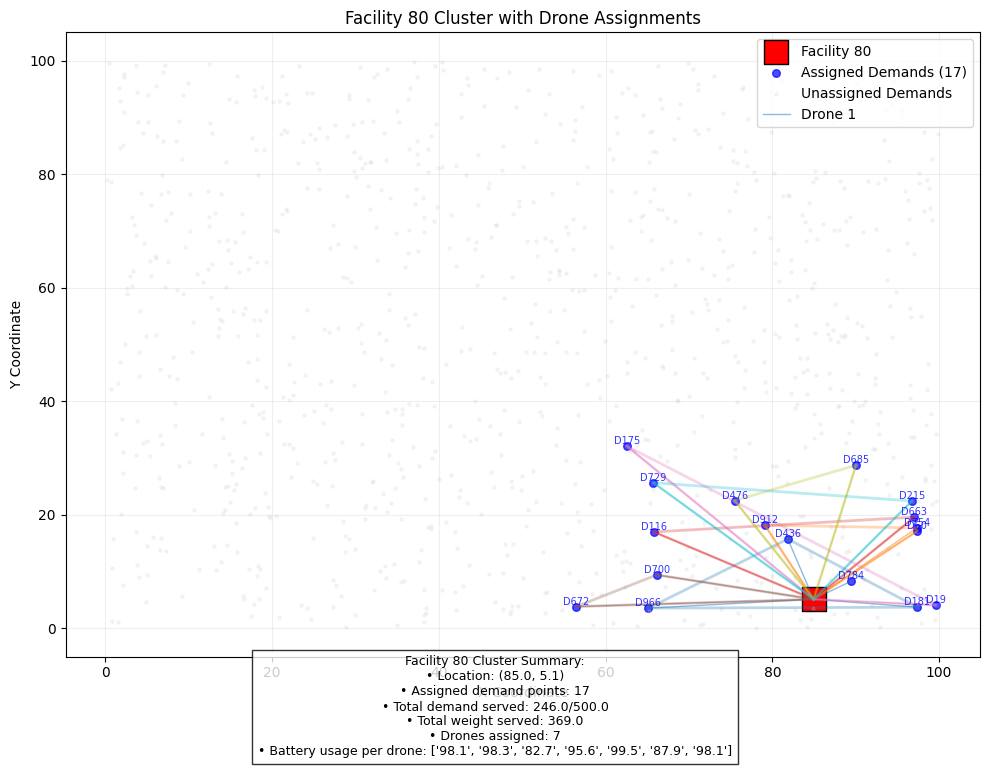

<Figure size 1000x800 with 0 Axes>

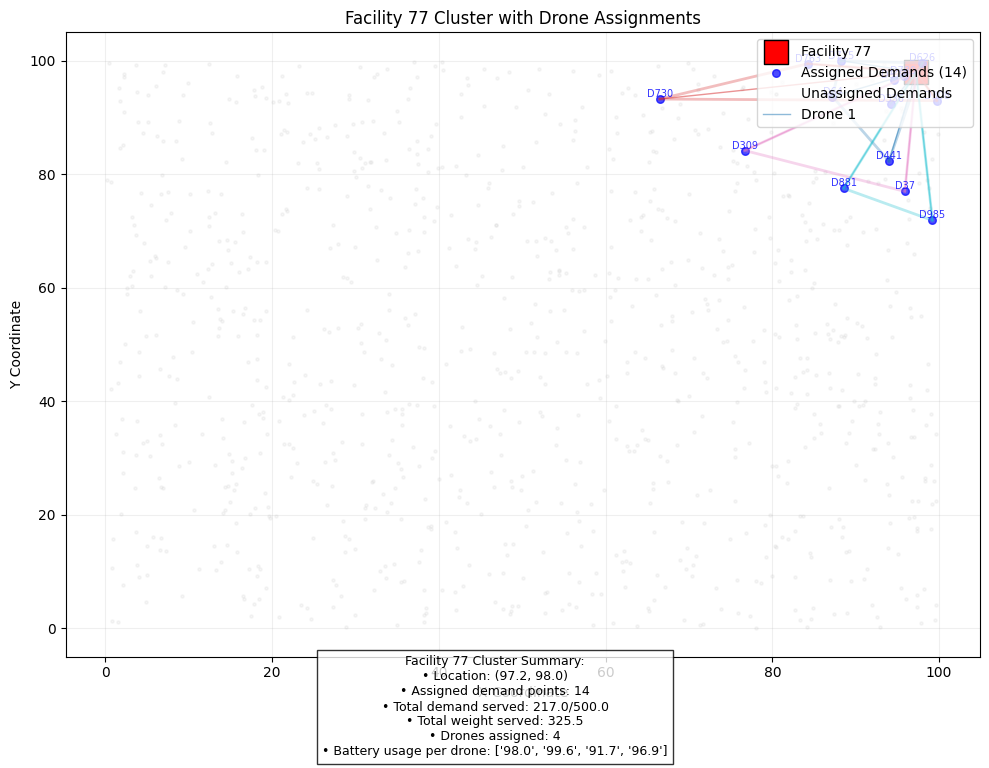

<Figure size 1000x800 with 0 Axes>

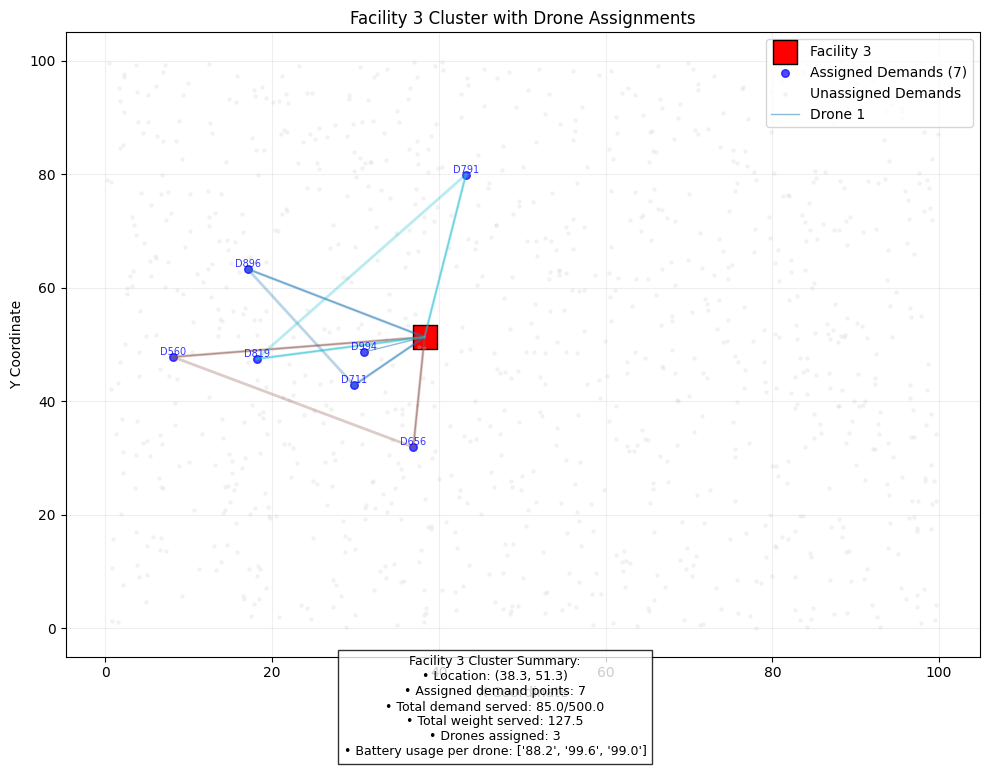

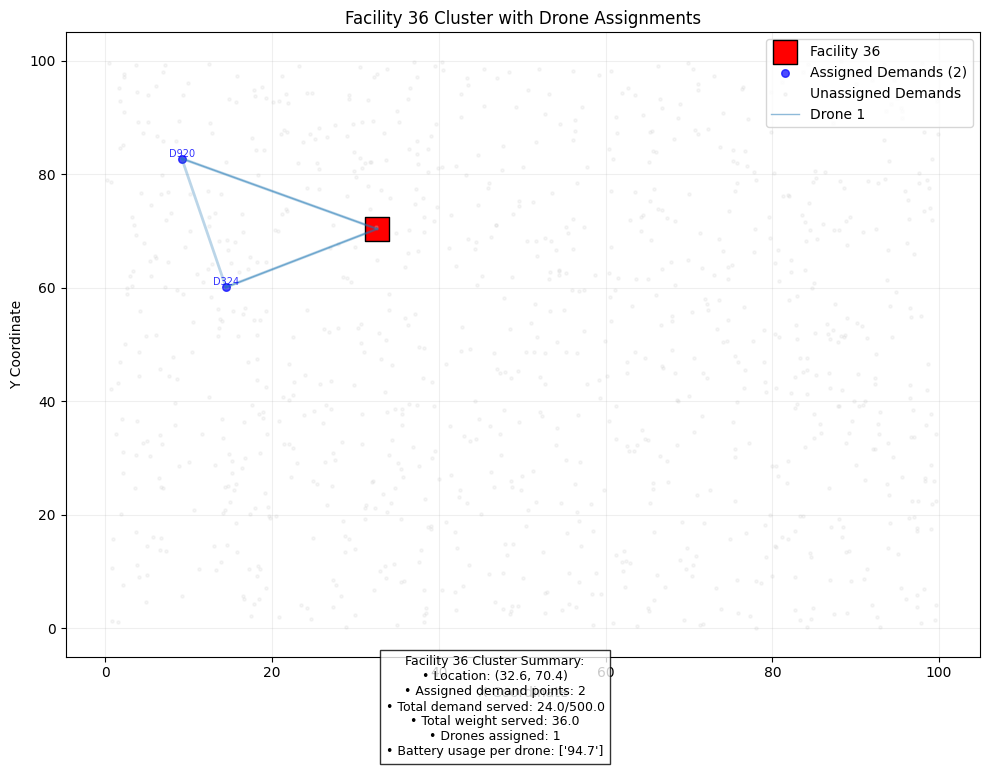

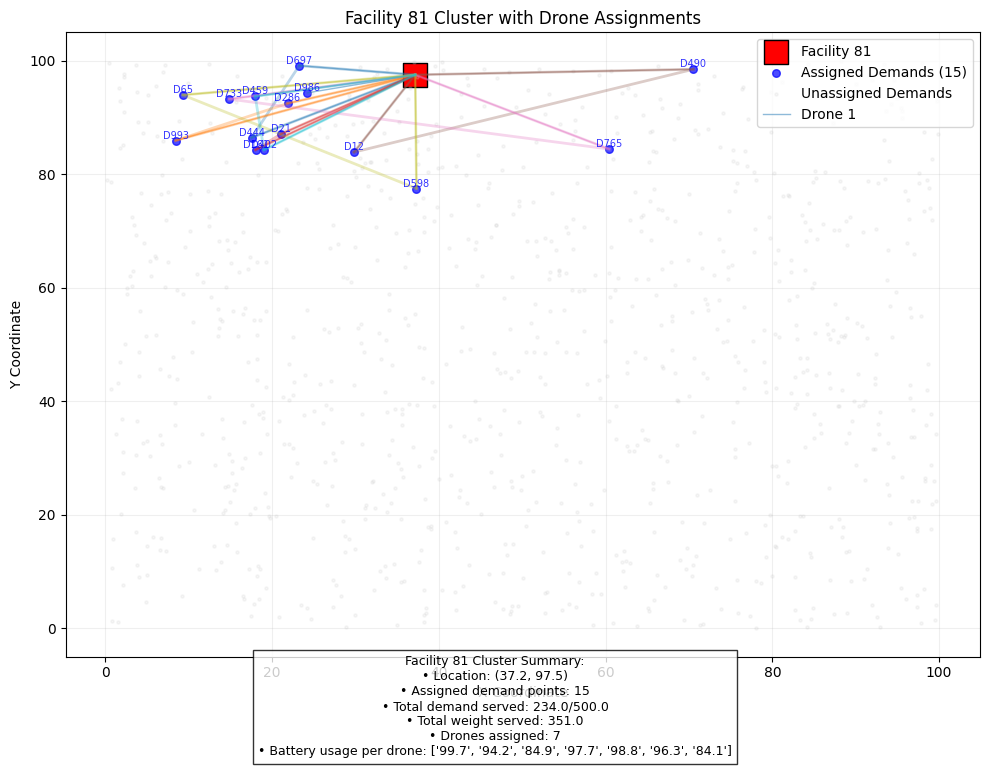

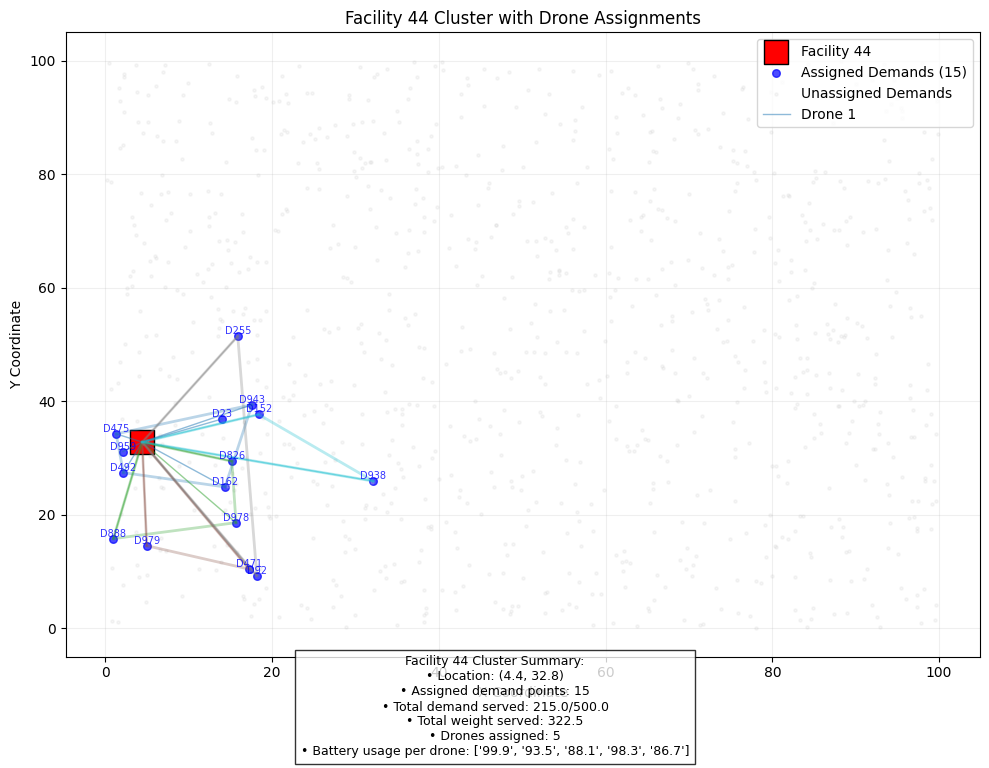

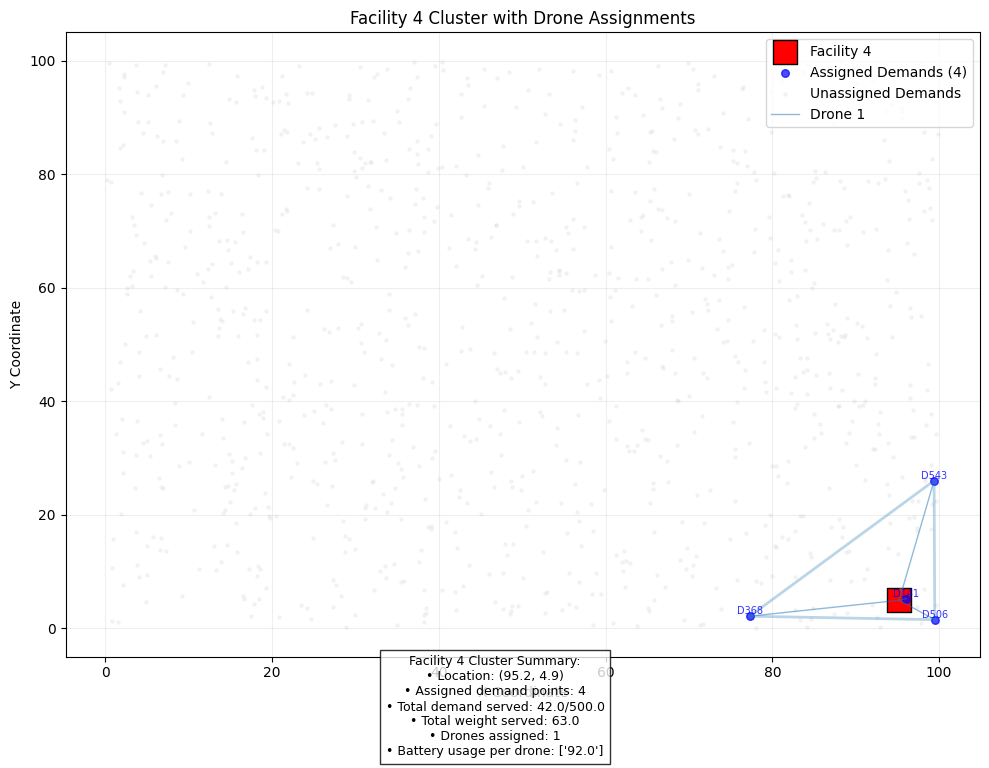

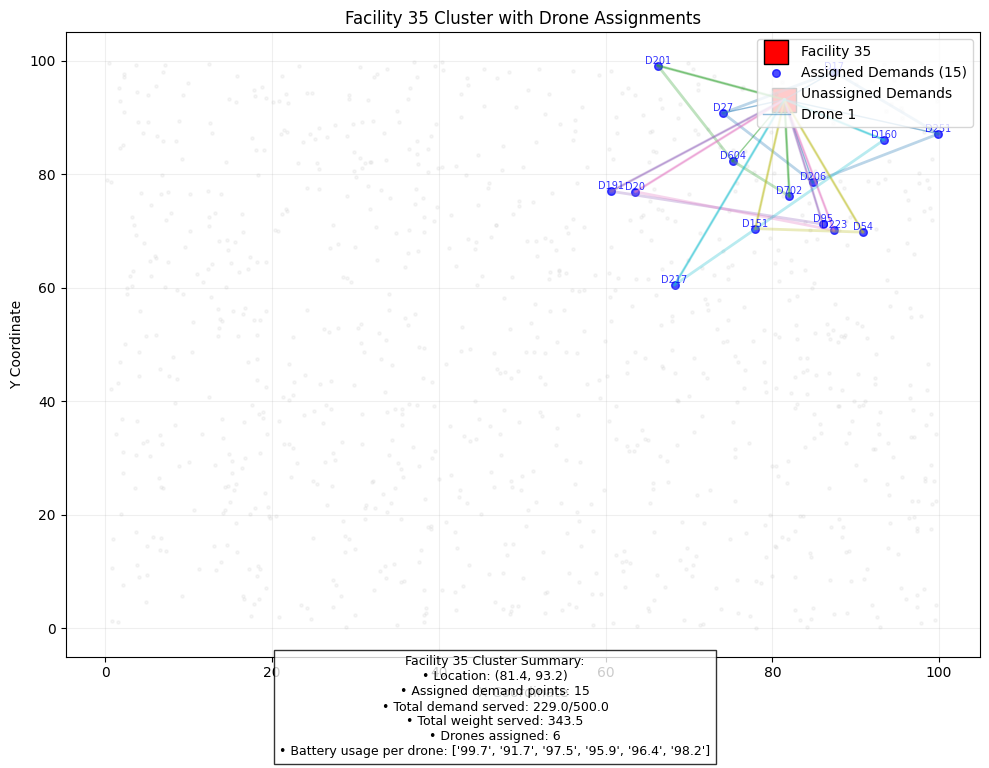

<Figure size 1000x800 with 0 Axes>

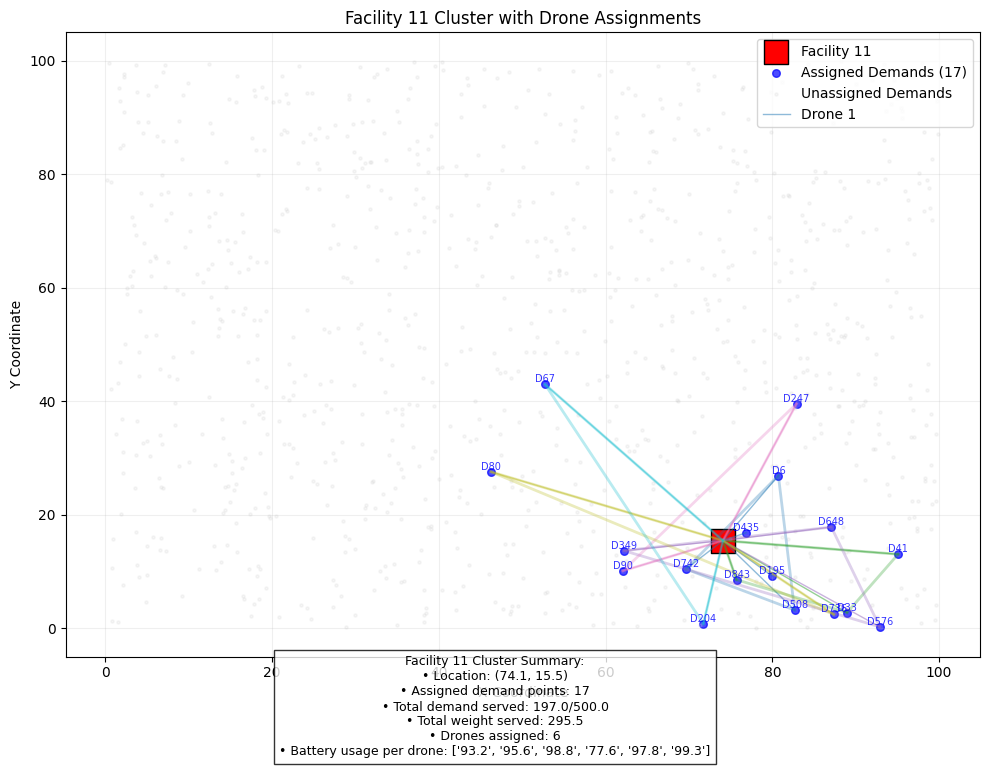

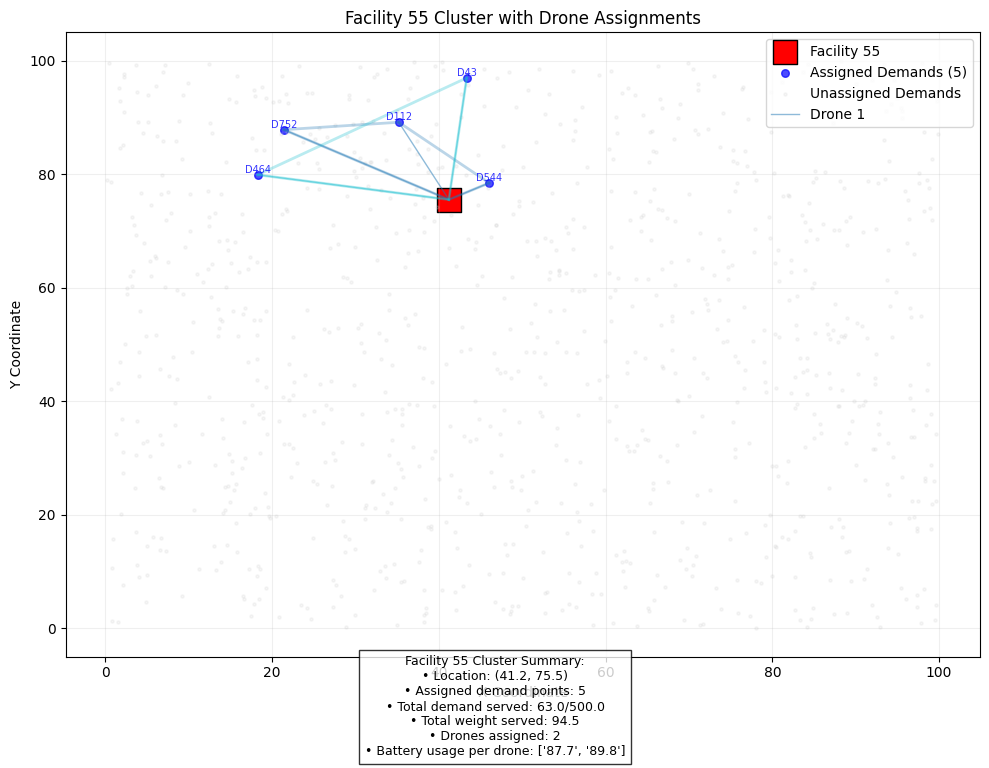

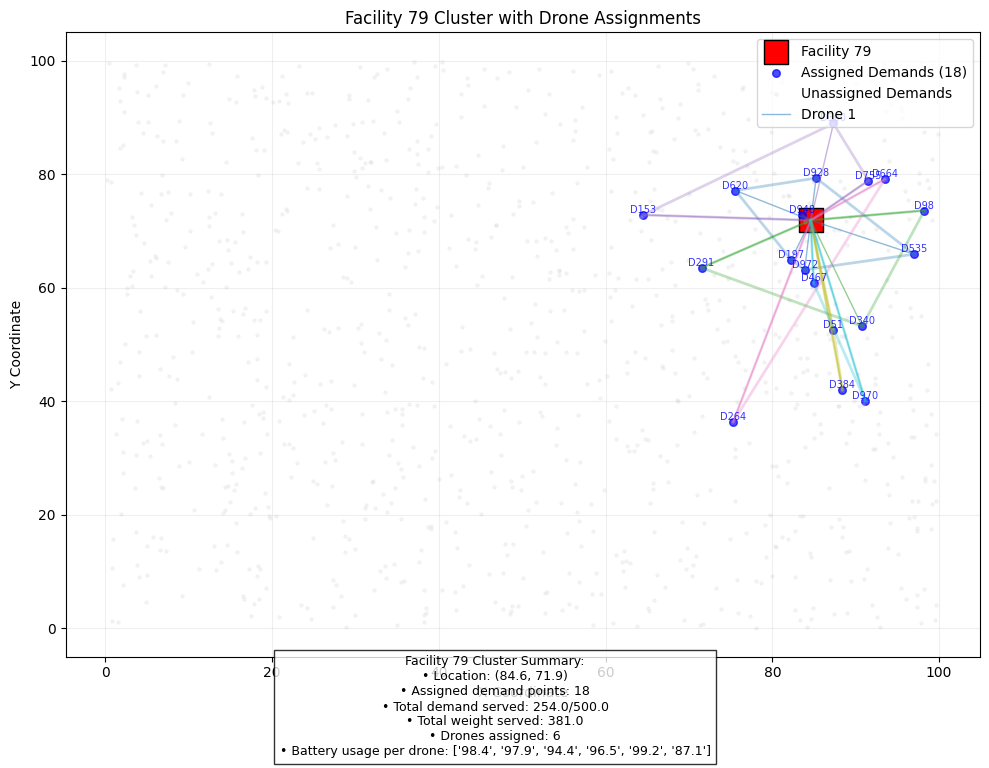

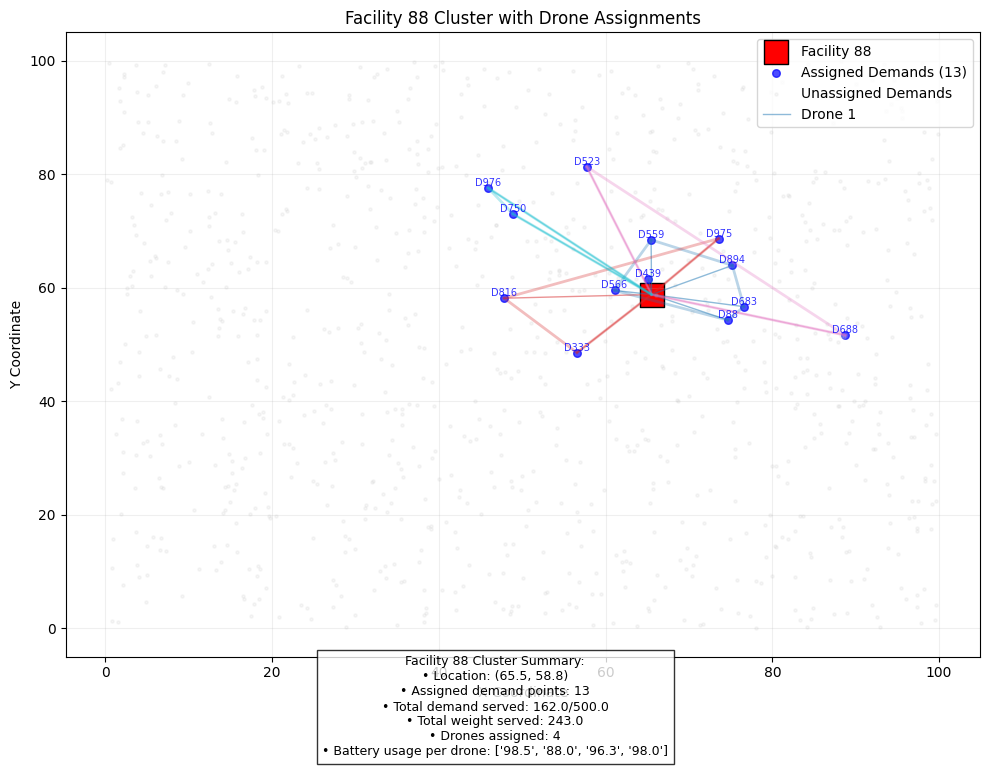

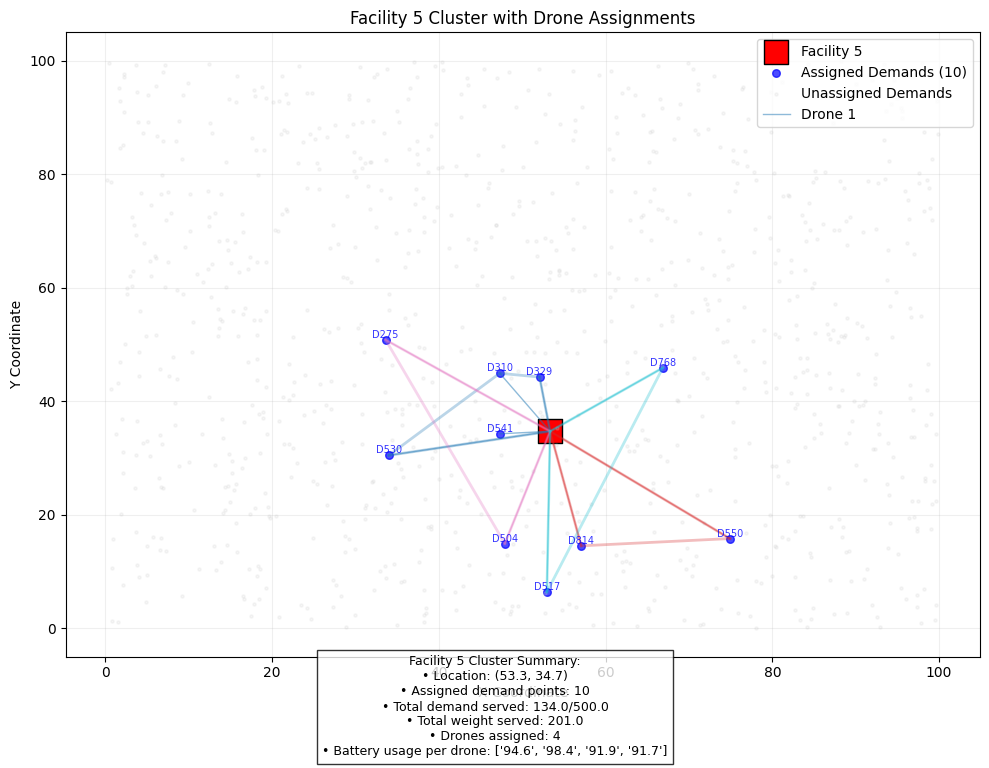

...

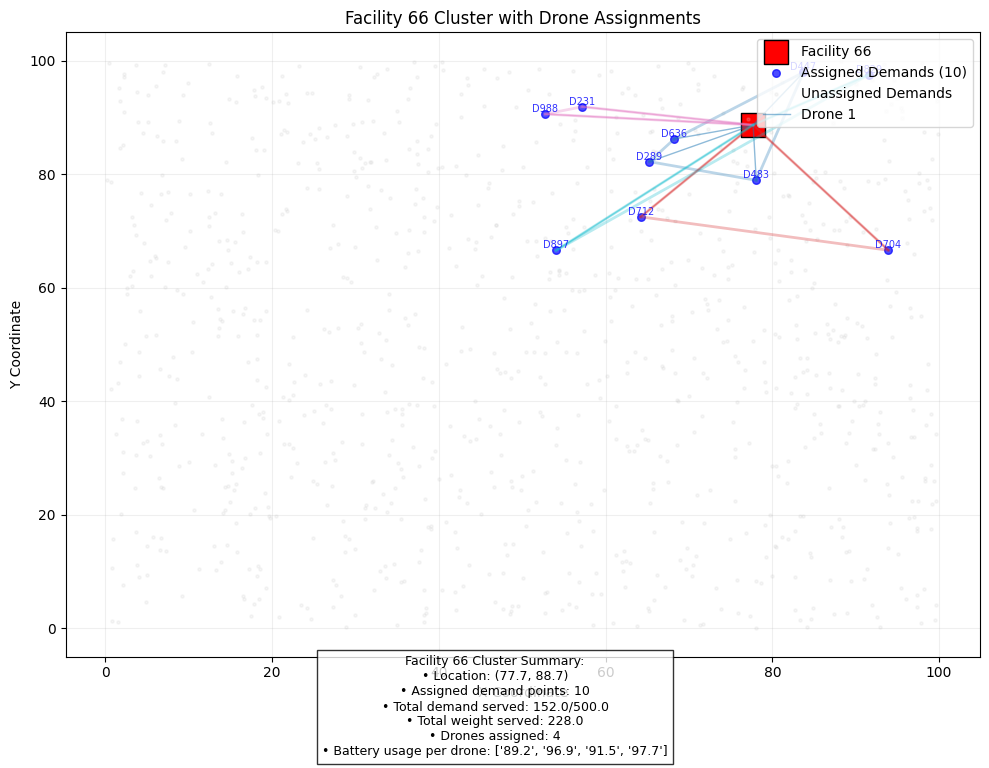

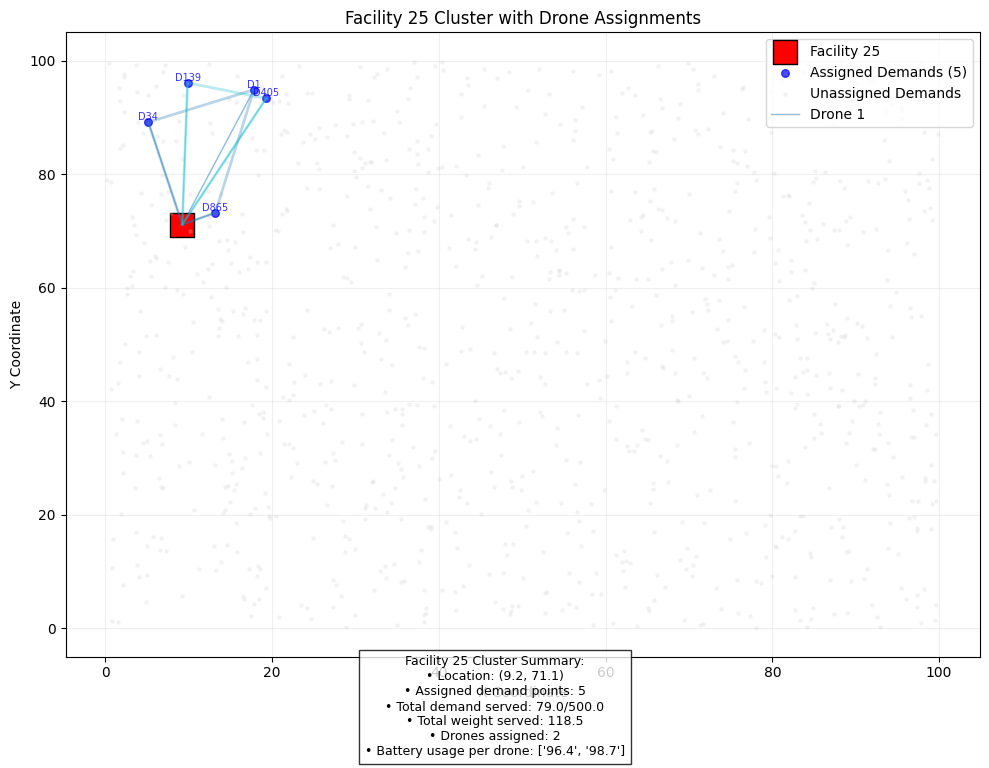

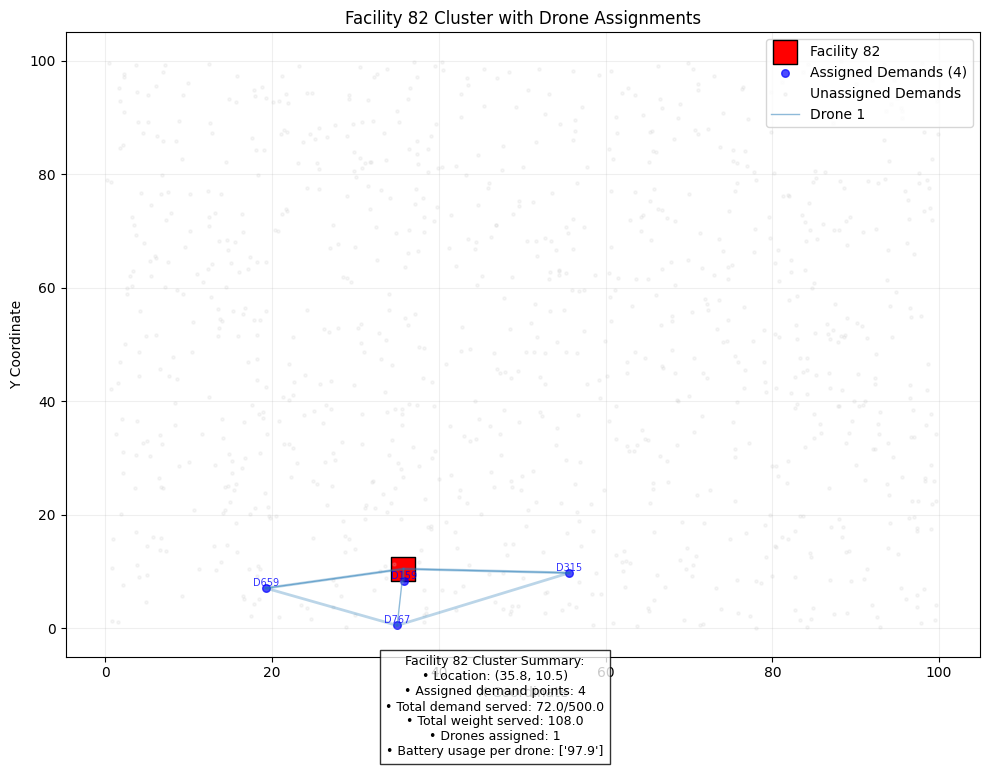

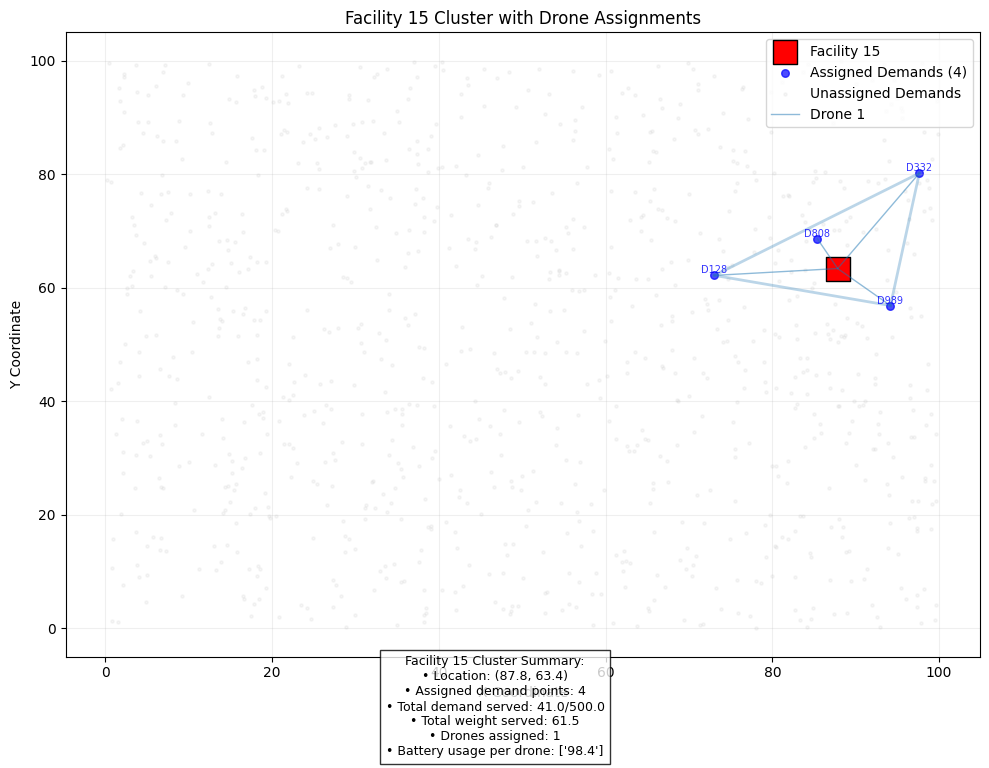

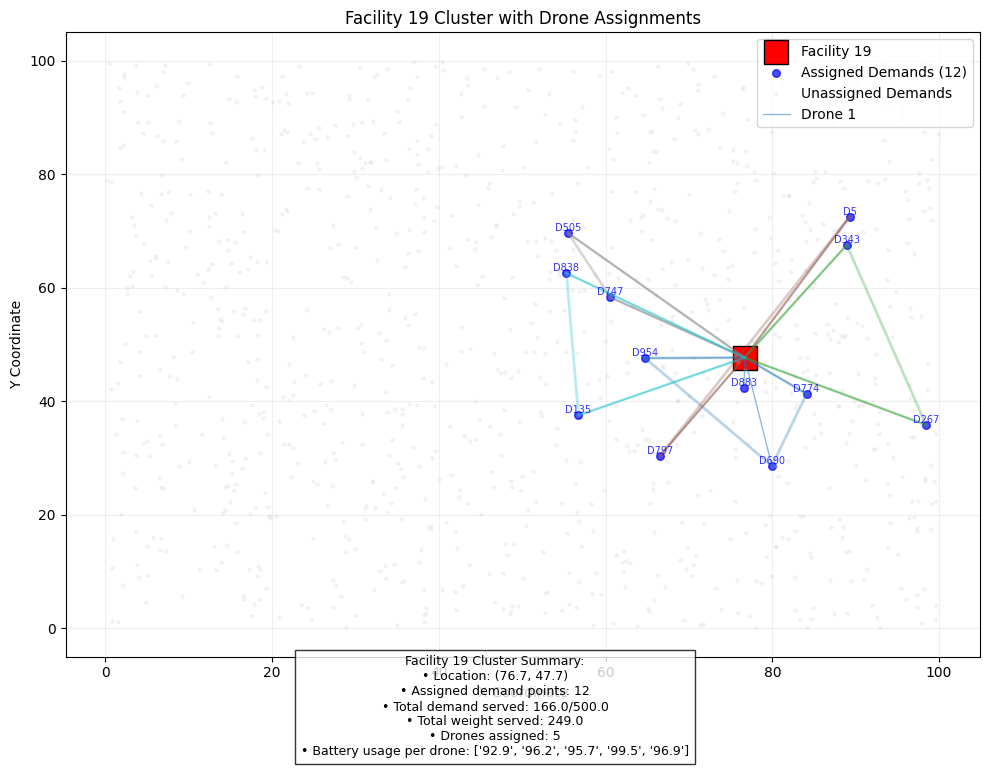

<Figure size 1000x800 with 0 Axes>

In [ ]:
import numpy as np
import heapq
from ortools.linear_solver import pywraplp
import random
from typing import List, Tuple, Dict, Set, DefaultDict
from collections import defaultdict
import matplotlib.pyplot as plt
import time
import math
from scipy.spatial import ConvexHull

class MCFLPD_Solver:
    """
    A solver class for the Maximum Coverage Capacitated Facility Location Problem
    with Range Constrained Drones (MCFLPD) and r-gathering constraints.
    """

    def __init__(self,
                 p: int,
                 K: int,
                 U: float,
                 B: float,
                 d: List[float],
                 b: List[List[float]],
                 w: List[float],
                 facility_locations: List[Tuple[float, float]] = None,
                 demand_locations: List[Tuple[float, float]] = None):
        """
        Initialize the MCFLPD solver with problem parameters and optional coordinates for visualization.
        """
        self.p = p
        self.K = K
        self.U = U
        self.B = B
        self.d = d
        self.b = b
        self.w = w
        self.num_demand_points = len(d)
        self.num_facility_locations = len(b[0]) if self.num_demand_points > 0 else 0

        # For visualization
        self.facility_locations = facility_locations if facility_locations else self._generate_default_locations(self.num_facility_locations)
        self.demand_locations = demand_locations if demand_locations else self._generate_default_locations(self.num_demand_points)

        # Validate coordinate data
        if len(self.facility_locations) != self.num_facility_locations:
            raise ValueError("Number of facility locations must match number of facility indices in b matrix")
        if len(self.demand_locations) != self.num_demand_points:
            raise ValueError("Number of demand locations must match length of demand list d")

    def _generate_default_locations(self, n: int) -> List[Tuple[float, float]]:
        """Generate random locations if none are provided."""
        return [(random.uniform(0, 100), random.uniform(0, 100)) for _ in range(n)]

    def _euclidean_distance(self, a: Tuple[float, float], b: Tuple[float, float]) -> float:
        """Calculate Euclidean distance between two points"""
        return math.sqrt((a[0]-b[0])**2 + (a[1]-b[1])**2)

    def _p_dispersion_selection(self, points: List[Tuple[float, float]], p: int) -> List[int]:
        """Select p facilities using p-dispersion (maximin) criterion"""
        if p >= len(points):
            return list(range(len(points)))

        # Start with the two farthest points
        max_dist = -1
        selected_indices = []

        # Find the pair with maximum distance
        for i in range(len(points)):
            for j in range(i+1, len(points)):
                dist = self._euclidean_distance(points[i], points[j])
                if dist > max_dist:
                    max_dist = dist
                    idx1, idx2 = i, j

        selected_indices = [idx1, idx2]

        # Greedily add points that maximize the minimum distance
        while len(selected_indices) < p:
            max_min_dist = -1
            best_idx = None

            for candidate_idx in range(len(points)):
                if candidate_idx in selected_indices:
                    continue

                # Calculate minimum distance from candidate to selected points
                min_dist = min(self._euclidean_distance(points[candidate_idx], points[s]) 
                              for s in selected_indices)

                if min_dist > max_min_dist:
                    max_min_dist = min_dist
                    best_idx = candidate_idx

            selected_indices.append(best_idx)

        return selected_indices

    def visualize_solution(self, 
                         open_facilities: List[int], 
                         assignments: Dict[int, List[List[int]]],
                         title: str = "MCFLPD Solution Visualization",
                         max_demand_points_to_label: int = 50) -> None:
        """
        Visualize the solution showing facilities, demand points, and drone routes.
        Optimized for large number of demand points.
        """
        plt.figure(figsize=(16, 12))
        
        # Plot all potential facility locations (gray)
        all_facility_x = [loc[0] for loc in self.facility_locations]
        all_facility_y = [loc[1] for loc in self.facility_locations]
        plt.scatter(all_facility_x, all_facility_y, c='gray', s=30, marker='s', label='Potential Facilities', alpha=0.2)
        
        # Plot all demand points (light blue, small)
        demand_x = [loc[0] for loc in self.demand_locations]
        demand_y = [loc[1] for loc in self.demand_locations]
        plt.scatter(demand_x, demand_y, c='lightblue', s=5, label='Demand Points', alpha=0.3)
        
        # Plot open facilities (green)
        open_facility_x = [self.facility_locations[j][0] for j in open_facilities]
        open_facility_y = [self.facility_locations[j][1] for j in open_facilities]
        plt.scatter(open_facility_x, open_facility_y, c='green', s=200, marker='s', label='Open Facilities', edgecolors='black')
        
        # Collect all assigned demand points for visualization
        assigned_demands = set()
        for j, drone_paths in assignments.items():
            for path in drone_paths:
                assigned_demands.update(path)
        
        # Plot assigned demand points (blue)
        assigned_x = [self.demand_locations[i][0] for i in assigned_demands]
        assigned_y = [self.demand_locations[i][1] for i in assigned_demands]
        plt.scatter(assigned_x, assigned_y, c='blue', s=20, label='Assigned Demand Points', alpha=0.7)
        
        # Plot drone routes (colored arrows)
        colors = plt.cm.get_cmap('tab20', len(open_facilities))
        for idx, j in enumerate(open_facilities):
            facility_loc = self.facility_locations[j]
            for drone_path in assignments.get(j, []):
                if not drone_path:
                    continue
                    
                # Calculate convex hull for this drone's path
                points = [self.demand_locations[i] for i in drone_path]
                points.append(facility_loc)
                
                try:
                    hull = ConvexHull(points)
                    for simplex in hull.simplices:
                        plt.plot([points[simplex[0]][0], points[simplex[1]][0]],
                                [points[simplex[0]][1], points[simplex[1]][1]], 
                                color=colors(idx), alpha=0.4, linewidth=1)
                except:
                    # Fallback if convex hull fails (collinear points)
                    pass
                
                # Draw lines to facility
                for i in drone_path:
                    demand_loc = self.demand_locations[i]
                    plt.plot([facility_loc[0], demand_loc[0]],
                            [facility_loc[1], demand_loc[1]],
                            color=colors(idx), alpha=0.3, linewidth=0.7)
        
        # Add labels for open facilities
        for j in open_facilities:
            plt.text(self.facility_locations[j][0], self.facility_locations[j][1], 
                    f'F{j}', ha='center', va='bottom', color='black', fontsize=8,
                    bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
        
        # Add labels for a subset of assigned demand points (to avoid clutter)
        if len(assigned_demands) <= max_demand_points_to_label:
            for i in assigned_demands:
                plt.text(self.demand_locations[i][0], self.demand_locations[i][1], 
                        f'D{i}', ha='center', va='bottom', 
                        color='blue', fontsize=6, alpha=0.7)
        
        # Add statistics to the plot
        total_assigned = len(assigned_demands)
        total_demand = sum(self.w[i] for i in assigned_demands)
        drones_used = sum(len(paths) for paths in assignments.values())
        
        stats_text = (f"Solution Summary:\n"
                     f"• Open facilities: {len(open_facilities)}/{self.p}\n"
                     f"• Drones used: {drones_used}/{self.K}\n"
                     f"• Demand points served: {total_assigned}/{self.num_demand_points}\n"
                     f"• Total weighted demand: {total_demand:.1f}")
        
        plt.gcf().text(0.15, 0.95, stats_text, ha='left', fontsize=10, 
                      bbox=dict(facecolor='white', alpha=0.8))
        
        # Set plot properties
        plt.title(title, pad=20)
        plt.xlabel("X Coordinate")
        plt.ylabel("Y Coordinate")
        plt.legend(loc='upper right', markerscale=2)
        plt.grid(True, alpha=0.2)
        
        plt.tight_layout()
        plt.show()

    def visualize_facility_clusters(self, 
                                  open_facilities: List[int], 
                                  assignments: Dict[int, List[List[int]]],
                                  max_demand_points_to_label: int = 30) -> None:
        """
        Generate separate cluster diagrams for each open facility showing its assigned demand points
        and drone routes. Optimized for large number of demand points.
        """
        # First create a summary plot showing all clusters
        plt.figure(figsize=(12, 10))
        
        # Plot all demand points (light gray)
        demand_x = [loc[0] for loc in self.demand_locations]
        demand_y = [loc[1] for loc in self.demand_locations]
        plt.scatter(demand_x, demand_y, c='lightgray', s=3, alpha=0.3)
        
        # Create a color map for facilities
        colors = plt.cm.get_cmap('tab20', len(open_facilities))
        
        # Plot each facility's cluster
        for idx, j in enumerate(open_facilities):
            facility_loc = self.facility_locations[j]
            
            # Get all demand points assigned to this facility
            all_assigned = []
            for path in assignments.get(j, []):
                all_assigned.extend(path)
            
            if not all_assigned:
                continue
                
            # Plot assigned demand points
            assigned_x = [self.demand_locations[i][0] for i in all_assigned]
            assigned_y = [self.demand_locations[i][1] for i in all_assigned]
            plt.scatter(assigned_x, assigned_y, c=[colors(idx)]*len(all_assigned), 
                       s=15, alpha=0.7, label=f'Facility {j}')
            
            # Plot facility
            plt.scatter(facility_loc[0], facility_loc[1], c=[colors(idx)], 
                       s=200, marker='s', edgecolor='black')
            
            # Add facility label
            plt.text(facility_loc[0], facility_loc[1], f'F{j}', 
                    ha='center', va='bottom', fontsize=9,
                    bbox=dict(facecolor='white', alpha=0.7))
        
        plt.title(f"All Facility Clusters (Total: {len(open_facilities)})")
        plt.xlabel("X Coordinate")
        plt.ylabel("Y Coordinate")
        plt.legend(loc='upper right', markerscale=2)
        plt.grid(True, alpha=0.2)
        plt.tight_layout()
        plt.show()
        
        # Now create individual plots for each facility
        for idx, j in enumerate(open_facilities):
            plt.figure(figsize=(10, 8))
            facility_loc = self.facility_locations[j]
            
            # Get all demand points assigned to this facility
            all_assigned = []
            for path in assignments.get(j, []):
                all_assigned.extend(path)
            
            if not all_assigned:
                continue
                
            # Plot the facility
            plt.scatter(facility_loc[0], facility_loc[1], c='red', 
                       s=300, marker='s', edgecolor='black', label=f'Facility {j}')
            
            # Plot assigned demand points
            assigned_x = [self.demand_locations[i][0] for i in all_assigned]
            assigned_y = [self.demand_locations[i][1] for i in all_assigned]
            plt.scatter(assigned_x, assigned_y, c='blue', 
                       s=30, alpha=0.7, label=f'Assigned Demands ({len(all_assigned)})')
            
            # Plot unassigned demand points (light gray)
            all_demands = set(range(self.num_demand_points))
            unassigned = all_demands - set(all_assigned)
            unassigned_x = [self.demand_locations[i][0] for i in unassigned]
            unassigned_y = [self.demand_locations[i][1] for i in unassigned]
            plt.scatter(unassigned_x, unassigned_y, c='lightgray', 
                       s=5, alpha=0.2, label='Unassigned Demands')
            
            # Plot drone paths
            colors = plt.cm.get_cmap('tab10', len(assignments.get(j, [])))
            for drone_idx, path in enumerate(assignments.get(j, [])):
                if not path:
                    continue
                    
                # Draw lines to each demand point in path
                for i in path:
                    demand_loc = self.demand_locations[i]
                    plt.plot([facility_loc[0], demand_loc[0]],
                            [facility_loc[1], demand_loc[1]],
                            color=colors(drone_idx), alpha=0.5, linewidth=1,
                            label=f'Drone {drone_idx+1}' if drone_idx == 0 else None)
                
                # Draw convex hull around this drone's points
                points = [self.demand_locations[i] for i in path]
                points.append(facility_loc)
                
                try:
                    hull = ConvexHull(points)
                    for simplex in hull.simplices:
                        plt.plot([points[simplex[0]][0], points[simplex[1]][0]],
                                [points[simplex[0]][1], points[simplex[1]][1]], 
                                color=colors(drone_idx), alpha=0.3, linewidth=2)
                except:
                    pass
            
            # Add labels for a subset of demand points
            if len(all_assigned) <= max_demand_points_to_label:
                for i in all_assigned:
                    plt.text(self.demand_locations[i][0], self.demand_locations[i][1], 
                            f'D{i}', ha='center', va='bottom', 
                            color='blue', fontsize=7, alpha=0.8)
            
            # Calculate statistics
            total_demand = sum(self.d[i] for i in all_assigned)
            total_weight = sum(self.w[i] for i in all_assigned)
            drones_used = len(assignments.get(j, []))
            battery_usage = [sum(self.b[i][j] for i in path) for path in assignments.get(j, [])]
            
            stats_text = (f"Facility {j} Cluster Summary:\n"
                         f"• Location: ({facility_loc[0]:.1f}, {facility_loc[1]:.1f})\n"
                         f"• Assigned demand points: {len(all_assigned)}\n"
                         f"• Total demand served: {total_demand:.1f}/{self.U:.1f}\n"
                         f"• Total weight served: {total_weight:.1f}\n"
                         f"• Drones assigned: {drones_used}\n"
                         f"• Battery usage per drone: {[f'{x:.1f}' for x in battery_usage]}")
            
            plt.gcf().text(0.5, 0.05, stats_text, ha='center', fontsize=9, 
                          bbox=dict(facecolor='white', alpha=0.8))
            
            # Set plot properties
            plt.title(f"Facility {j} Cluster with Drone Assignments")
            plt.xlabel("X Coordinate")
            plt.ylabel("Y Coordinate")
            
            # Simplify legend
            handles, labels = plt.gca().get_legend_handles_labels()
            unique_labels = []
            unique_handles = []
            for h, l in zip(handles, labels):
                if l not in unique_labels:
                    unique_labels.append(l)
                    unique_handles.append(h)
            
            plt.legend(unique_handles, unique_labels, loc='upper right')
            plt.grid(True, alpha=0.2)
            plt.tight_layout(rect=[0, 0.1, 1, 1])
            plt.show()

    def greedy_heuristic(self, r: int = 1) -> Tuple[float, List[int], Dict[int, List[List[int]]], float]:
        """
        Greedy heuristic with r-gathering constraint.
        Each open facility must serve at least r demand points.
        """
        start_time = time.time()
        
        # Initialize data structures
        open_facilities = []
        assignments = defaultdict(list)
        facility_demands = defaultdict(list)
        total_demand_served = 0.0

        # Priority queue: (weight_ratio, demand_idx, facility_idx)
        weight_matrix = []
        for i in range(self.num_demand_points):
            for j in range(self.num_facility_locations):
                if self.b[i][j] <= self.B:
                    weight_ratio = self.w[i] / self.b[i][j] if self.b[i][j] > 0 else float('inf')
                    weight_matrix.append((-weight_ratio, i, j))  # Min-heap simulation

        heapq.heapify(weight_matrix)

        # Track remaining capacity and assignments
        facility_remaining_cap = {}
        demand_assigned = [False] * self.num_demand_points

        while weight_matrix:
            neg_ratio, i, j = heapq.heappop(weight_matrix)
            ratio = -neg_ratio

            if demand_assigned[i]:
                continue

            # If facility not open, check if we can open it
            if j not in open_facilities:
                if len(open_facilities) < self.p and self.d[i] <= self.U:
                    open_facilities.append(j)
                    facility_remaining_cap[j] = self.U - self.d[i]
                    facility_demands[j].append(i)
                    demand_assigned[i] = True
                    total_demand_served += self.w[i]
                continue

            # Facility is open - check capacity
            if facility_remaining_cap[j] >= self.d[i]:
                facility_demands[j].append(i)
                facility_remaining_cap[j] -= self.d[i]
                demand_assigned[i] = True
                total_demand_served += self.w[i]

        # Enforce r-gathering: Close facilities with < r demands
        valid_facilities = []
        for j in open_facilities:
            if len(facility_demands[j]) >= r:
                valid_facilities.append(j)
            else:
                # Reassign demands from invalid facilities
                for i in facility_demands[j]:
                    demand_assigned[i] = False
                    total_demand_served -= self.w[i]

        open_facilities = valid_facilities

        # Drone allocation (same as before)
        drones_per_facility = defaultdict(int)
        remaining_drones = self.K

        # Estimate drones needed per facility
        for j in open_facilities:
            total_battery = sum(self.b[i][j] for i in facility_demands[j])
            drones_per_facility[j] = min(int(np.ceil(total_battery / self.B)), remaining_drones)
            remaining_drones -= drones_per_facility[j]
            if remaining_drones <= 0:
                break

        # Assign demands to drones
        for j in open_facilities:
            demands = facility_demands[j]
            demands.sort(key=lambda i: self.b[i][j])  # Sort by battery consumption
            
            drones = [[] for _ in range(drones_per_facility[j])]
            drone_loads = [0.0] * drones_per_facility[j]
            
            for i in demands:
                assigned = False
                # Try to assign to drone with most remaining capacity
                for d_idx in np.argsort(drone_loads):
                    if drone_loads[d_idx] + self.b[i][j] <= self.B:
                        drones[d_idx].append(i)
                        drone_loads[d_idx] += self.b[i][j]
                        assigned = True
                        break
                
                if not assigned and drones_per_facility[j] < remaining_drones:
                    # Open new drone if possible
                    drones.append([i])
                    drone_loads.append(self.b[i][j])
                    drones_per_facility[j] += 1
                    remaining_drones -= 1
            
            assignments[j] = drones

        execution_time = time.time() - start_time
        return total_demand_served, open_facilities, assignments, execution_time

    def three_stage_heuristic(self, r: int = 1, max_iter: int = 100) -> Tuple[float, List[int], Dict[int, List[List[int]]], float]:
        """
        Three-Stage Heuristic with p-dispersion and r-gathering constraints.
        Each open facility must serve at least r demand points.
        """
        start_time = time.time()
        
        best_solution = (-1.0, [], {})

        # Stage 1: Facility selection using p-dispersion
        if self.num_facility_locations < self.p:
            initial_facilities = list(range(self.num_facility_locations))
        else:
            initial_facilities = self._p_dispersion_selection(self.facility_locations, self.p)

        current_facilities = initial_facilities.copy()

        for _ in range(max_iter):
            # Stage 2: Solve allocation with r-gathering
            assignment, total_demand = self._solve_allocation_problem(current_facilities, r)
            
            if not assignment:  # No feasible solution
                break
                
            # Stage 3: Drone assignment
            assignments, drone_demand = self._drone_assignment_knapsack(current_facilities, assignment)
            
            if drone_demand > best_solution[0]:
                best_solution = (drone_demand, current_facilities.copy(), assignments)

            # Facility improvement: Replace worst facility
            facility_scores = {j: sum(self.w[i] for i in assignment if assignment[i] == j) 
                             for j in current_facilities}
            worst_facility = min(facility_scores.keys(), key=lambda j: facility_scores[j])
            
            # Find a replacement that can serve at least r demands
            remaining_locations = [j for j in range(self.num_facility_locations) 
                                 if j not in current_facilities]
            if not remaining_locations:
                break
                
            # Try up to 10 random replacements
            improved = False
            for _ in range(10):
                new_facility = random.choice(remaining_locations)
                new_facilities = [j for j in current_facilities if j != worst_facility] + [new_facility]
                
                # Check if new configuration is feasible
                test_assignment, test_demand = self._solve_allocation_problem(new_facilities, r)
                if test_assignment:
                    current_facilities = new_facilities
                    improved = True
                    break
            
            if not improved:
                break

        execution_time = time.time() - start_time
        return (*best_solution, execution_time)

    def _solve_allocation_problem(self, open_facilities: List[int], r: int) -> Tuple[Dict[int, int], float]:
        """
        Solve the allocation problem with r-gathering constraint.
        Returns (assignment, total_demand) or (None, 0) if infeasible.
        """
        solver = pywraplp.Solver.CreateSolver('SCIP')
        if not solver:
            return None, 0.0

        # Variables: x_ij = 1 if demand i assigned to facility j
        x = {}
        for i in range(self.num_demand_points):
            for j in open_facilities:
                if self.b[i][j] <= self.B:
                    x[i, j] = solver.IntVar(0, 1, f'x_{i}_{j}')

        # Objective: Maximize weighted demand
        objective = solver.Objective()
        for (i, j), var in x.items():
            objective.SetCoefficient(var, self.w[i])
        objective.SetMaximization()

        # Constraints:
        # 1. Each demand assigned to at most one facility
        for i in range(self.num_demand_points):
            constraint = solver.Constraint(0, 1, f'demand_{i}')
            for j in open_facilities:
                if (i, j) in x:
                    constraint.SetCoefficient(x[i, j], 1)

        # 2. Facility capacity
        for j in open_facilities:
            constraint = solver.Constraint(0, self.U, f'capacity_{j}')
            for i in range(self.num_demand_points):
                if (i, j) in x:
                    constraint.SetCoefficient(x[i, j], self.d[i])

        # 3. r-gathering: Each open facility must serve >= r demands
        for j in open_facilities:
            constraint = solver.Constraint(r, solver.infinity(), f'r_gathering_{j}')
            for i in range(self.num_demand_points):
                if (i, j) in x:
                    constraint.SetCoefficient(x[i, j], 1)

        status = solver.Solve()

        if status not in [solver.OPTIMAL, solver.FEASIBLE]:
            return None, 0.0

        assignment = {}
        total_demand = 0.0
        for i in range(self.num_demand_points):
            for j in open_facilities:
                if (i, j) in x and x[i, j].solution_value() > 0.5:
                    assignment[i] = j
                    total_demand += self.w[i]
                    break

        return assignment, total_demand

    def _drone_assignment_knapsack(self,
                                 open_facilities: List[int],
                                 demand_assignment: Dict[int, int]) -> Tuple[Dict[int, List[List[int]]], float]:
        """
        Assign drones to serve demands while respecting battery constraints.
        """
        assignments = defaultdict(list)
        total_served = 0.0
        remaining_drones = self.K

        # Group demands by facility
        facility_demands = defaultdict(list)
        for i, j in demand_assignment.items():
            facility_demands[j].append((i, self.b[i][j], self.w[i]))

        while remaining_drones > 0:
            best_facility = None
            best_drone_load = []
            best_value = 0

            # Find the facility with the most valuable remaining drone load
            for j in open_facilities:
                if not facility_demands[j]:
                    continue

                # Solve knapsack for this facility's remaining demands
                items = facility_demands[j]
                selected, value = self._solve_knapsack(items)

                if value > best_value:
                    best_value = value
                    best_facility = j
                    best_drone_load = [i for i, _, _ in selected]

            if best_facility is None:
                break

            # Assign this drone
            assignments[best_facility].append(best_drone_load)
            total_served += best_value
            remaining_drones -= 1

            # Remove assigned demands
            assigned_ids = set(best_drone_load)
            facility_demands[best_facility] = [
                item for item in facility_demands[best_facility]
                if item[0] not in assigned_ids
            ]

        return assignments, total_served

    def _solve_knapsack(self, items: List[Tuple[int, float, float]]) -> Tuple[List[Tuple[int, float, float]], float]:
        """Solve a knapsack problem for drone assignment."""
        solver = pywraplp.Solver.CreateSolver('SCIP')
        if not solver:
            return [], 0.0

        x = {}
        for idx, (i, bij, wi) in enumerate(items):
            x[idx] = solver.IntVar(0, 1, f'x_{i}')

        # Battery constraint
        constraint = solver.Constraint(0, self.B, 'battery')
        for idx, (i, bij, wi) in enumerate(items):
            constraint.SetCoefficient(x[idx], bij)

        # Maximize weighted demand
        objective = solver.Objective()
        for idx, (i, bij, wi) in enumerate(items):
            objective.SetCoefficient(x[idx], wi)
        objective.SetMaximization()

        status = solver.Solve()

        selected = []
        total_value = 0.0
        if status in [solver.OPTIMAL, solver.FEASIBLE]:
            for idx, item in enumerate(items):
                if x[idx].solution_value() > 0.5:
                    selected.append(item)
                    total_value += item[2]

        return selected, total_value


if __name__ == "__main__":
    # Example problem parameters
    p = 30  # Maximum number of facilities to open
    K = 100  # Total number of drones available
    U = 500.0  # Facility capacity
    B = 100  # Drone battery capacity
    r = 20 # r-gathering parameter (minimum demands per facility)

    # Example data - larger scale
    num_demand_points = 1000
    num_facility_locations = 100

    # Random data generation
    np.random.seed(42)
    
    # Generate coordinates
    facility_locations = [(random.uniform(0, 100), random.uniform(0, 100)) 
                         for _ in range(num_facility_locations)]
    demand_locations = [(random.uniform(0, 100), random.uniform(0, 100)) 
                       for _ in range(num_demand_points)]
    
    # Calculate battery consumption (round-trip distance)
    b = []
    for i in range(num_demand_points):
        b_row = []
        for j in range(num_facility_locations):
            dx = demand_locations[i][0] - facility_locations[j][0]
            dy = demand_locations[i][1] - facility_locations[j][1]
            distance = math.sqrt(dx**2 + dy**2)
            b_row.append(distance * 2)  # Round trip
        b.append(b_row)
    
    # Demands and weights
    d = np.random.randint(1, 20, size=num_demand_points).tolist()
    w = [float(val) * 1.5 for val in d]

    # Create solver
    solver = MCFLPD_Solver(p, K, U, B, d, b, w, facility_locations, demand_locations)

    print("Running Greedy Heuristic with r-gathering...")
    greedy_demand, greedy_facilities, greedy_assignments, greedy_time = solver.greedy_heuristic(r=r)
    print(f"Results:")
    print(f"  Total demand served: {greedy_demand:.2f}")
    print(f"  Open facilities: {greedy_facilities}")
    print(f"  Time: {greedy_time:.4f}s")
    
    # Visualize with new methods
    solver.visualize_solution(greedy_facilities, greedy_assignments, 
                            "Greedy Solution with r-gathering (Large Scale)")
    solver.visualize_facility_clusters(greedy_facilities, greedy_assignments)

    print("\nRunning Three-Stage Heuristic with r-gathering...")
    tsh_demand, tsh_facilities, tsh_assignments, tsh_time = solver.three_stage_heuristic(r=r)
    print(f"Results:")
    print(f"  Total demand served: {tsh_demand:.2f}")
    print(f"  Open facilities: {tsh_facilities}")
    print(f"  Time: {tsh_time:.4f}s")
    
    solver.visualize_solution(tsh_facilities, tsh_assignments, 
                            "Three-Stage Solution with r-gathering (Large Scale)")
    solver.visualize_facility_clusters(tsh_facilities, tsh_assignments)
    #this is complete code